In [2]:
# standard imports
import warnings
import math
import cmath
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.linear_model import LinearRegression
import os.path
import datetime
from datetime import date
import random
from nsetools import Nse
from dataclasses import dataclass, field
from typing import Dict
import traceback

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# creating a Nse object
nse = Nse()

pd.set_option('display.max_rows', None)

# Find the most recent working day, to avoid trying to download all stocks data from weekends
end_dt = dt.datetime.today()
day_of_the_week = end_dt.weekday() # starts from 0 for Monday end ends on 6 for Sunday
if ( day_of_the_week == 5): # Saturday & Sunday
    end_dt = end_dt - dt.timedelta(days=1)
elif ( day_of_the_week == 6): # Saturday & Sunday
    end_dt = end_dt - dt.timedelta(days=2)

DD = dt.timedelta(days=365*20)
start_dt = end_dt - DD
end = end_dt.strftime("%Y-%m-%d")
start = start_dt.strftime("%Y-%m-%d")
print("Date as string - start:{} end:{}".format(start, end))
annual_risk_free_interest_rate = (5.1/100)
# compound interest rate is translated into a monthly rate with this formula: i_monthly = (1 + i_annual) ^ (1/12) – 1
monthly_risk_free_interest_rate = (1 + annual_risk_free_interest_rate / 100 )**(1/12) - 1
equity_risk_premium = (8.0/100) # India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
#tickers=['^NSEI', 'ACC.NS','TCS.NS', 'INFY.NS', 'WIPRO.NS']
t=['^NSEI', 'ACC.NS', 'AJANTSOY.BO', 'AMARAJABAT.NS', 'AROGRANITE.NS', 'ASHOKLEY.NS', 'ATULAUTO.NS', 'BAJAJST.BO', 'BHARTIARTL.NS', 'CANBK.NS', 'CYIENT.NS', 'DABUR.NS', 'DCW.NS', 'DECCANCE.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DIXON.NS', 'DWARKESH.NS', 'EIDPARRY.NS', 'FSL.NS', 'GPIL.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HEMIPROP.NS', 'HGS.NS', 'HINDALCO.NS', 'IGPL.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDNIPPON.NS', 'INTENTECH.NS', 'INTLCONV.NS', 'ITC.NS', 'JENBURPH.BO', 'JKTYRE.NS', 'JSLHISAR.NS', 'LGBBROSLTD.NS', 'LINCOLN.NS', 'LT.NS', 'MANALIPETC.NS', 'MCX.NS', 'MIDHANI.NS', 'MINDTREE.NS', 'MPHASIS.NS', 'NMDC.NS', 'NTPC.NS', 'OPTOCIRCUI.NS', 'PNB.NS', 'POWERGRID.NS', 'RELIANCE.NS', 'RPOWER.NS', 'SUZLON.NS', 'TATACHEM.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCS.NS', 'TINPLATE.NS', 'TITAN.NS', 'ULTRACEMCO.NS', 'WOCKPHARMA.NS', 'ZEEL.NS']
j=['^NSEI', 'ACC.NS', 'ANSALHSG.NS', 'DABUR.NS', 'DLF.NS', 'GICHSGFIN.NS', 'GMRINFRA.NS', 'IDBI.NS', 'JPASSOCIAT.NS', 'LT.NS', 'Parsvnath.NS', 'PURVA.NS', 'RELCAPITAL.NS', 'Reliance.NS', 'Suzlon.NS', 'TTML.NS', 'UNITECH.NS']
nifty500=['^NSEI', '3MINDIA.NS', 'ABB.NS', 'ACC.NS', 'AIAENG.NS', 'APLAPOLLO.NS', 'AUBANK.NS', 'POWERINDIA.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AAVAS.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ACC.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANITRANS.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AIAENG.NS', 'AJANTPHARM.NS', 'ALEMBICLTD.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALOKINDS.NS', 'AMARAJABAT.NS', 'AMBER.NS', 'AMBUJACEM.NS', 'ANGELBRKG.NS', 'ANURAS.NS', 'APLAPOLLO.NS', 'APLLTD.NS', 'APOLLOHOSP.NS', 'APOLLOTYRE.NS', 'ASAHIINDIA.NS', 'ASHOKA.NS', 'ASHOKLEY.NS', 'ASIANPAINT.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ASTRAZEN.NS', 'ATGL.NS', 'ATUL.NS', 'AUBANK.NS', 'AUROPHARMA.NS', 'AVANTIFEED.NS', 'AXISBANK.NS', 'BAJAJ-AUTO.NS', 'BAJAJCON.NS', 'BAJAJELEC.NS', 'BAJAJFINSV.NS', 'BAJAJHLDNG.NS', 'BAJFINANCE.NS', 'BALAMINES.NS', 'BALKRISIND.NS', 'BALRAMCHIN.NS', 'BANDHANBNK.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'BASF.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BBTC.NS', 'BDL.NS', 'BEL.NS', 'BEML.NS', 'BERGEPAINT.NS', 'BHARATFORG.NS', 'BHARATRAS.NS', 'BHARTIARTL.NS', 'BHEL.NS', 'BIOCON.NS', 'BIRLACORPN.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BOSCHLTD.NS', 'BPCL.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'BSE.NS', 'BSOFT.NS', 'BURGERKING.NS', 'CADILAHC.NS', 'CAMS.NS', 'CANBK.NS', 'CANFINHOME.NS', 'CAPLIPOINT.NS', 'CARBORUNIV.NS', 'CASTROLIND.NS', 'CCL.NS', 'CDSL.NS', 'CEATLTD.NS', 'CENTRALBK.NS', 'CENTURYPLY.NS', 'CENTURYTEX.NS', 'CERA.NS', 'CESC.NS', 'CGCL.NS', 'CGPOWER.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHOLAFIN.NS', 'CHOLAHLDNG.NS', 'CIPLA.NS', 'COALINDIA.NS', 'COCHINSHIP.NS', 'COFORGE.NS', 'COLPAL.NS', 'CONCOR.NS', 'COROMANDEL.NS', 'CREDITACC.NS', 'CRISIL.NS', 'CROMPTON.NS', 'CSBBANK.NS', 'CUB.NS', 'CUMMINSIND.NS', 'CYIENT.NS', 'DABUR.NS', 'DALBHARAT.NS', 'DBL.NS', 'DCBBANK.NS', 'DCMSHRIRAM.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DHANI.NS', 'DHANUKA.NS', 'DIVISLAB.NS', 'DIXON.NS', 'DLF.NS', 'DMART.NS', 'DRREDDY.NS', 'ECLERX.NS', 'EDELWEISS.NS', 'EICHERMOT.NS', 'EIDPARRY.NS', 'EIHOTEL.NS', 'ELGIEQUIP.NS', 'EMAMILTD.NS', 'ENDURANCE.NS', 'ENGINERSIN.NS', 'EPL.NS', 'EQUITAS.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'ESCORTS.NS', 'EXIDEIND.NS', 'FACT.NS', 'FDC.NS', 'FEDERALBNK.NS', 'FINCABLES.NS', 'FINEORG.NS', 'FINPIPE.NS', 'FLUOROCHEM.NS', 'FORTIS.NS', 'FRETAIL.NS', 'FSL.NS', 'GAEL.NS', 'GAIL.NS', 'GALAXYSURF.NS', 'GARFIBRES.NS', 'GESHIP.NS', 'GICRE.NS', 'GILLETTE.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'GMMPFAUDLR.NS', 'GNFC.NS', 'GODFRYPHLP.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GPPL.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GREAVESCOT.NS', 'GRINDWELL.NS', 'GSFC.NS', 'GSPL.NS', 'GUJALKALI.NS', 'GUJGASLTD.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HATHWAY.NS', 'HATSUN.NS', 'HAVELLS.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HEG.NS', 'HEIDELBERG.NS', 'HEMIPROP.NS', 'HEROMOTOCO.NS', 'HFCL.NS', 'HGS.NS', 'HIKAL.NS', 'HINDALCO.NS', 'HINDCOPPER.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'HOMEFIRST.NS', 'HONAUT.NS', 'HUDCO.NS', 'IBREALEST.NS', 'IBULHSGFIN.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ICIL.NS', 'IDBI.NS', 'IDEA.NS', 'IDFC.NS', 'IDFCFIRSTB.NS', 'IEX.NS', 'IFBIND.NS', 'IGL.NS', 'IIFL.NS', 'IIFLWAM.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDIAMART.NS', 'INDIANB.NS', 'INDIGO.NS', 'INDIGOPNTS.NS', 'INDOCO.NS', 'INDUSINDBK.NS', 'INDUSTOWER.NS', 'INFIBEAM.NS', 'INFY.NS', 'INGERRAND.NS', 'INOXLEISUR.NS', 'INTELLECT.NS', 'IOB.NS', 'IOC.NS', 'IOLCP.NS', 'IPCALAB.NS', 'IRB.NS', 'IRCON.NS', 'IRCTC.NS', 'IRFC.NS', 'ISEC.NS', 'ITC.NS', 'ITI.NS', 'JAMNAAUTO.NS', 'JBCHEPHARM.NS', 'JCHAC.NS', 'JINDALSAW.NS', 'JINDALSTEL.NS', 'JKCEMENT.NS', 'JKLAKSHMI.NS', 'JKPAPER.NS', 'JKTYRE.NS', 'JMFINANCIL.NS', 'JSL.NS', 'JSLHISAR.NS', 'JSWENERGY.NS', 'JSWSTEEL.NS', 'JUBLFOOD.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'KAJARIACER.NS', 'KALPATPOWR.NS', 'KALYANKJIL.NS', 'KANSAINER.NS', 'KARURVYSYA.NS', 'KEC.NS', 'KEI.NS', 'KNRCON.NS', 'KOTAKBANK.NS', 'KPITTECH.NS', 'KPRMILL.NS', 'KRBL.NS', 'KSB.NS', 'KSCL.NS', 'L&TFH.NS', 'LALPATHLAB.NS', 'LAOPALA.NS', 'LAURUSLABS.NS', 'LAXMIMACH.NS', 'LEMONTREE.NS', 'LICHSGFIN.NS', 'LINDEINDIA.NS', 'LODHA.NS', 'LT.NS', 'LTI.NS', 'LTTS.NS', 'LUPIN.NS', 'LUXIND.NS', 'LXCHEM.NS', 'M&M.NS', 'M&MFIN.NS', 'MAHABANK.NS', 'MAHINDCIE.NS', 'MAHLOG.NS', 'MANAPPURAM.NS', 'MARICO.NS', 'MARUTI.NS', 'MASTEK.NS', 'MAXHEALTH.NS', 'MAZDOCK.NS', 'MCDOWELL-N.NS', 'MCX.NS', 'METROPOLIS.NS', 'MFSL.NS', 'MGL.NS', 'MHRIL.NS', 'MIDHANI.NS', 'MINDACORP.NS', 'MINDAIND.NS', 'MINDTREE.NS', 'MMTC.NS', 'MOIL.NS', 'MOTILALOFS.NS', 'MPHASIS.NS', 'MRF.NS', 'MRPL.NS', 'MUTHOOTFIN.NS', 'NAM-INDIA.NS', 'NATCOPHARM.NS', 'NATIONALUM.NS', 'NAUKRI.NS', 'NAVINFLUOR.NS', 'NAZARA.NS', 'NBCC.NS', 'NCC.NS', 'NESCO.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NFL.NS', 'NH.NS', 'NHPC.NS', 'NIACL.NS', 'NILKAMAL.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NOCIL.NS', 'NTPC.NS', 'OBEROIRLTY.NS', 'OFSS.NS', 'OIL.NS', 'ONGC.NS', 'ORIENTELEC.NS', 'PAGEIND.NS', 'PEL.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFC.NS', 'PFIZER.NS', 'PGHH.NS', 'PGHL.NS', 'PHILIPCARB.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PIIND.NS', 'PNB.NS', 'PNBHOUSING.NS', 'PNCINFRA.NS', 'POLYCAB.NS', 'POLYMED.NS', 'POLYPLEX.NS', 'POONAWALLA.NS', 'POWERGRID.NS', 'POWERINDIA.NS', 'PRAJIND.NS', 'PRESTIGE.NS', 'PRINCEPIPE.NS', 'PRSMJOHNSN.NS', 'PVR.NS', 'QUESS.NS', 'RADICO.NS', 'RAILTEL.NS', 'RAIN.NS', 'RAJESHEXPO.NS', 'RALLIS.NS', 'RAMCOCEM.NS', 'RATNAMANI.NS', 'RBLBANK.NS', 'RCF.NS', 'RECLTD.NS', 'REDINGTON.NS', 'RELAXO.NS', 'RELIANCE.NS', 'RHIM.NS', 'RITES.NS', 'ROSSARI.NS', 'ROUTE.NS', 'RVNL.NS', 'SAIL.NS', 'SANOFI.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SBIN.NS', 'SCHAEFFLER.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SEQUENT.NS', 'SFL.NS', 'SHARDACROP.NS', 'SHILPAMED.NS', 'SHREECEM.NS', 'SHRIRAMCIT.NS', 'SIEMENS.NS', 'SIS.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SOBHA.NS', 'SOLARA.NS', 'SOLARINDS.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SPANDANA.NS', 'SPARC.NS', 'SPICEJET.NS', 'SRF.NS', 'SRTRANSFIN.NS', 'STAR.NS', 'STARCEMENT.NS', 'STLTECH.NS', 'SUDARSCHEM.NS', 'SUMICHEM.NS', 'SUNDARMFIN.NS', 'SUNDRMFAST.NS', 'SUNPHARMA.NS', 'SUNTECK.NS', 'SUNTV.NS', 'SUPPETRO.NS', 'SUPRAJIT.NS', 'SUPREMEIND.NS', 'SUVENPHAR.NS', 'SUZLON.NS', 'SWSOLAR.NS', 'SYMPHONY.NS', 'SYNGENE.NS', 'TANLA.NS', 'TASTYBITE.NS', 'TATACHEM.NS', 'TATACOFFEE.NS', 'TATACOMM.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAMOTORS.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCIEXP.NS', 'TCNSBRANDS.NS', 'TCS.NS', 'TEAMLEASE.NS', 'TECHM.NS', 'THERMAX.NS', 'THYROCARE.NS', 'TIINDIA.NS', 'TIMKEN.NS', 'TITAN.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TRENT.NS', 'TRIDENT.NS', 'TRITURBINE.NS', 'TTKPRESTIG.NS', 'TTML.NS', 'TV18BRDCST.NS', 'TVSMOTOR.NS', 'UBL.NS', 'UCOBANK.NS', 'UFLEX.NS', 'UJJIVAN.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UNIONBANK.NS', 'UPL.NS', 'UTIAMC.NS', 'VAIBHAVGBL.NS', 'VAKRANGEE.NS', 'VALIANTORG.NS', 'VARROC.NS', 'VBL.NS', 'VEDL.NS', 'VENKEYS.NS', 'VGUARD.NS', 'VINATIORGA.NS', 'VIPIND.NS', 'VMART.NS', 'VOLTAS.NS', 'VTL.NS', 'WABCOINDIA.NS', 'WELCORP.NS', 'WELSPUNIND.NS', 'WESTLIFE.NS', 'WHIRLPOOL.NS', 'WIPRO.NS', 'WOCKPHARMA.NS', 'YESBANK.NS', 'ZEEL.NS', 'ZENSARTECH.NS', 'ZYDUSWELL.NS']


# all_stocks_nifty = ['^NSEI', '20MICRONS.NS', '21STCENMGM.NS', '3IINFOLTD.NS', '3MINDIA.NS', '3PLAND.NS', '5PAISA.NS', '63MOONS.NS', 'A2ZINFRA.NS', 'AAKASH.NS', 'AAREYDRUGS.NS', 'AARON.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AARTISURF.NS', 'AARVEEDEN.NS', 'AARVI.NS', 'AAVAS.NS', 'ABAN.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABMINTLLTD.NS', 'ABSLAMC.NS', 'ACC.NS', 'ACCELYA.NS', 'ACCURACY.NS', 'ACE.NS', 'ACRYSIL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ADANITRANS.NS', 'ADFFOODS.NS', 'ADL.NS', 'ADORWELD.NS', 'ADROITINFO.NS', 'ADSL.NS', 'ADVANIHOTR.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AGARIND.NS', 'AGRITECH.NS', 'AGROPHOS.NS', 'AHLADA.NS', 'AHLEAST.NS', 'AHLUCONT.NS', 'AIAENG.NS', 'AIRAN.NS', 'AIROLAM.NS', 'AJANTPHARM.NS', 'AJMERA.NS', 'AJOONI.NS', 'AJRINFRA.NS', 'AKASH.NS', 'AKG.NS', 'AKSHARCHEM.NS', 'AKSHOPTFBR.NS', 'AKZOINDIA.NS', 'ALANKIT.NS', 'ALBERTDAVD.NS', 'ALEMBICLTD.NS', 'ALICON.NS', 'ALKALI.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALLCARGO.NS', 'ALLSEC.NS', 'ALMONDZ.NS', 'ALOKINDS.NS', 'ALPA.NS', 'ALPHAGEO.NS', 'AMARAJABAT.NS', 'AMBER.NS', 'AMBICAAGAR.NS', 'AMBIKCO.NS', 'AMBUJACEM.NS', 'AMDIND.NS', 'AMIORG.NS', 'AMJLAND.NS', 'AMRUTANJAN.NS', 'ANANDRATHI.NS', 'ANANTRAJ.NS', 'ANDHRACEMT.NS', 'ANDHRAPAP.NS', 'ANDHRSUGAR.NS', 'ANDREWYU.NS', 'ANGELONE.NS', 'ANIKINDS.NS', 'ANKITMETAL.NS', 'ANMOL.NS', 'ANSALAPI.NS', 'ANSALHSG.NS', 'ANTGRAPHIC.NS', 'ANUP.NS', 'ANURAS.NS', 'APARINDS.NS', 'APCL.NS', 'APCOTEXIND.NS', 'APEX.NS', 'APLAPOLLO.NS', 'APLLTD.NS', 'APOLLO.NS', 'APOLLOHOSP.NS', 'APOLLOPIPE.NS', 'APOLLOTYRE.NS', 'APOLSINHOT.NS', 'APTECHT.NS', 'APTUS.NS', 'ARCHIDPLY.NS', 'ARCHIES.NS', 'ARENTERP.NS', 'ARIES.NS', 'ARIHANT.NS', 'ARIHANTCAP.NS', 'ARIHANTSUP.NS', 'ARMANFIN.NS', 'AROGRANITE.NS', 'ARROWGREEN.NS', 'ARSHIYA.NS', 'ARSSINFRA.NS', 'ARTEMISMED.NS', 'ARTNIRMAN.NS', 'ARVEE.NS', 'ARVIND.NS', 'ARVINDFASN.NS', 'ARVSMART.NS', 'ASAHIINDIA.NS', 'ASAHISONG.NS', 'ASAL.NS', 'ASALCBR.NS', 'ASHAPURMIN.NS', 'ASHIANA.NS', 'ASHIMASYN.NS', 'ASHOKA.NS', 'ASHOKLEY.NS', 'ASIANENE.NS', 'ASIANHOTNR.NS', 'ASIANPAINT.NS', 'ASIANTILES.NS', 'ASPINWALL.NS', 'ASTEC.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ASTRAMICRO.NS', 'ASTRAZEN.NS', 'ASTRON.NS', 'ATFL.NS', 'ATGL.NS', 'ATLANTA.NS', 'ATUL.NS', 'ATULAUTO.NS', 'AUBANK.NS', 'AURIONPRO.NS', 'AUROPHARMA.NS', 'AURUM.NS', 'AUSOMENT.NS', 'AUTOAXLES.NS', 'AUTOIND.NS', 'AVADHSUGAR.NS', 'AVANTIFEED.NS', 'AVTNPL.NS', 'AWHCL.NS', 'AXISBANK.NS', 'AXISCADES.NS', 'AYMSYNTEX.NS', 'BAFNAPH.NS', 'BAGFILMS.NS', 'BAJAJ-AUTO.NS', 'BAJAJCON.NS', 'BAJAJELEC.NS', 'BAJAJFINSV.NS', 'BAJAJHCARE.NS', 'BAJAJHIND.NS', 'BAJAJHLDNG.NS', 'BAJFINANCE.NS', 'BALAJITELE.NS', 'BALAMINES.NS', 'BALAXI.NS', 'BALKRISHNA.NS', 'BALKRISIND.NS', 'BALLARPUR.NS', 'BALMLAWRIE.NS', 'BALPHARMA.NS', 'BALRAMCHIN.NS', 'BANARBEADS.NS', 'BANARISUG.NS', 'BANCOINDIA.NS', 'BANDHANBNK.NS', 'BANG.NS', 'BANKA.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'BANSWRAS.NS', 'BARBEQUE.NS', 'BARTRONICS.NS', 'BASF.NS', 'BASML.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BBL.NS', 'BBOX.NS', 'BBTC.NS', 'BCG.NS', 'BCLIND.NS', 'BCP.NS', 'BDL.NS', 'BEARDSELL.NS', 'BECTORFOOD.NS', 'BEDMUTHA.NS', 'BEL.NS', 'BEML.NS', 'BEPL.NS', 'BERGEPAINT.NS', 'BESTAGRO.NS', 'BFINVEST.NS', 'BFUTILITIE.NS', 'BGLOBAL.NS', 'BGRENERGY.NS', 'BHAGCHEM.NS', 'BHAGERIA.NS', 'BHAGYANGR.NS', 'BHAGYAPROP.NS', 'BHANDARI.NS', 'BHARATFORG.NS', 'BHARATGEAR.NS', 'BHARATRAS.NS', 'BHARATWIRE.NS', 'BHARTIARTL.NS', 'BHEL.NS', 'BIGBLOC.NS', 'BIL.NS', 'BINDALAGRO.NS', 'BIOCON.NS', 'BIOFILCHEM.NS', 'BIRLACABLE.NS', 'BIRLACORPN.NS', 'BIRLAMONEY.NS', 'BIRLATYRE.NS', 'BKMINDST.NS', 'BLBLIMITED.NS', 'BLISSGVS.NS', 'BLKASHYAP.NS', 'BLS.NS', 'BLUECHIP.NS', 'BLUECOAST.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BODALCHEM.NS', 'BOMDYEING.NS', 'BOROLTD.NS', 'BORORENEW.NS', 'BOSCHLTD.NS', 'BPCL.NS', 'BPL.NS', 'BRFL.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'BRNL.NS', 'BROOKS.NS', 'BSE.NS', 'BSHSL.NS', 'BSL.NS', 'BSOFT.NS', 'BURGERKING.NS', 'BURNPUR.NS', 'BUTTERFLY.NS', 'BVCL.NS', 'BYKE.NS', 'CADILAHC.NS', 'CALSOFT.NS', 'CAMLINFINE.NS', 'CAMS.NS', 'CANBK.NS', 'CANDC.NS', 'CANFINHOME.NS', 'CANTABIL.NS', 'CAPACITE.NS', 'CAPLIPOINT.NS', 'CAPTRUST.NS', 'CARBORUNIV.NS', 'CAREERP.NS', 'CARERATING.NS', 'CARTRADE.NS', 'CASTROLIND.NS', 'CCCL.NS', 'CCHHL.NS', 'CCL.NS', 'CDSL.NS', 'CEATLTD.NS', 'CEBBCO.NS', 'CELEBRITY.NS', 'CENTENKA.NS', 'CENTEXT.NS', 'CENTRALBK.NS', 'CENTRUM.NS', 'CENTUM.NS', 'CENTURYPLY.NS', 'CENTURYTEX.NS', 'CERA.NS', 'CEREBRAINT.NS', 'CESC.NS', 'CGCL.NS', 'CGPOWER.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHEMBOND.NS', 'CHEMCON.NS', 'CHEMFAB.NS', 'CHEMPLASTS.NS', 'CHENNPETRO.NS', 'CHOLAFIN.NS', 'CHOLAHLDNG.NS', 'CIGNITITEC.NS', 'CINELINE.NS', 'CINEVISTA.NS', 'CIPLA.NS', 'CLEAN.NS', 'CLEDUCATE.NS', 'CLNINDIA.NS', 'CLSEL.NS', 'CMICABLES.NS', 'COALINDIA.NS', 'COASTCORP.NS', 'COCHINSHIP.NS', 'COFFEEDAY.NS', 'COFORGE.NS', 'COLPAL.NS', 'COMPINFO.NS', 'COMPUSOFT.NS', 'CONCOR.NS', 'CONFIPET.NS', 'CONSOFINVT.NS', 'CONTROLPR.NS', 'CORALFINAC.NS', 'CORDSCABLE.NS', 'COROMANDEL.NS', 'COSMOFILMS.NS', 'COUNCODOS.NS', 'COX&KINGS.NS', 'CRAFTSMAN.NS', 'CREATIVE.NS', 'CREATIVEYE.NS', 'CREDITACC.NS', 'CREST.NS', 'CRISIL.NS', 'CROMPTON.NS', 'CSBBANK.NS', 'CTE.NS', 'CUB.NS', 'CUBEXTUB.NS', 'CUMMINSIND.NS', 'CUPID.NS', 'CYBERMEDIA.NS', 'CYBERTECH.NS', 'CYIENT.NS', 'DAAWAT.NS', 'DABUR.NS', 'DALALSTCOM.NS', 'DALBHARAT.NS', 'DALMIASUG.NS', 'DAMODARIND.NS', 'DANGEE.NS', 'DATAMATICS.NS', 'DATAPATTNS.NS', 'DBCORP.NS', 'DBL.NS', 'DBREALTY.NS', 'DBSTOCKBRO.NS', 'DCAL.NS', 'DCBBANK.NS', 'DCM.NS', 'DCMFINSERV.NS', 'DCMNVL.NS', 'DCMSHRIRAM.NS', 'DCMSRIND.NS', 'DCW.NS', 'DECCANCE.NS', 'DEEPAKFERT.NS', 'DEEPAKNTR.NS', 'DEEPENR.NS', 'DEEPINDS.NS', 'DELPHIFX.NS', 'DELTACORP.NS', 'DELTAMAGNT.NS', 'DEN.NS', 'DENORA.NS', 'DEVYANI.NS', 'DFMFOODS.NS', 'DGCONTENT.NS', 'DHAMPURSUG.NS', 'DHANBANK.NS', 'DHANI.NS', 'DHANUKA.NS', 'DHARAMSI.NS', 'DHARSUGAR.NS', 'DHRUV.NS', 'DHUNINV.NS', 'DIAMONDYD.NS', 'DIAPOWER.NS', 'DICIND.NS', 'DIGISPICE.NS', 'DIGJAMLMTD.NS', 'DISHTV.NS', 'DIVISLAB.NS', 'DIXON.NS', 'DLF.NS', 'DLINKINDIA.NS', 'DMART.NS', 'DNAMEDIA.NS', 'DODLA.NS', 'DOLATALGO.NS', 'DOLLAR.NS', 'DONEAR.NS', 'DPABHUSHAN.NS', 'DPSCLTD.NS', 'DPWIRES.NS', 'DRCSYSTEMS.NS', 'DREDGECORP.NS', 'DRREDDY.NS', 'DSSL.NS', 'DTIL.NS', 'DUCON.NS', 'DVL.NS', 'DWARKESH.NS', 'DYNAMATECH.NS', 'DYNPRO.NS', 'EASEMYTRIP.NS', 'EASTSILK.NS', 'EASUNREYRL.NS', 'ECLERX.NS', 'EDELWEISS.NS', 'EDUCOMP.NS', 'EICHERMOT.NS', 'EIDPARRY.NS', 'EIFFL.NS', 'EIHAHOTELS.NS', 'EIHOTEL.NS', 'EIMCOELECO.NS', 'EKC.NS', 'ELECON.NS', 'ELECTCAST.NS', 'ELECTHERM.NS', 'ELGIEQUIP.NS', 'ELGIRUBCO.NS', 'EMAMILTD.NS', 'EMAMIPAP.NS', 'EMAMIREAL.NS', 'EMKAY.NS', 'EMMBI.NS', 'ENDURANCE.NS', 'ENERGYDEV.NS', 'ENGINERSIN.NS', 'ENIL.NS', 'EPL.NS', 'EQUIPPP.NS', 'EQUITAS.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'EROSMEDIA.NS', 'ESABINDIA.NS', 'ESCORTS.NS', 'ESSARSHPNG.NS', 'ESTER.NS', 'EUROTEXIND.NS', 'EVEREADY.NS', 'EVERESTIND.NS', 'EXCEL.NS', 'EXCELINDUS.NS', 'EXIDEIND.NS', 'EXPLEOSOL.NS', 'EXXARO.NS', 'FACT.NS', 'FAIRCHEMOR.NS', 'FCL.NS', 'FCONSUMER.NS', 'FCSSOFT.NS', 'FDC.NS', 'FEDERALBNK.NS', 'FEL.NS', 'FELDVR.NS', 'FIEMIND.NS', 'FILATEX.NS', 'FINCABLES.NS', 'FINEORG.NS', 'FINOPB.NS', 'FINPIPE.NS', 'FLEXITUFF.NS', 'FLFL.NS', 'FLUOROCHEM.NS', 'FMGOETZE.NS', 'FMNL.NS', 'FOCUS.NS', 'FOODSIN.NS', 'FORCEMOT.NS', 'FORTIS.NS', 'FOSECOIND.NS', 'FRETAIL.NS', 'FSC.NS', 'FSL.NS', 'GABRIEL.NS', 'GAEL.NS', 'GAIL.NS', 'GAL.NS', 'GALAXYSURF.NS', 'GALLANTT.NS', 'GALLISPAT.NS', 'GANDHITUBE.NS', 'GANECOS.NS', 'GANESHBE.NS', 'GANESHHOUC.NS', 'GANGAFORGE.NS', 'GANGESSECU.NS', 'GANGOTRI.NS', 'GARFIBRES.NS', 'GATI.NS', 'GAYAHWS.NS', 'GAYAPROJ.NS', 'GDL.NS', 'GEECEE.NS', 'GEEKAYWIRE.NS', 'GENCON.NS', 'GENESYS.NS', 'GENUSPAPER.NS', 'GENUSPOWER.NS', 'GEOJITFSL.NS', 'GEPIL.NS', 'GESHIP.NS', 'GET&D.NS', 'GFLLIMITED.NS', 'GFSTEELS.NS', 'GHCL.NS', 'GICHSGFIN.NS', 'GICRE.NS', 'GILLANDERS.NS', 'GILLETTE.NS', 'GINNIFILA.NS', 'GIPCL.NS', 'GISOLUTION.NS', 'GKWLIMITED.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'GLFL.NS', 'GLOBAL.NS', 'GLOBALVECT.NS', 'GLOBE.NS', 'GLOBUSSPR.NS', 'GLS.NS', 'GMBREW.NS', 'GMDCLTD.NS', 'GMMPFAUDLR.NS', 'GMRINFRA.NS', 'GNA.NS', 'GNFC.NS', 'GOACARBON.NS', 'GOCLCORP.NS', 'GOCOLORS.NS', 'GODFRYPHLP.NS', 'GODHA.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GOENKA.NS', 'GOKEX.NS', 'GOKUL.NS', 'GOKULAGRO.NS', 'GOLDENTOBC.NS', 'GOLDIAM.NS', 'GOLDTECH.NS', 'GOODLUCK.NS', 'GOODYEAR.NS', 'GPIL.NS', 'GPPL.NS', 'GPTINFRA.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GRAUWEIL.NS', 'GRAVITA.NS', 'GREAVESCOT.NS', 'GREENLAM.NS', 'GREENPANEL.NS', 'GREENPLY.NS', 'GREENPOWER.NS', 'GRINDWELL.NS', 'GRINFRA.NS', 'GROBTEA.NS', 'GRPLTD.NS', 'GRSE.NS', 'GSCLCEMENT.NS', 'GSFC.NS', 'GSPL.NS', 'GSS.NS', 'GTL.NS', 'GTLINFRA.NS', 'GTNTEX.NS', 'GTPL.NS', 'GUFICBIO.NS', 'GUJALKALI.NS', 'GUJAPOLLO.NS', 'GUJGASLTD.NS', 'GUJRAFFIA.NS', 'GULFOILLUB.NS', 'GULFPETRO.NS', 'GULPOLY.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HARRMALAYA.NS', 'HATHWAY.NS', 'HATSUN.NS', 'HAVELLS.NS', 'HAVISHA.NS', 'HBLPOWER.NS', 'HBSL.NS', 'HCC.NS', 'HCG.NS', 'HCL-INSYS.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HDIL.NS', 'HEG.NS', 'HEIDELBERG.NS', 'HEMIPROP.NS', 'HERANBA.NS', 'HERCULES.NS', 'HERITGFOOD.NS', 'HEROMOTOCO.NS', 'HESTERBIO.NS', 'HEXATRADEX.NS', 'HFCL.NS', 'HGINFRA.NS', 'HGS.NS', 'HIKAL.NS', 'HIL.NS', 'HILTON.NS', 'HIMATSEIDE.NS', 'HINDALCO.NS', 'HINDCOMPOS.NS', 'HINDCON.NS', 'HINDCOPPER.NS', 'HINDMOTORS.NS', 'HINDNATGLS.NS', 'HINDOILEXP.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'HIRECT.NS', 'HISARMETAL.NS', 'HITECH.NS', 'HITECHCORP.NS', 'HITECHGEAR.NS', 'HLEGLAS.NS', 'HLVLTD.NS', 'HMT.NS', 'HMVL.NS', 'HNDFDS.NS', 'HOMEFIRST.NS', 'HONAUT.NS', 'HONDAPOWER.NS', 'HOTELRUGBY.NS', 'HOVS.NS', 'HPAL.NS', 'HPL.NS', 'HSCL.NS', 'HSIL.NS', 'HTMEDIA.NS', 'HUBTOWN.NS', 'HUDCO.NS', 'HUHTAMAKI.NS', 'IBREALEST.NS', 'IBULHSGFIN.NS', 'ICDSLTD.NS', 'ICEMAKE.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ICIL.NS', 'ICRA.NS', 'IDBI.NS', 'IDEA.NS', 'IDFC.NS', 'IDFCFIRSTB.NS', 'IEX.NS', 'IFBAGRO.NS', 'IFBIND.NS', 'IFCI.NS', 'IFGLEXPOR.NS', 'IGARASHI.NS', 'IGL.NS', 'IGPL.NS', 'IIFL.NS', 'IIFLSEC.NS', 'IIFLWAM.NS', 'IITL.NS', 'IL&FSENGG.NS', 'IL&FSTRANS.NS', 'IMAGICAA.NS', 'IMFA.NS', 'IMPAL.NS', 'IMPEXFERRO.NS', 'INCREDIBLE.NS', 'INDBANK.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDIAGLYCO.NS', 'INDIAMART.NS', 'INDIANB.NS', 'INDIANCARD.NS', 'INDIANHUME.NS', 'INDIGO.NS', 'INDIGOPNTS.NS', 'INDLMETER.NS', 'INDNIPPON.NS', 'INDOCO.NS', 'INDORAMA.NS', 'INDOSOLAR.NS', 'INDOSTAR.NS', 'INDOTECH.NS', 'INDOTHAI.NS', 'INDOWIND.NS', 'INDRAMEDCO.NS', 'INDSWFTLAB.NS', 'INDSWFTLTD.NS', 'INDTERRAIN.NS', 'INDUSINDBK.NS', 'INDUSTOWER.NS', 'INEOSSTYRO.NS', 'INFIBEAM.NS', 'INFOBEAN.NS', 'INFOMEDIA.NS', 'INFY.NS', 'INGERRAND.NS', 'INOXLEISUR.NS', 'INOXWIND.NS', 'INSECTICID.NS', 'INSPIRISYS.NS', 'INTEGRA.NS', 'INTELLECT.NS', 'INTENTECH.NS', 'INTLCONV.NS', 'INVENTURE.NS', 'IOB.NS', 'IOC.NS', 'IOLCP.NS', 'IPCALAB.NS', 'IPL.NS', 'IRB.NS', 'IRCON.NS', 'IRCTC.NS', 'IRFC.NS', 'IRIS.NS', 'IRISDOREME.NS', 'ISEC.NS', 'ISFT.NS', 'ISGEC.NS', 'ISMTLTD.NS', 'ITC.NS', 'ITDC.NS', 'ITDCEM.NS', 'ITI.NS', 'IVC.NS', 'IVP.NS', 'IWEL.NS', 'IZMO.NS', 'J&KBANK.NS', 'JAGRAN.NS', 'JAGSNPHARM.NS', 'JAIBALAJI.NS', 'JAICORPLTD.NS', 'JAINSTUDIO.NS', 'JAIPURKURT.NS', 'JAMNAAUTO.NS', 'JASH.NS', 'JAYAGROGN.NS', 'JAYBARMARU.NS', 'JAYNECOIND.NS', 'JAYSREETEA.NS', 'JBCHEPHARM.NS', 'JBFIND.NS', 'JBMA.NS', 'JCHAC.NS', 'JETAIRWAYS.NS', 'JETFREIGHT.NS', 'JHS.NS', 'JIKIND.NS', 'JINDALPHOT.NS', 'JINDALPOLY.NS', 'JINDALSAW.NS', 'JINDALSTEL.NS', 'JINDCOT.NS', 'JINDRILL.NS', 'JINDWORLD.NS', 'JISLDVREQS.NS', 'JISLJALEQS.NS', 'JITFINFRA.NS', 'JIYAECO.NS', 'JKCEMENT.NS', 'JKIL.NS', 'JKLAKSHMI.NS', 'JKPAPER.NS', 'JKTYRE.NS', 'JMA.NS', 'JMCPROJECT.NS', 'JMFINANCIL.NS', 'JOCIL.NS', 'JPASSOCIAT.NS', 'JPINFRATEC.NS', 'JPOLYINVST.NS', 'JPPOWER.NS', 'JSL.NS', 'JSLHISAR.NS', 'JSWENERGY.NS', 'JSWHL.NS', 'JSWISPL.NS', 'JSWSTEEL.NS', 'JTEKTINDIA.NS', 'JTLINFRA.NS', 'JUBLFOOD.NS', 'JUBLINDS.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'JYOTISTRUC.NS', 'KABRAEXTRU.NS', 'KAJARIACER.NS', 'KAKATCEM.NS', 'KALPATPOWR.NS', 'KALYANI.NS', 'KALYANIFRG.NS', 'KALYANKJIL.NS', 'KAMATHOTEL.NS', 'KAMDHENU.NS', 'KANANIIND.NS', 'KANORICHEM.NS', 'KANPRPLA.NS', 'KANSAINER.NS', 'KAPSTON.NS', 'KARMAENG.NS', 'KARURVYSYA.NS', 'KAUSHALYA.NS', 'KAVVERITEL.NS', 'KAYA.NS', 'KBCGLOBAL.NS', 'KCP.NS', 'KCPSUGIND.NS', 'KDDL.NS', 'KEC.NS', 'KECL.NS', 'KEERTI.NS', 'KEI.NS', 'KELLTONTEC.NS', 'KENNAMET.NS', 'KERNEX.NS', 'KESORAMIND.NS', 'KEYFINSERV.NS', 'KHADIM.NS', 'KHAICHEM.NS', 'KHAITANLTD.NS', 'KHANDSE.NS', 'KICL.NS', 'KILITCH.NS', 'KIMS.NS', 'KINGFA.NS', 'KIOCL.NS', 'KIRIINDUS.NS', 'KIRLFER.NS', 'KIRLOSBROS.NS', 'KIRLOSENG.NS', 'KIRLOSIND.NS', 'KITEX.NS', 'KKCL.NS', 'KMSUGAR.NS', 'KNRCON.NS', 'KOKUYOCMLN.NS', 'KOLTEPATIL.NS', 'KOPRAN.NS', 'KOTAKBANK.NS', 'KOTARISUG.NS', 'KOTHARIPET.NS', 'KOTHARIPRO.NS', 'KOVAI.NS', 'KPIGLOBAL.NS', 'KPITTECH.NS', 'KPRMILL.NS', 'KRBL.NS', 'KREBSBIO.NS', 'KRIDHANINF.NS', 'KRISHANA.NS', 'KRITI.NS', 'KRSNAA.NS', 'KSB.NS', 'KSCL.NS', 'KSL.NS', 'KTKBANK.NS', 'KUANTUM.NS', 'L&TFH.NS', 'LAGNAM.NS', 'LAKPRE.NS', 'LALPATHLAB.NS', 'LAMBODHARA.NS', 'LAOPALA.NS', 'LASA.NS', 'LATENTVIEW.NS', 'LAURUSLABS.NS', 'LAXMICOT.NS', 'LAXMIMACH.NS', 'LCCINFOTEC.NS', 'LEMONTREE.NS', 'LFIC.NS', 'LGBBROSLTD.NS', 'LGBFORGE.NS', 'LIBAS.NS', 'LIBERTSHOE.NS', 'LICHSGFIN.NS', 'LIKHITHA.NS', 'LINC.NS', 'LINCOLN.NS', 'LINDEINDIA.NS', 'LODHA.NS', 'LOKESHMACH.NS', 'LOTUSEYE.NS', 'LOVABLE.NS', 'LPDC.NS', 'LSIL.NS', 'LT.NS', 'LTI.NS', 'LTTS.NS', 'LUMAXIND.NS', 'LUMAXTECH.NS', 'LUPIN.NS', 'LUXIND.NS', 'LXCHEM.NS', 'LYKALABS.NS', 'LYPSAGEMS.NS', 'M&M.NS', 'M&MFIN.NS', 'MAANALU.NS', 'MACPOWER.NS', 'MADHAV.NS', 'MADHUCON.NS', 'MADRASFERT.NS', 'MAGADSUGAR.NS', 'MAGNUM.NS', 'MAHABANK.NS', 'MAHAPEXLTD.NS', 'MAHASTEEL.NS', 'MAHEPC.NS', 'MAHESHWARI.NS', 'MAHINDCIE.NS', 'MAHLIFE.NS', 'MAHLOG.NS', 'MAHSCOOTER.NS', 'MAHSEAMLES.NS', 'MAITHANALL.NS', 'MALUPAPER.NS', 'MANAKALUCO.NS', 'MANAKCOAT.NS', 'MANAKSIA.NS', 'MANAKSTEEL.NS', 'MANALIPETC.NS', 'MANAPPURAM.NS', 'MANGALAM.NS', 'MANGCHEFER.NS', 'MANGLMCEM.NS', 'MANGTIMBER.NS', 'MANINDS.NS', 'MANINFRA.NS', 'MANORG.NS', 'MANUGRAPH.NS', 'MAPMYINDIA.NS', 'MARALOVER.NS', 'MARATHON.NS', 'MARICO.NS', 'MARINE.NS', 'MARKSANS.NS', 'MARSHALL.NS', 'MARUTI.NS', 'MASFIN.NS', 'MASKINVEST.NS', 'MASTEK.NS', 'MATRIMONY.NS', 'MAWANASUG.NS', 'MAXHEALTH.NS', 'MAXIND.NS', 'MAXVIL.NS', 'MAYURUNIQ.NS', 'MAZDA.NS', 'MAZDOCK.NS', 'MBAPL.NS', 'MBECL.NS', 'MBLINFRA.NS', 'MCDHOLDING.NS', 'MCDOWELL-N.NS', 'MCL.NS', 'MCLEODRUSS.NS', 'MCX.NS', 'MEDICAMEQ.NS', 'MEDPLUS.NS', 'MEGASOFT.NS', 'MELSTAR.NS', 'MENONBE.NS', 'MEP.NS', 'MERCATOR.NS', 'METALFORGE.NS', 'METROBRAND.NS', 'METROPOLIS.NS', 'MFL.NS', 'MFSL.NS', 'MGEL.NS', 'MGL.NS', 'MHRIL.NS', 'MICEL.NS', 'MIDHANI.NS', 'MINDACORP.NS', 'MINDAIND.NS', 'MINDTECK.NS', 'MINDTREE.NS', 'MIRCELECTR.NS', 'MIRZAINT.NS', 'MITTAL.NS', 'MMFL.NS', 'MMP.NS', 'MMTC.NS', 'MODIRUBBER.NS', 'MODISNME.NS', 'MOHITIND.NS', 'MOHOTAIND.NS', 'MOIL.NS', 'MOKSH.NS', 'MOL.NS', 'MOLDTECH.NS', 'MOLDTKPAC.NS', 'MONTECARLO.NS', 'MORARJEE.NS', 'MOREPENLAB.NS', 'MOTHERSUMI.NS', 'MOTILALOFS.NS', 'MOTOGENFIN.NS', 'MPHASIS.NS', 'MPSLTD.NS', 'MRF.NS', 'MRO-TEK.NS', 'MRPL.NS', 'MSPL.NS', 'MSTCLTD.NS', 'MTARTECH.NS', 'MTEDUCARE.NS', 'MTNL.NS', 'MUKANDENGG.NS', 'MUKANDLTD.NS', 'MUKTAARTS.NS', 'MUNJALAU.NS', 'MUNJALSHOW.NS', 'MURUDCERA.NS', 'MUTHOOTCAP.NS', 'MUTHOOTFIN.NS', 'NACLIND.NS', 'NAGAFERT.NS', 'NAGREEKCAP.NS', 'NAGREEKEXP.NS', 'NAHARCAP.NS', 'NAHARINDUS.NS', 'NAHARPOLY.NS', 'NAHARSPING.NS', 'NAM-INDIA.NS', 'NATCOPHARM.NS', 'NATHBIOGEN.NS', 'NATIONALUM.NS', 'NATNLSTEEL.NS', 'NAUKRI.NS', 'NAVINFLUOR.NS', 'NAVKARCORP.NS', 'NAVNETEDUL.NS', 'NAZARA.NS', 'NBCC.NS', 'NBIFIN.NS', 'NBVENTURES.NS', 'NCC.NS', 'NCLIND.NS', 'NDGL.NS', 'NDL.NS', 'NDRAUTO.NS', 'NDTV.NS', 'NECCLTD.NS', 'NECLIFE.NS', 'NELCAST.NS', 'NELCO.NS', 'NEOGEN.NS', 'NESCO.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NEULANDLAB.NS', 'NEWGEN.NS', 'NEXTMEDIA.NS', 'NFL.NS', 'NGIL.NS', 'NH.NS', 'NHPC.NS', 'NIACL.NS', 'NIBL.NS', 'NIITLTD.NS', 'NILAINFRA.NS', 'NILASPACES.NS', 'NILKAMAL.NS', 'NIPPOBATRY.NS', 'NIRAJ.NS', 'NIRAJISPAT.NS', 'NITCO.NS', 'NITINFIRE.NS', 'NITINSPIN.NS', 'NITIRAJ.NS', 'NKIND.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NOCIL.NS', 'NOIDATOLL.NS', 'NORBTEAEXP.NS', 'NOVARTIND.NS', 'NRAIL.NS', 'NRBBEARING.NS', 'NSIL.NS', 'NTL.NS', 'NTPC.NS', 'NUCLEUS.NS', 'NURECA.NS', 'NUVOCO.NS', 'NXTDIGITAL.NS', 'NYKAA.NS', 'OAL.NS', 'OBEROIRLTY.NS', 'OCCL.NS', 'OFSS.NS', 'OIL.NS', 'OILCOUNTUB.NS', 'OLECTRA.NS', 'OMAXAUTO.NS', 'OMAXE.NS', 'OMINFRAL.NS', 'OMKARCHEM.NS', 'ONELIFECAP.NS', 'ONEPOINT.NS', 'ONGC.NS', 'ONMOBILE.NS', 'ONWARDTEC.NS', 'OPTIEMUS.NS', 'OPTOCIRCUI.NS', 'ORBTEXP.NS', 'ORCHPHARMA.NS', 'ORICONENT.NS', 'ORIENTABRA.NS', 'ORIENTALTL.NS', 'ORIENTBELL.NS', 'ORIENTCEM.NS', 'ORIENTELEC.NS', 'ORIENTHOT.NS', 'ORIENTLTD.NS', 'ORIENTPPR.NS', 'ORISSAMINE.NS', 'ORTEL.NS', 'ORTINLAB.NS', 'OSWALAGRO.NS', 'PAEL.NS', 'PAGEIND.NS', 'PAISALO.NS', 'PALASHSECU.NS', 'PALREDTEC.NS', 'PANACEABIO.NS', 'PANACHE.NS', 'PANAMAPET.NS', 'PANSARI.NS', 'PAR.NS', 'PARACABLES.NS', 'PARAGMILK.NS', 'PARAS.NS', 'PARSVNATH.NS', 'PASUPTAC.NS', 'PATELENG.NS', 'PATINTLOG.NS', 'PATINTPP.NS', 'PATSPINLTD.NS', 'PAYTM.NS', 'PBAINFRA.NS', 'PCJEWELLER.NS', 'PDMJEPAPER.NS', 'PDPL.NS', 'PDSMFL.NS', 'PEARLPOLY.NS', 'PEL.NS', 'PENIND.NS', 'PENINLAND.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFC.NS', 'PFIZER.NS', 'PFOCUS.NS', 'PFS.NS', 'PGEL.NS', 'PGHH.NS', 'PGHL.NS', 'PGIL.NS', 'PHILIPCARB.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PIIND.NS', 'PILANIINVS.NS', 'PILITA.NS', 'PIONDIST.NS', 'PIONEEREMB.NS', 'PITTIENG.NS', 'PKTEA.NS', 'PLASTIBLEN.NS', 'PNB.NS', 'PNBGILTS.NS', 'PNBHOUSING.NS', 'PNC.NS', 'PNCINFRA.NS', 'PODDARHOUS.NS', 'PODDARMENT.NS', 'POKARNA.NS', 'POLICYBZR.NS', 'POLYCAB.NS', 'POLYMED.NS', 'POLYPLEX.NS', 'PONNIERODE.NS', 'POONAWALLA.NS', 'POWERGRID.NS', 'POWERINDIA.NS', 'POWERMECH.NS', 'PPAP.NS', 'PPL.NS', 'PRAENG.NS', 'PRAJIND.NS', 'PRAKASH.NS', 'PRAKASHSTL.NS', 'PRAXIS.NS', 'PRECAM.NS', 'PRECOT.NS', 'PRECWIRE.NS', 'PREMEXPLN.NS', 'PREMIER.NS', 'PREMIERPOL.NS', 'PRESSMN.NS', 'PRESTIGE.NS', 'PRICOLLTD.NS', 'PRIMESECU.NS', 'PRINCEPIPE.NS', 'PRITIKAUTO.NS', 'PRIVISCL.NS', 'PROZONINTU.NS', 'PRSMJOHNSN.NS', 'PSB.NS', 'PSPPROJECT.NS', 'PTC.NS', 'PTL.NS', 'PUNJABCHEM.NS', 'PUNJLLOYD.NS', 'PURVA.NS', 'PVP.NS', 'PVR.NS', 'QUESS.NS', 'QUICKHEAL.NS', 'QUINTEGRA.NS', 'RADAAN.NS', 'RADICO.NS', 'RADIOCITY.NS', 'RAILTEL.NS', 'RAIN.NS', 'RAJESHEXPO.NS', 'RAJMET.NS', 'RAJRATAN.NS', 'RAJSREESUG.NS', 'RAJTV.NS', 'RAJVIR.NS', 'RALLIS.NS', 'RAMANEWS.NS', 'RAMASTEEL.NS', 'RAMCOCEM.NS', 'RAMCOIND.NS', 'RAMCOSYS.NS', 'RAMKY.NS', 'RANASUG.NS', 'RANEENGINE.NS', 'RANEHOLDIN.NS', 'RATEGAIN.NS', 'RATNAMANI.NS', 'RAYMOND.NS', 'RBL.NS', 'RBLBANK.NS', 'RCF.NS', 'RCOM.NS', 'RECLTD.NS', 'REDINGTON.NS', 'REFEX.NS', 'REGENCERAM.NS', 'RELAXO.NS', 'RELCAPITAL.NS', 'RELIANCE.NS', 'RELIGARE.NS', 'RELINFRA.NS', 'REMSONSIND.NS', 'RENUKA.NS', 'REPCOHOME.NS', 'REPL.NS', 'REPRO.NS', 'RESPONIND.NS', 'REVATHI.NS', 'RGL.NS', 'RHFL.NS', 'RHIM.NS', 'RICOAUTO.NS', 'RIIL.NS', 'RITES.NS', 'RKDL.NS', 'RKEC.NS', 'RKFORGE.NS', 'RMCL.NS', 'RML.NS', 'RNAVAL.NS', 'ROHITFERRO.NS', 'ROHLTD.NS', 'ROLEXRINGS.NS', 'ROLLT.NS', 'ROLTA.NS', 'ROML.NS', 'ROSSARI.NS', 'ROSSELLIND.NS', 'ROUTE.NS', 'RPGLIFE.NS', 'RPOWER.NS', 'RPPINFRA.NS', 'RPPL.NS', 'RPSGVENT.NS', 'RSSOFTWARE.NS', 'RSWM.NS', 'RSYSTEMS.NS', 'RTNINDIA.NS', 'RTNPOWER.NS', 'RUBYMILLS.NS', 'RUCHI.NS', 'RUCHINFRA.NS', 'RUCHIRA.NS', 'RUPA.NS', 'RUSHIL.NS', 'RVHL.NS', 'RVNL.NS', 'S&SPOWER.NS', 'SABEVENTS.NS', 'SABTN.NS', 'SADBHAV.NS', 'SADBHIN.NS', 'SAFARI.NS', 'SAGARDEEP.NS', 'SAGCEM.NS', 'SAIL.NS', 'SAKAR.NS', 'SAKHTISUG.NS', 'SAKSOFT.NS', 'SAKUMA.NS', 'SALASAR.NS', 'SALONA.NS', 'SALSTEEL.NS', 'SALZERELEC.NS', 'SAMBHAAV.NS', 'SANCO.NS', 'SANDESH.NS', 'SANDHAR.NS', 'SANGAMIND.NS', 'SANGHIIND.NS', 'SANGHVIMOV.NS', 'SANGINITA.NS', 'SANOFI.NS', 'SANSERA.NS', 'SANWARIA.NS', 'SAPPHIRE.NS', 'SARDAEN.NS', 'SAREGAMA.NS', 'SARLAPOLY.NS', 'SASKEN.NS', 'SASTASUNDR.NS', 'SATHAISPAT.NS', 'SATIA.NS', 'SATIN.NS', 'SBC.NS', 'SBCL.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SBIN.NS', 'SCAPDVR.NS', 'SCHAEFFLER.NS', 'SCHAND.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SDBL.NS', 'SEAMECLTD.NS', 'SECURKLOUD.NS', 'SEJALLTD.NS', 'SELAN.NS', 'SELMC.NS', 'SEPOWER.NS', 'SEQUENT.NS', 'SERVOTECH.NS', 'SESHAPAPER.NS', 'SETCO.NS', 'SETUINFRA.NS', 'SEYAIND.NS', 'SFL.NS', 'SGIL.NS', 'SGL.NS', 'SHAHALLOYS.NS', 'SHAKTIPUMP.NS', 'SHALBY.NS', 'SHALPAINTS.NS', 'SHANKARA.NS', 'SHANTI.NS', 'SHANTIGEAR.NS', 'SHARDACROP.NS', 'SHARDAMOTR.NS', 'SHAREINDIA.NS', 'SHEMAROO.NS', 'SHIL.NS', 'SHILPAMED.NS', 'SHIVALIK.NS', 'SHIVAMAUTO.NS', 'SHIVAMILLS.NS', 'SHIVATEX.NS', 'SHK.NS', 'SHOPERSTOP.NS', 'SHRADHA.NS', 'SHREDIGCEM.NS', 'SHREECEM.NS', 'SHREEPUSHK.NS', 'SHREERAMA.NS', 'SHRENIK.NS', 'SHREYANIND.NS', 'SHREYAS.NS', 'SHRIPISTON.NS', 'SHRIRAMCIT.NS', 'SHRIRAMEPC.NS', 'SHRIRAMPPS.NS', 'SHYAMCENT.NS', 'SHYAMMETL.NS', 'SHYAMTEL.NS', 'SICAL.NS', 'SIEMENS.NS', 'SIGACHI.NS', 'SIGIND.NS', 'SIKKO.NS', 'SIL.NS', 'SILGO.NS', 'SILINV.NS', 'SILLYMONKS.NS', 'SIMBHALS.NS', 'SIMPLEXINF.NS', 'SINTERCOM.NS', 'SINTEX.NS', 'SIRCA.NS', 'SIS.NS', 'SITINET.NS', 'SIYSIL.NS', 'SJS.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SKIL.NS', 'SKIPPER.NS', 'SKMEGGPROD.NS', 'SMARTLINK.NS', 'SMCGLOBAL.NS', 'SMLISUZU.NS', 'SMLT.NS', 'SMSLIFE.NS', 'SMSPHARMA.NS', 'SNOWMAN.NS', 'SOBHA.NS', 'SOLARA.NS', 'SOLARINDS.NS', 'SOMANYCERA.NS', 'SOMATEX.NS', 'SOMICONVEY.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SORILINFRA.NS', 'SOTL.NS', 'SOUTHBANK.NS', 'SOUTHWEST.NS', 'SPAL.NS', 'SPANDANA.NS', 'SPARC.NS', 'SPCENET.NS', 'SPECIALITY.NS', 'SPENCERS.NS', 'SPENTEX.NS', 'SPIC.NS', 'SPICEJET.NS', 'SPLIL.NS', 'SPMLINFRA.NS', 'SPTL.NS', 'SPYL.NS', 'SREEL.NS', 'SREINFRA.NS', 'SRF.NS', 'SRHHYPOLTD.NS', 'SRIPIPES.NS', 'SRPL.NS', 'SRTRANSFIN.NS', 'SSWL.NS', 'STAMPEDE.NS', 'STAR.NS', 'STARCEMENT.NS', 'STARHEALTH.NS', 'STARPAPER.NS', 'STCINDIA.NS', 'STEELCAS.NS', 'STEELCITY.NS', 'STEELXIND.NS', 'STEL.NS', 'STERTOOLS.NS', 'STLTECH.NS', 'STOVEKRAFT.NS', 'STYLAMIND.NS', 'SUBCAPCITY.NS', 'SUBEXLTD.NS', 'SUBROS.NS', 'SUDARSCHEM.NS', 'SUMEETINDS.NS', 'SUMICHEM.NS', 'SUMIT.NS', 'SUMMITSEC.NS', 'SUNCLAYLTD.NS', 'SUNDARAM.NS', 'SUNDARMFIN.NS', 'SUNDARMHLD.NS', 'SUNDRMBRAK.NS', 'SUNDRMFAST.NS', 'SUNFLAG.NS', 'SUNPHARMA.NS', 'SUNTECK.NS', 'SUNTV.NS', 'SUPERHOUSE.NS', 'SUPERSPIN.NS', 'SUPPETRO.NS', 'SUPRAJIT.NS', 'SUPREMEENG.NS', 'SUPREMEIND.NS', 'SUPREMEINF.NS', 'SURANASOL.NS', 'SURANAT&P.NS', 'SURYALAXMI.NS', 'SURYAROSNI.NS', 'SURYODAY.NS', 'SUTLEJTEX.NS', 'SUULD.NS', 'SUVEN.NS', 'SUVENPHAR.NS', 'SUVIDHAA.NS', 'SUZLON.NS', 'SVPGLOB.NS', 'SWANENERGY.NS', 'SWARAJENG.NS', 'SWELECTES.NS', 'SWSOLAR.NS', 'SYMPHONY.NS', 'SYNGENE.NS', 'TAINWALCHM.NS', 'TAJGVK.NS', 'TAKE.NS', 'TALBROAUTO.NS', 'TANLA.NS', 'TANTIACONS.NS', 'TARAPUR.NS', 'TARC.NS', 'TARMAT.NS', 'TARSONS.NS', 'TASTYBITE.NS', 'TATACHEM.NS', 'TATACOFFEE.NS', 'TATACOMM.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAINVEST.NS', 'TATAMETALI.NS', 'TATAMOTORS.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TATVA.NS', 'TBZ.NS', 'TCI.NS', 'TCIDEVELOP.NS', 'TCIEXP.NS', 'TCIFINANCE.NS', 'TCNSBRANDS.NS', 'TCPLPACK.NS', 'TCS.NS', 'TDPOWERSYS.NS', 'TEAMLEASE.NS', 'TECHIN.NS', 'TECHM.NS', 'TECHNOE.NS', 'TEGA.NS', 'TEJASNET.NS', 'TEMBO.NS', 'TERASOFT.NS', 'TEXINFRA.NS', 'TEXMOPIPES.NS', 'TEXRAIL.NS', 'TFCILTD.NS', 'TFL.NS', 'TGBHOTELS.NS', 'THANGAMAYL.NS', 'THEINVEST.NS', 'THEMISMED.NS', 'THERMAX.NS', 'THOMASCOOK.NS', 'THOMASCOTT.NS', 'THYROCARE.NS', 'TI.NS', 'TIDEWATER.NS', 'TIIL.NS', 'TIINDIA.NS', 'TIJARIA.NS', 'TIL.NS', 'TIMESGTY.NS', 'TIMETECHNO.NS', 'TIMKEN.NS', 'TINPLATE.NS', 'TIPSINDLTD.NS', 'TIRUMALCHM.NS', 'TIRUPATIFL.NS', 'TITAN.NS', 'TMRVL.NS', 'TNPETRO.NS', 'TNPL.NS', 'TNTELE.NS', 'TOKYOPLAST.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TOTAL.NS', 'TOUCHWOOD.NS', 'TPLPLASTEH.NS', 'TREEHOUSE.NS', 'TREJHARA.NS', 'TRENT.NS', 'TRF.NS', 'TRIDENT.NS', 'TRIGYN.NS', 'TRIL.NS', 'TRITURBINE.NS', 'TRIVENI.NS', 'TTKHLTCARE.NS', 'TTKPRESTIG.NS', 'TTL.NS', 'TTML.NS', 'TV18BRDCST.NS', 'TVSELECT.NS', 'TVSMOTOR.NS', 'TVSSRICHAK.NS', 'TVTODAY.NS', 'TVVISION.NS', 'TWL.NS', 'UBL.NS', 'UCALFUEL.NS', 'UCOBANK.NS', 'UDAICEMENT.NS', 'UFLEX.NS', 'UFO.NS', 'UGARSUGAR.NS', 'UGROCAP.NS', 'UJAAS.NS', 'UJJIVAN.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UMANGDAIRY.NS', 'UMESLTD.NS', 'UNICHEMLAB.NS', 'UNIDT.NS', 'UNIENTER.NS', 'UNIONBANK.NS', 'UNITECH.NS', 'UNITEDTEA.NS', 'UNIVASTU.NS', 'UNIVCABLES.NS', 'UNIVPHOTO.NS', 'UPL.NS', 'URJA.NS', 'USHAMART.NS', 'UTIAMC.NS', 'UTTAMSTL.NS', 'UTTAMSUGAR.NS', 'V2RETAIL.NS', 'VADILALIND.NS', 'VAIBHAVGBL.NS', 'VAISHALI.NS', 'VAKRANGEE.NS', 'VALIANTORG.NS', 'VARDHACRLC.NS', 'VARDMNPOLY.NS', 'VARROC.NS', 'VASCONEQ.NS', 'VASWANI.NS', 'VBL.NS', 'VEDL.NS', 'VENKEYS.NS', 'VENUSREM.NS', 'VERTOZ.NS', 'VESUVIUS.NS', 'VETO.NS', 'VGUARD.NS', 'VHL.NS', 'VICEROY.NS', 'VIDHIING.NS', 'VIJAYA.NS', 'VIJIFIN.NS', 'VIKASECO.NS', 'VIKASLIFE.NS', 'VIKASPROP.NS', 'VIKASWSP.NS', 'VIMTALABS.NS', 'VINATIORGA.NS', 'VINDHYATEL.NS', 'VINEETLAB.NS', 'VINYLINDIA.NS', 'VIPCLOTHNG.NS', 'VIPIND.NS', 'VIPULLTD.NS', 'VISAKAIND.NS', 'VISASTEEL.NS', 'VISESHINFO.NS', 'VISHAL.NS', 'VISHNU.NS', 'VISHWARAJ.NS', 'VIVIDHA.NS', 'VIVIMEDLAB.NS', 'VLIFEPP.NS', 'VLSFINANCE.NS', 'VMART.NS', 'VOLTAMP.NS', 'VOLTAS.NS', 'VRLLOG.NS', 'VSSL.NS', 'VSTIND.NS', 'VSTTILLERS.NS', 'VTL.NS', 'WABAG.NS', 'WABCOINDIA.NS', 'WALCHANNAG.NS', 'WANBURY.NS', 'WATERBASE.NS', 'WEALTH.NS', 'WEBELSOLAR.NS', 'WEIZMANIND.NS', 'WELCORP.NS', 'WELENT.NS', 'WELINV.NS', 'WELSPUNIND.NS', 'WENDT.NS', 'WESTLIFE.NS', 'WHEELS.NS', 'WHIRLPOOL.NS', 'WILLAMAGOR.NS', 'WINDLAS.NS', 'WINDMACHIN.NS', 'WINPRO.NS', 'WIPL.NS', 'WIPRO.NS', 'WOCKPHARMA.NS', 'WONDERLA.NS', 'WORTH.NS', 'WSI.NS', 'WSTCSTPAPR.NS', 'XCHANGING.NS', 'XELPMOC.NS', 'XPROINDIA.NS', 'YAARI.NS', 'YESBANK.NS', 'YUKEN.NS', 'ZEEL.NS', 'ZEELEARN.NS', 'ZEEMEDIA.NS', 'ZENITHEXPO.NS', 'ZENITHSTL.NS', 'ZENSARTECH.NS', 'ZENTEC.NS', 'ZODIAC.NS', 'ZODIACLOTH.NS', 'ZOMATO.NS', 'ZOTA.NS', 'ZUARI.NS', 'ZUARIGLOB.NS', 'ZYDUSWELL.NS']

# print("len(all_stocks_nifty):", len(all_stocks_nifty))


# delisted = ['MAGMA.NS']
# # Entries after MRO.NS need to be reassessed
# # Last 5 entries do not have right data in yahoo finance
# len(delisted)

# all_stocks_nifty = [i for i in all_stocks_nifty if i not in delisted]
# len(all_stocks_nifty)

all_stock_codes = nse.get_stock_codes()
#print([x + ".NS" for x in (all_stock_codes.keys())][1:])

tickers=['^NSEI'] + [x + ".NS" for x in (all_stock_codes.keys())][1:] #nifty500
#Remove duplicates if any
#tickers = list(dict.fromkeys(tickers))
print(tickers)
data_directory = '../data/'
bad_tickers =[]

def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    df_ret = df[indices_to_keep].astype(np.float64).round(5)
    #print("Changed from {} to {}".format(df.shape, df_ret.shape))
    return df_ret

def dateparse (time_in_secs):    
    return datetime.datetime.strptime(time_in_secs, "%Y-%m-%d")



Date as string - start:2002-01-26 end:2022-01-21
['^NSEI', '20MICRONS.NS', '21STCENMGM.NS', '3IINFOLTD.NS', '3MINDIA.NS', '3PLAND.NS', '5PAISA.NS', '63MOONS.NS', 'A2ZINFRA.NS', 'AAKASH.NS', 'AAREYDRUGS.NS', 'AARON.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AARTISURF.NS', 'AARVEEDEN.NS', 'AARVI.NS', 'AAVAS.NS', 'ABAN.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABMINTLLTD.NS', 'ABSLAMC.NS', 'ACC.NS', 'ACCELYA.NS', 'ACCURACY.NS', 'ACE.NS', 'ACRYSIL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ADANITRANS.NS', 'ADFFOODS.NS', 'ADL.NS', 'ADORWELD.NS', 'ADROITINFO.NS', 'ADSL.NS', 'ADVANIHOTR.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AGARIND.NS', 'AGRITECH.NS', 'AGROPHOS.NS', 'AHLADA.NS', 'AHLEAST.NS', 'AHLUCONT.NS', 'AIAENG.NS', 'AIRAN.NS', 'AIROLAM.NS', 'AJANTPHARM.NS', 'AJMERA.NS', 'AJOONI.NS', 'AJRINFRA.NS', 'AKASH.NS', 'AKG.NS', 'AKSHARCHEM.NS', 'AKSHOPTFBR.NS', 'AKZOINDIA.NS', 'ALANKIT.NS', 'ALBERTDAVD.NS', 'ALEMBICLTD.NS', 'ALICON.NS', 'ALK

In [2]:
################## Takes ~120m to execute [download from yahoo] or 40 secs to read from already downloaded files of all NIFTY stocks [~1800] ######################


def download_and_save_stock_info(stock, data_directory):
    i = stock
    print("Download data for:", i)
    stock_details = yf.Ticker(i)
    s = stock_details.get_info()

    sd = pd.DataFrame.from_dict(data=s, orient='index', columns=[i])
    if ((sd) is not None):
        sd.to_csv(data_directory + i + '_info.csv', header=False)
    else:
        print("No sd (stock_details) for:", stock)

    if ((stock_details.get_financials()) is not None):
        if (len(stock_details.get_financials().loc['Total Revenue']) > 0):
            stock_details.get_financials().to_csv(data_directory + i + '_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
        else:
            print("No real stock_details.get_financials() for:", stock)
    else:
        print("No stock_details.get_financials() for:", stock)
    if ((stock_details.quarterly_financials) is not None):
        (stock_details.quarterly_financials).to_csv(data_directory + i + '_quarterly_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.quarterly_financials for:", stock)
    if ((stock_details.quarterly_balancesheet) is not None):
        (stock_details.quarterly_balancesheet).to_csv(data_directory + i + '_quarterly_balancesheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.quarterly_balancesheet for:", stock)
    if ((stock_details.balance_sheet) is not None):
        (stock_details.balance_sheet).to_csv(data_directory + i + '_balance_sheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.balance_sheet for:", stock)
    if ((stock_details.actions) is not None):
        (stock_details.actions).to_csv(data_directory + i + '_actions_dividends_stock_splits.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.actions for:", stock)
    if ((type(stock_details.institutional_holders) is not None) and (stock_details.institutional_holders is not None)):
        (stock_details.institutional_holders).to_csv(data_directory + i + '_institutional_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.institutional_holders for:", stock)
    if ((stock_details.major_holders) is not None):
        (stock_details.major_holders).to_csv(data_directory + i + '_major_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.major_holders for:", stock)
    if ((stock_details.quarterly_earnings) is not None):
        (stock_details.quarterly_earnings).to_csv(data_directory + i + '_quarterly_earnings.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.quarterly_earnings for:", stock)
    if ((stock_details.quarterly_cashflow) is not None):
        (stock_details.quarterly_cashflow).to_csv(data_directory + i + '_quarterly_cashflow.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    else:
        print("No stock_details.quarterly_cashflow for:", stock)
    #if (type(stock_details.quarterly_financials) != None):
        #stock_details.stats()

    #print((stock_details.get_financials()).loc['Total Revenue']) #Will raise an exception in get_ticker_info() and push to bad_tickers list if not available

    return sd


def get_ticker_info(tickers):
    stock_details = pd.DataFrame()
    df_all_stock_details = pd.DataFrame()
    bad_tickers =[]

    for i in tickers:

        try:
            diff = dt.timedelta(0)
            if (os.path.exists(data_directory + i + '_info.csv')):
                mtime = os.path.getmtime(data_directory + i + '_info.csv')
                #print("Last modification time since the epoch:", mtime)
                
                last_modified_date = date.fromtimestamp(mtime)
                today = dt.datetime.today().date()

                # calculate no. of days since the file was last downloaded
                diff = today - last_modified_date
                #print("Last modification date for {} is {} ({} Days)".format(i, last_modified_date, diff.days))

            # if downloaded more than 30 day before, download fresh data
            if(diff.days > 20):
                stock_details = download_and_save_stock_info(i, data_directory)
            elif (os.path.exists(data_directory + i + '_info.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
                stock_details = pd.read_csv(data_directory + i + '_info.csv', sep = ',', index_col=0, header=None ) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
            
            sd = stock_details
            sd.columns = [i]
            

        except Exception as e:
            exc_type, exc_value, exc_tb = sys.exc_info()
            fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
            print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred for:", i, traceback.format_exc())
            bad_tickers.append(i)
            continue

        df_all_stock_details = pd.concat([df_all_stock_details, sd],axis =1)
        

    pd.set_option('display.max_columns', None)
    df_all_stock_details.T.to_csv(data_directory + 'AllStockDetails.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

    return(df_all_stock_details.T, bad_tickers)


# List of stocks that did not have financial data
#tickers = ['3PLAND.NS', '63MOONS.NS', 'AGRITECH.NS', 'BEARD-RE.NS', 'CLSEL.NS', 'DCMSRIND.NS', 'FOODSIN.NS', 'ICDSLTD.NS', 'INTLCONV.NS', 'JPOLYINVST.NS', 'JTLINFRA.NS', 'KALYANI.NS', 'KHAICHEM.NS', 'NDGL.NS', 'NIRAJISPAT.NS', 'PASUPTAC.NS', 'S&SPOWER.NS', 'SHIVALIK.NS', 'SHIVAM-RE.NS', 'SHYAMCENT.NS', 'STYLAMIND.NS', 'SURANASOL.NS', 'SVPGLOB.NS', 'THANGAMAYL.NS','VLIFEPP.NS']

df_all_stock_details, bad_tickers = get_ticker_info(tickers)
df_all_stock_details.head()
bad_tickers

,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid
^NSEI,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,^NSEI,finmb_INDEXNSEI,in_market,18113.05,18129.2,16545.412,NaN,NaN,NaN,18129.2,NaN,245230,NaN,18113.05,17517.477,NaN,18129.2,NaN,245230,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17884.9,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,271753,NaN,17884.9,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13596.75,0,False,NaN,0,18129.2,17938.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20MICRONS.NS,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,20MICRONS.NS,finmb_137821,in_market,95.3,93,59.32575,0,0,NaN,102.7,NaN,2010619,NaN,95.3,64.984,0,93,NaN,2010619,NaN,NaN,NaN,NaN,1584576000,0.520796,NaN,NaN,93,2,INR,908811,NaN,NaN,NaN,3546293248,NaN,NaN,574269,0.6216614,93,0,NaN,0,908811,108.25,NaN,1,NaN,NaN,28.2,0,False,NaN,0,102.7,100.5,NaN,https://logo.clearbit.com/20microns.com,391760,Basic Materials,329,20 Microns Limited engages in the industrial m...,Vadodara,91 26 5232 1534,India,[],https://www.20microns.com,"347, GIDC Industrial Estate",Other Industrial Metals & Mining,Waghodia,0.12821001,0.045760002,0.47241002,261494000,0.261,0.108830005,731393984,110,buy,2289282000,-295316864,110,100.5,-0.342,1.356,0.0881,1,110,52.643,0.123509996,110,123286000,1190615040,5704541184,3.492,INR,161.727,0.587,2,20 Microns Limited,NaN,0.778,NaN,6.07,1.4817708,NaN,NaN,NaN,35286500,NaN,NaN,63.834,NaN,NaN,NaN,1617148800,0,261064992,7.401,0.6,0.18828869,1

[]

In [3]:
def epochToDateTime(epochtime):
    date_time = datetime.datetime.fromtimestamp(epochtime)
    print(datetime)

def download_stock_price(stock, start, end):
    ret_val = -1
    print(stock, start, end)
    if start < end:
        df_single_stock = pd.DataFrame()
        #print("Downloading stock data for {} from internet for the period {} to {}".format(stock, start, end))
        try:
            df_single_stock = yf.download(stock,start,end)
        except Exception as e:
            exc_type, exc_value, exc_tb = sys.exc_info()
            fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
            print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", traceback.format_exc())
        #finally:
            # - ^NSEI: Data doesn't exist for startDate = 1009238400, endDate = 1189987200
            print("exc_type:", exc_type)
            print("exc_value:", exc_value)
            print("exc_tb:", exc_tb)
        
        if (len(df_single_stock.index) > 0):
            ret_val = 0
        else:
            print("Failed download: No data found for this date range, symbol {}".format(stock))
    elif start >= end:
        print("Failed download: start should be before end, symbol {}".format(stock))

    return ret_val, df_single_stock


def get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory):

    DF_percentage_change = pd.DataFrame()
    df_single_stock = pd.DataFrame()
    df_percentage_change = pd.DataFrame()
    DF_all_stock_price = pd.DataFrame()
    bad_tickers =[]

    dateparse = lambda x: datetime.datetime.strptime(x, '%Y-%m-%d')

    for i in tickers:
        #print(i)
        try:
            if (os.path.exists(data_directory + i +'.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '.csv for:' + i)
                df_single_stock = pd.read_csv(data_directory + i + '.csv', delimiter=',', parse_dates=['Date'], date_parser=dateparse, index_col='Date', header=0)
                #df_single_stock = pd.read_csv(data_directory + i + '.csv', delimiter=',', index_col='Date', header=0)
                df_single_stock = df_single_stock.sort_values(by='Date')

                str_dt = np.datetime64(df_single_stock.head(1).index.values[0], 'D')
                start_dt = start
                start_dt = np.datetime64(start_dt, 'D')
                str_DD = np.timedelta64(start_dt - str_dt, 'D')
                #print(str_dt, start_dt, str_DD) 

                en_dt = np.datetime64(df_single_stock.tail(1).index.values[0], 'D')
                end_dt = end
                end_dt = np.datetime64(end_dt, 'D')
                en_DD = np.timedelta64(end_dt - en_dt, 'D')
                #print(i, str_dt, start_dt, str_DD, en_dt, end_dt, en_DD)

                # if a file exists for the stock with a latter date, that generally indicates that the stock was 
                # listed on the start date available on the file. So only needs to get data from en_dt to end_dt
                    
                #if (str_DD < 0 and en_DD > 0) or (en_DD > 0):
                if (en_DD > 1): # en_DD = 1 day then you have data till yesterday (latest) unless you run this after close of stock market 3:30 pm IST

                    #ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))
                    #if (ret_val_str == -1 and ret_val_en == -1):
                    if (ret_val_en == -1):
                        continue
                    # Remove header
                    #df_single_stock = pd.concat([df_single_stock_str, df_single_stock, df_single_stock_en])
                    df_single_stock = pd.concat([df_single_stock, df_single_stock_en])


                # elif (str_DD < 0):
                #     # Download delta
                #     ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))

                #     if (ret_val_str == -1):
                #         continue
                #     # Remove header
                #     df_single_stock = pd.concat([df_single_stock_str,df_single_stock])


                elif(en_DD > 1):
                    # Download delta
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))
                    if (ret_val_en == -1):
                        continue

                    df_single_stock = pd.concat([df_single_stock,df_single_stock_en])

                # Just need to use the data read from the file.
                #elif (en_DD == 0): #and str_DD == 0):
                #    continue

            else:
                ret_val, df_single_stock = download_stock_price(i, start, end)
                if (ret_val == -1):
                    tickers.remove(i)
                    bad_tickers.append(i)
                    continue

            #print("Write the file for:", i)
            # Remove rows with duplicate indices:
            #df_single_stock.set_index('Date')
            df_single_stock = df_single_stock.loc[~df_single_stock.index.duplicated(keep='first')]
            df_single_stock.to_csv(data_directory + i + '.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

            # USE dropna() on the raw price data before calculating returns using pct_change
            # Use Adjusted prices only
            df_all_stock_price = df_single_stock[['Adj Close']]#.dropna()
            df_all_stock_price.columns = [i]

            df_percentage_change = df_all_stock_price.pct_change()
            df_percentage_change.columns = [i]

            # pd.concat requires that the indices be unique. To remove rows with duplicate indices, use:
            df_percentage_change = df_percentage_change.loc[~df_percentage_change.index.duplicated(keep='first')]
            df_all_stock_price = df_all_stock_price.loc[~df_all_stock_price.index.duplicated(keep='first')]
            
            DF_percentage_change = pd.concat([DF_percentage_change, df_percentage_change.round(5)], axis =1)
            DF_all_stock_price = pd.concat([DF_all_stock_price, df_all_stock_price.round(5)], axis =1)
        except ValueError:
            print("Oops ValueError!", sys.exc_info(), "occurred.")
            bad_tickers.append(i)
        except Exception as e:
            exc_type, exc_value, exc_tb = sys.exc_info()
            fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
            print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", i, traceback.format_exc())
            bad_tickers.append(i)
            
    return(DF_percentage_change, DF_all_stock_price, bad_tickers)


#df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers)

In [4]:

df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory)
df_adj_close_percent_change.head()

df_all_stock_price.head()
print(len(df_adj_close_percent_change.index), len(df_all_stock_price.index))
if (len(df_adj_close_percent_change.index) > 0 and len(df_all_stock_price.index) > 0):
    df_adj_close_percent_change.to_csv(data_directory + 'AdjCloseStockPercentChange.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    df_all_stock_price.to_csv(data_directory + 'AllStockPrice.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
else:
    print("No entries to write!")


ARTEMISMED.NS 2022-01-12 2022-01-21
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- ARTEMISMED.NS: No data found for this date range, symbol may be delisted
Failed download: No data found for this date range, symbol ARTEMISMED.NS
DIGJAMLMTD.NS 2022-01-12 2022-01-21
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- DIGJAMLMTD.NS: No data found for this date range, symbol may be delisted
Failed download: No data found for this date range, symbol DIGJAMLMTD.NS
EMAMIPAP.NS 2022-01-12 2022-01-21
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- EMAMIPAP.NS: No data found for this date range, symbol may be delisted
Failed download: No data found for this date range, symbol EMAMIPAP.NS
GUJRAFFIA.NS 2022-01-12 2022-01-21
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- GUJRAFFIA.NS: No data found for this date range, symbol may b

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

5059 5059


In [5]:
bad_tickers
len(bad_tickers)


good_tickets =  [x for x in tickers if x not in bad_tickers]
len(good_tickets)

['KALYANI.NS', 'LUMAXIND.NS', 'SDBL-RE.NS', 'VLIFEPP.NS']

4

1749

In [6]:
df_adj_close_percent_change.tail(2)
df_all_stock_price.tail(2)

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,AAREYDRUGS.NS,AARON.NS,AARTIDRUGS.NS,AARTIIND.NS,AARTISURF.NS,AARVEEDEN.NS,AARVI.NS,AAVAS.NS,ABAN.NS,ABB.NS,ABBOTINDIA.NS,ABCAPITAL.NS,ABFRL.NS,ABMINTLLTD.NS,ABSLAMC.NS,ACC.NS,ACCELYA.NS,ACCURACY.NS,ACE.NS,ACRYSIL.NS,ADANIENT.NS,ADANIGREEN.NS,ADANIPORTS.NS,ADANIPOWER.NS,ADANITRANS.NS,ADFFOODS.NS,ADL.NS,ADORWELD.NS,ADROITINFO.NS,ADSL.NS,ADVANIHOTR.NS,ADVENZYMES.NS,AEGISCHEM.NS,AFFLE.NS,AGARIND.NS,AGRITECH.NS,AGROPHOS.NS,AHLADA.NS,AHLEAST.NS,AHLUCONT.NS,AIAENG.NS,AIRAN.NS,AIROLAM.NS,AJANTPHARM.NS,AJMERA.NS,AJOONI.NS,AJRINFRA.NS,AKASH.NS,AKG.NS,AKSHARCHEM.NS,AKSHOPTFBR.NS,AKZOINDIA.NS,ALANKIT.NS,ALBERTDAVD.NS,ALEMBICLTD.NS,ALICON.NS,ALKALI.NS,ALKEM.NS,ALKYLAMINE.NS,ALLCARGO.NS,ALLSEC.NS,ALMONDZ.NS,ALOKINDS.NS,ALPA.NS,ALPHAGEO.NS,AMARAJABAT.NS,AMBER.NS,AMBICAAGAR.NS,AMBIKCO.NS,AMBUJACEM.NS,AMDIND.NS,AMIORG.NS,AMJLAND.NS,AMRUTANJAN.NS,ANANDRATHI.NS,ANANTRAJ.NS,ANDHRACEMT.NS,ANDHRAPAP.NS,ANDHRSUGAR.NS,ANDREWYU.NS,ANGELONE.NS,ANIKINDS.NS,ANKITMETAL.NS,ANMOL.NS,ANSALAPI.NS,ANSALHSG.NS,ANUP.NS,ANURAS.NS,APARINDS.NS,APCL.NS,APCOTEXIND.NS,APEX.NS,APLAPOLLO.NS,APLLTD.NS,APOLLO.NS,APOLLOHOSP.NS,APOLLOPIPE.NS,APOLLOTYRE.NS,APOLSINHOT.NS,APTECHT.NS,APTUS.NS,ARCHIDPLY.NS,ARCHIES.NS,ARENTERP.NS,ARIES.NS,ARIHANT.NS,ARIHANTCAP.NS,ARIHANTSUP.NS,ARMANFIN.NS,AROGRANITE.NS,ARROWGREEN.NS,ARSHIYA.NS,ARSSINFRA.NS,ARTNIRMAN.NS,ARVEE.NS,ARVIND.NS,ARVINDFASN.NS,ARVSMART.NS,ASAHIINDIA.NS,ASAHISONG.NS,ASAL.NS,ASALCBR.NS,ASHAPURMIN.NS,ASHIANA.NS,ASHIMASYN.NS,ASHOKA.NS,ASHOKLEY.NS,ASIANENE.NS,ASIANHOTNR.NS,ASIANPAINT.NS,ASIANTILES.NS,ASPINWALL.NS,ASTEC.NS,ASTERDM.NS,ASTRAL.NS,ASTRAMICRO.NS,ASTRAZEN.NS,ASTRON.NS,ATFL.NS,ATGL.NS,ATLANTA.NS,ATUL.NS,ATULAUTO.NS,AUBANK.NS,AURIONPRO.NS,AUROPHARMA.NS,AURUM.NS,AUSOMENT.NS,AUTOAXLES.NS,AUTOIND.NS,AVADHSUGAR.NS,AVANTIFEED.NS,AVTNPL.NS,AWHCL.NS,AXISBANK.NS,AXISCADES.NS,AYMSYNTEX.NS,BAFNAPH.NS,BAGFILMS.NS,BAJAJ-AUTO.NS,BAJAJCON.NS,BAJAJELEC.NS,BAJAJFINSV.NS,BAJAJHCARE.NS,BAJAJHIND.NS,BAJAJHLDNG.NS,BAJFINANCE.NS,BALAJITELE.NS,BALAMINES.NS,BALAXI.NS,BALKRISHNA.NS,BALKRISIND.NS,BALMLAWRIE.NS,BALPHARMA.NS,BALRAMCHIN.NS,BANARBEADS.NS,BANARISUG.NS,BANCOINDIA.NS,BANDHANBNK.NS,BANG.NS,BANKA.NS,BANKBARODA.NS,BANKINDIA.NS,BANSWRAS.NS,BARBEQUE.NS,BARTRONICS.NS,BASF.NS,BASML.NS,BATAINDIA.NS,BAYERCROP.NS,BBL.NS,BBOX.NS,BBTC.NS,BCG.NS,BCLIND.NS,BCONCEPTS.NS,BCP.NS,BDL.NS,BEARDSELL.NS,BECTORFOOD.NS,BEDMUTHA.NS,BEL.NS,BEML.NS,BEPL.NS,BERGEPAINT.NS,BESTAGRO.NS,BFINVEST.NS,BFUTILITIE.NS,BGRENERGY.NS,BHAGCHEM.NS,BHAGERIA.NS,BHAGYANGR.NS,BHAGYAPROP.NS,BHANDARI.NS,BHARATFORG.NS,BHARATGEAR.NS,BHARATRAS.NS,BHARATWIRE.NS,BHARTIARTL.NS,BHEL.NS,BIGBLOC.NS,BIL.NS,BINDALAGRO.NS,BIOCON.NS,BIOFILCHEM.NS,BIRLACABLE.NS,BIRLACORPN.NS,BIRLAMONEY.NS,BIRLATYRE.NS,BKMINDST.NS,BLBLIMITED.NS,BLISSGVS.NS,BLKASHYAP.NS,BLS.NS,BLUEDART.NS,BLUESTARCO.NS,BODALCHEM.NS,BOMDYEING.NS,BOROLTD.NS,BORORENEW.NS,BOSCHLTD.NS,BPCL.NS,BPL.NS,BRFL.NS,BRIGADE.NS,BRITANNIA.NS,BRNL.NS,BROOKS.NS,BSE.NS,BSHSL.NS,BSL.NS,BSOFT.NS,BURGERKING.NS,BURNPUR.NS,BUTTERFLY.NS,BVCL.NS,BYKE.NS,CADILAHC.NS,CALSOFT.NS,CAMLINFINE.NS,CAMS.NS,CANBK.NS,CANDC.NS,CANFINHOME.NS,CANTABIL.NS,CAPACITE.NS,CAPLIPOINT.NS,CAPTRUST.NS,CARBORUNIV.NS,CAREERP.NS,CARERATING.NS,CARTRADE.NS,CASTROLIND.NS,CCHHL.NS,CCL.NS,CDSL.NS,CEATLTD.NS,CEBBCO.NS,CELEBRITY.NS,CENTENKA.NS,CENTEXT.NS,CENTRALBK.NS,CENTRUM.NS,CENTUM.NS,CENTURYPLY.NS,CENTURYTEX.NS,CERA.NS,CEREBRAINT.NS,CESC.NS,CGCL.NS,CGPOWER.NS,CHALET.NS,CHAMBLFERT.NS,CHEMBOND.NS,CHEMCON.NS,CHEMFAB.NS,CHEMPLASTS.NS,CHENNPETRO.NS,CHOLAFIN.NS,CHOLAHLDNG.NS,CIGNITITEC.NS,CINELINE.NS,CINEVISTA.NS,CIPLA.NS,CLEAN.NS,CLEDUCATE.NS,CLNINDIA.NS,CLSEL.NS,CMICABLES.NS,CMSINFO.NS,COALINDIA.NS,COASTCORP.NS,COCHINSHIP.NS,COFFEEDAY.NS,COFORGE.NS,COLPAL.NS,COMPINFO.NS,COMPUSOFT.NS,CONCOR.NS,CONFIPET.NS,CONSOFINVT.NS,CONTROLPR.NS,CORALFINAC.NS,CORDSCABLE.NS,COROMANDEL.NS,COSMOFILMS.NS,COUNCODOS.NS,COX&KINGS.NS,CRAFTSMAN.NS,CREATIVE.NS,CREATIVEYE.NS,CREDITACC.NS,CREST.NS,CRISIL.N

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,AAREYDRUGS.NS,AARON.NS,AARTIDRUGS.NS,AARTIIND.NS,AARTISURF.NS,AARVEEDEN.NS,AARVI.NS,AAVAS.NS,ABAN.NS,ABB.NS,ABBOTINDIA.NS,ABCAPITAL.NS,ABFRL.NS,ABMINTLLTD.NS,ABSLAMC.NS,ACC.NS,ACCELYA.NS,ACCURACY.NS,ACE.NS,ACRYSIL.NS,ADANIENT.NS,ADANIGREEN.NS,ADANIPORTS.NS,ADANIPOWER.NS,ADANITRANS.NS,ADFFOODS.NS,ADL.NS,ADORWELD.NS,ADROITINFO.NS,ADSL.NS,ADVANIHOTR.NS,ADVENZYMES.NS,AEGISCHEM.NS,AFFLE.NS,AGARIND.NS,AGRITECH.NS,AGROPHOS.NS,AHLADA.NS,AHLEAST.NS,AHLUCONT.NS,AIAENG.NS,AIRAN.NS,AIROLAM.NS,AJANTPHARM.NS,AJMERA.NS,AJOONI.NS,AJRINFRA.NS,AKASH.NS,AKG.NS,AKSHARCHEM.NS,AKSHOPTFBR.NS,AKZOINDIA.NS,ALANKIT.NS,ALBERTDAVD.NS,ALEMBICLTD.NS,ALICON.NS,ALKALI.NS,ALKEM.NS,ALKYLAMINE.NS,ALLCARGO.NS,ALLSEC.NS,ALMONDZ.NS,ALOKINDS.NS,ALPA.NS,ALPHAGEO.NS,AMARAJABAT.NS,AMBER.NS,AMBICAAGAR.NS,AMBIKCO.NS,AMBUJACEM.NS,AMDIND.NS,AMIORG.NS,AMJLAND.NS,AMRUTANJAN.NS,ANANDRATHI.NS,ANANTRAJ.NS,ANDHRACEMT.NS,ANDHRAPAP.NS,ANDHRSUGAR.NS,ANDREWYU.NS,ANGELONE.NS,ANIKINDS.NS,ANKITMETAL.NS,ANMOL.NS,ANSALAPI.NS,ANSALHSG.NS,ANUP.NS,ANURAS.NS,APARINDS.NS,APCL.NS,APCOTEXIND.NS,APEX.NS,APLAPOLLO.NS,APLLTD.NS,APOLLO.NS,APOLLOHOSP.NS,APOLLOPIPE.NS,APOLLOTYRE.NS,APOLSINHOT.NS,APTECHT.NS,APTUS.NS,ARCHIDPLY.NS,ARCHIES.NS,ARENTERP.NS,ARIES.NS,ARIHANT.NS,ARIHANTCAP.NS,ARIHANTSUP.NS,ARMANFIN.NS,AROGRANITE.NS,ARROWGREEN.NS,ARSHIYA.NS,ARSSINFRA.NS,ARTNIRMAN.NS,ARVEE.NS,ARVIND.NS,ARVINDFASN.NS,ARVSMART.NS,ASAHIINDIA.NS,ASAHISONG.NS,ASAL.NS,ASALCBR.NS,ASHAPURMIN.NS,ASHIANA.NS,ASHIMASYN.NS,ASHOKA.NS,ASHOKLEY.NS,ASIANENE.NS,ASIANHOTNR.NS,ASIANPAINT.NS,ASIANTILES.NS,ASPINWALL.NS,ASTEC.NS,ASTERDM.NS,ASTRAL.NS,ASTRAMICRO.NS,ASTRAZEN.NS,ASTRON.NS,ATFL.NS,ATGL.NS,ATLANTA.NS,ATUL.NS,ATULAUTO.NS,AUBANK.NS,AURIONPRO.NS,AUROPHARMA.NS,AURUM.NS,AUSOMENT.NS,AUTOAXLES.NS,AUTOIND.NS,AVADHSUGAR.NS,AVANTIFEED.NS,AVTNPL.NS,AWHCL.NS,AXISBANK.NS,AXISCADES.NS,AYMSYNTEX.NS,BAFNAPH.NS,BAGFILMS.NS,BAJAJ-AUTO.NS,BAJAJCON.NS,BAJAJELEC.NS,BAJAJFINSV.NS,BAJAJHCARE.NS,BAJAJHIND.NS,BAJAJHLDNG.NS,BAJFINANCE.NS,BALAJITELE.NS,BALAMINES.NS,BALAXI.NS,BALKRISHNA.NS,BALKRISIND.NS,BALMLAWRIE.NS,BALPHARMA.NS,BALRAMCHIN.NS,BANARBEADS.NS,BANARISUG.NS,BANCOINDIA.NS,BANDHANBNK.NS,BANG.NS,BANKA.NS,BANKBARODA.NS,BANKINDIA.NS,BANSWRAS.NS,BARBEQUE.NS,BARTRONICS.NS,BASF.NS,BASML.NS,BATAINDIA.NS,BAYERCROP.NS,BBL.NS,BBOX.NS,BBTC.NS,BCG.NS,BCLIND.NS,BCONCEPTS.NS,BCP.NS,BDL.NS,BEARDSELL.NS,BECTORFOOD.NS,BEDMUTHA.NS,BEL.NS,BEML.NS,BEPL.NS,BERGEPAINT.NS,BESTAGRO.NS,BFINVEST.NS,BFUTILITIE.NS,BGRENERGY.NS,BHAGCHEM.NS,BHAGERIA.NS,BHAGYANGR.NS,BHAGYAPROP.NS,BHANDARI.NS,BHARATFORG.NS,BHARATGEAR.NS,BHARATRAS.NS,BHARATWIRE.NS,BHARTIARTL.NS,BHEL.NS,BIGBLOC.NS,BIL.NS,BINDALAGRO.NS,BIOCON.NS,BIOFILCHEM.NS,BIRLACABLE.NS,BIRLACORPN.NS,BIRLAMONEY.NS,BIRLATYRE.NS,BKMINDST.NS,BLBLIMITED.NS,BLISSGVS.NS,BLKASHYAP.NS,BLS.NS,BLUEDART.NS,BLUESTARCO.NS,BODALCHEM.NS,BOMDYEING.NS,BOROLTD.NS,BORORENEW.NS,BOSCHLTD.NS,BPCL.NS,BPL.NS,BRFL.NS,BRIGADE.NS,BRITANNIA.NS,BRNL.NS,BROOKS.NS,BSE.NS,BSHSL.NS,BSL.NS,BSOFT.NS,BURGERKING.NS,BURNPUR.NS,BUTTERFLY.NS,BVCL.NS,BYKE.NS,CADILAHC.NS,CALSOFT.NS,CAMLINFINE.NS,CAMS.NS,CANBK.NS,CANDC.NS,CANFINHOME.NS,CANTABIL.NS,CAPACITE.NS,CAPLIPOINT.NS,CAPTRUST.NS,CARBORUNIV.NS,CAREERP.NS,CARERATING.NS,CARTRADE.NS,CASTROLIND.NS,CCHHL.NS,CCL.NS,CDSL.NS,CEATLTD.NS,CEBBCO.NS,CELEBRITY.NS,CENTENKA.NS,CENTEXT.NS,CENTRALBK.NS,CENTRUM.NS,CENTUM.NS,CENTURYPLY.NS,CENTURYTEX.NS,CERA.NS,CEREBRAINT.NS,CESC.NS,CGCL.NS,CGPOWER.NS,CHALET.NS,CHAMBLFERT.NS,CHEMBOND.NS,CHEMCON.NS,CHEMFAB.NS,CHEMPLASTS.NS,CHENNPETRO.NS,CHOLAFIN.NS,CHOLAHLDNG.NS,CIGNITITEC.NS,CINELINE.NS,CINEVISTA.NS,CIPLA.NS,CLEAN.NS,CLEDUCATE.NS,CLNINDIA.NS,CLSEL.NS,CMICABLES.NS,CMSINFO.NS,COALINDIA.NS,COASTCORP.NS,COCHINSHIP.NS,COFFEEDAY.NS,COFORGE.NS,COLPAL.NS,COMPINFO.NS,COMPUSOFT.NS,CONCOR.NS,CONFIPET.NS,CONSOFINVT.NS,CONTROLPR.NS,CORALFINAC.NS,CORDSCABLE.NS,COROMANDEL.NS,COSMOFILMS.NS,COUNCODOS.NS,COX&KINGS.NS,CRAFTSMAN.NS,CREATIVE.NS,CREATIVEYE.NS,CREDITACC.NS,CREST.NS,CRISIL.N

In [7]:
bad_tickers
len(bad_tickers)

['KALYANI.NS', 'LUMAXIND.NS', 'SDBL-RE.NS', 'VLIFEPP.NS']

4

In [8]:
tickers
len(tickers)

tickers = [i for i in tickers if i not in bad_tickers]
len(tickers)

['^NSEI',
 '20MICRONS.NS',
 '21STCENMGM.NS',
 '3IINFOLTD.NS',
 '3MINDIA.NS',
 '3PLAND.NS',
 '5PAISA.NS',
 '63MOONS.NS',
 'A2ZINFRA.NS',
 'AAKASH.NS',
 'AAREYDRUGS.NS',
 'AARON.NS',
 'AARTIDRUGS.NS',
 'AARTIIND.NS',
 'AARTISURF.NS',
 'AARVEEDEN.NS',
 'AARVI.NS',
 'AAVAS.NS',
 'ABAN.NS',
 'ABB.NS',
 'ABBOTINDIA.NS',
 'ABCAPITAL.NS',
 'ABFRL.NS',
 'ABMINTLLTD.NS',
 'ABSLAMC.NS',
 'ACC.NS',
 'ACCELYA.NS',
 'ACCURACY.NS',
 'ACE.NS',
 'ACRYSIL.NS',
 'ADANIENT.NS',
 'ADANIGREEN.NS',
 'ADANIPORTS.NS',
 'ADANIPOWER.NS',
 'ADANITRANS.NS',
 'ADFFOODS.NS',
 'ADL.NS',
 'ADORWELD.NS',
 'ADROITINFO.NS',
 'ADSL.NS',
 'ADVANIHOTR.NS',
 'ADVENZYMES.NS',
 'AEGISCHEM.NS',
 'AFFLE.NS',
 'AGARIND.NS',
 'AGRITECH.NS',
 'AGROPHOS.NS',
 'AHLADA.NS',
 'AHLEAST.NS',
 'AHLUCONT.NS',
 'AIAENG.NS',
 'AIRAN.NS',
 'AIROLAM.NS',
 'AJANTPHARM.NS',
 'AJMERA.NS',
 'AJOONI.NS',
 'AJRINFRA.NS',
 'AKASH.NS',
 'AKG.NS',
 'AKSHARCHEM.NS',
 'AKSHOPTFBR.NS',
 'AKZOINDIA.NS',
 'ALANKIT.NS',
 'ALBERTDAVD.NS',
 'ALEMBICLTD.NS',
 '

1750

1749

In [8]:
na__values = ["",
             "#N/A",
             "#N/A N/A",
             "#NA",
             "-1.#IND",
             "-1.#QNAN",
             "-NaN",
             "-nan",
             "1.#IND",
             "1.#QNAN",
             "<NA>",
             "N/A",
             "NULL",
             "NaN",
             "n/a", 
             "nan", 
             "null"]
             
def get_adj_close_price_percentage_change_of_all_stocks():
    df_adj_close_percent_change = pd.DataFrame()
    if (os.path.exists(data_directory + 'AdjCloseStockPercentChange.csv')):
        print('Reading from local file. Path:' + data_directory + 'AdjCloseStockPercentChange.csv')
        df_adj_close_percent_change = pd.read_csv(data_directory + 'AdjCloseStockPercentChange.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_adj_close_percent_change = df_adj_close_percent_change.sort_values(by='Date')
        df_adj_close_percent_change.shape
    else:
        print("File does not exist!!")
    return df_adj_close_percent_change

def get_all_stock_price():
    df_all_stock_price = pd.DataFrame()
    if (os.path.exists(data_directory + 'AllStockPrice.csv')):
        print('Reading from local file. Path:' + data_directory + 'AllStockPrice.csv')
        df_all_stock_price = pd.read_csv(data_directory + 'AllStockPrice.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_all_stock_price = df_all_stock_price.sort_values(by='Date')
        df_all_stock_price.shape
    else:
        print("File does not exist!!")
    return df_all_stock_price


df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()
df_all_stock_price = get_all_stock_price()
df_adj_close_percent_change.head()
df_all_stock_price.head()


Reading from local file. Path:../data/AdjCloseStockPercentChange.csv
Reading from local file. Path:../data/AllStockPrice.csv


,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZEEMEDIA.NS,ZENITHEXPO.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZEEMEDIA.NS,ZENITHEXPO.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The below caculation is lower, since it should be modified to consider the dividend returns.

In [10]:
#################################################################################################
#                         CALCULATE Returns for different time periods                         #
#################################################################################################
df_all_stock_price.tail(2)
df_all_stock_returns = pd.DataFrame()


def valid_dataframe(df):
    first_idx = df.first_valid_index()
    last_idx = df.last_valid_index()
    #print(first_idx, last_idx)
    valid_df = df.loc[first_idx:last_idx]
    return valid_df


def evaluate_all_stock_returns(days):
    res = pd.DataFrame()
    try:

        valid_df_all_stock_price = valid_dataframe(df_all_stock_price)

        en_dt = np.datetime64(valid_df_all_stock_price.tail(1).index.values[0], 'D')
        i = 0
        while (len(valid_df_all_stock_price.columns) - valid_df_all_stock_price.loc[en_dt].isnull().sum() <= 1) and (i < 31):
            i = i + 1
            print("Changed from {} to {}".format(en_dt, np.datetime64(valid_df_all_stock_price.tail(1 + i).index.values[0])))
            en_dt = np.datetime64(valid_df_all_stock_price.tail(1 + i).index.values[0], 'D')

        str_dt = np.datetime64(valid_df_all_stock_price.tail(1 + days).index.values[0], 'D')
        i = 0
        while (len(valid_df_all_stock_price.columns) - valid_df_all_stock_price.loc[str_dt].isnull().sum() <= 1) and (i < 31):
            i = i + 1
            print("Changed from {} to {}".format(str_dt, np.datetime64(valid_df_all_stock_price.tail(1 + days + i).index.values[0])))
            str_dt = np.datetime64(valid_df_all_stock_price.tail(1 + days + i).index.values[0], 'D')

        res = (valid_df_all_stock_price.loc[en_dt].subtract(valid_df_all_stock_price.loc[str_dt])).truediv(valid_df_all_stock_price.loc[str_dt]).multiply(100)

    except Exception as e:
        exc_type, exc_value, exc_tb = sys.exc_info()
        fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
        print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", traceback.format_exc())
    return res



#1 DAY
days = 1
row_name = '1 DAY'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#1 WEEK
days = 7
row_name = '1 WEEK'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#1 MONTH
days = 30
row_name = '1 MONTH'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#6 MONTHS
days = 30 * 6
row_name = '6 MONTHS'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#1 YEAR
days = 365
row_name = '1 YEAR'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#2 YEARS
days = 365*2
row_name = '2 YEAR'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#3 YEARS
days = 365*3
row_name = '3 YEAR'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#5 YEARS
days = 365*5
row_name = '5 YEAR'
df_all_stock_returns[row_name] = evaluate_all_stock_returns(days)

#MAX YEARS
row_name = 'MAX'
day_one_value_of_all_stocks = df_all_stock_price.T.apply(lambda x: np.nan if all(x.isnull()) else x[x.first_valid_index()], axis=1)#.tolist()
en_dt = np.datetime64(df_all_stock_price.tail(1).index.values[0], 'D')
i = 0
while (len(df_all_stock_price.columns) - df_all_stock_price.loc[en_dt].isnull().sum() <= 1) and (i < 31):
    i = i + 1
    print("Changed from {} to {}".format(en_dt, np.datetime64(df_all_stock_price.tail(1 + i).index.values[0])))
    en_dt = np.datetime64(df_all_stock_price.tail(1 + i).index.values[0], 'D')
df_all_stock_returns[row_name] = (df_all_stock_price.loc[en_dt].subtract(day_one_value_of_all_stocks)).truediv(day_one_value_of_all_stocks).multiply(100)


df_all_stock_returns.to_csv(data_directory + 'AllStockReturns.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

df_all_stock_returns.head()

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,AAREYDRUGS.NS,AARON.NS,AARTIDRUGS.NS,AARTIIND.NS,AARTISURF.NS,AARVEEDEN.NS,AARVI.NS,AAVAS.NS,ABAN.NS,ABB.NS,ABBOTINDIA.NS,ABCAPITAL.NS,ABFRL.NS,ABMINTLLTD.NS,ABSLAMC.NS,ACC.NS,ACCELYA.NS,ACCURACY.NS,ACE.NS,ACRYSIL.NS,ADANIENT.NS,ADANIGREEN.NS,ADANIPORTS.NS,ADANIPOWER.NS,ADANITRANS.NS,ADFFOODS.NS,ADL.NS,ADORWELD.NS,ADROITINFO.NS,ADSL.NS,ADVANIHOTR.NS,ADVENZYMES.NS,AEGISCHEM.NS,AFFLE.NS,AGARIND.NS,AGRITECH.NS,AGROPHOS.NS,AHLADA.NS,AHLEAST.NS,AHLUCONT.NS,AIAENG.NS,AIRAN.NS,AIROLAM.NS,AJANTPHARM.NS,AJMERA.NS,AJOONI.NS,AJRINFRA.NS,AKASH.NS,AKG.NS,AKSHARCHEM.NS,AKSHOPTFBR.NS,AKZOINDIA.NS,ALANKIT.NS,ALBERTDAVD.NS,ALEMBICLTD.NS,ALICON.NS,ALKALI.NS,ALKEM.NS,ALKYLAMINE.NS,ALLCARGO.NS,ALLSEC.NS,ALMONDZ.NS,ALOKINDS.NS,ALPA.NS,ALPHAGEO.NS,AMARAJABAT.NS,AMBER.NS,AMBICAAGAR.NS,AMBIKCO.NS,AMBUJACEM.NS,AMDIND.NS,AMIORG.NS,AMJLAND.NS,AMRUTANJAN.NS,ANANDRATHI.NS,ANANTRAJ.NS,ANDHRACEMT.NS,ANDHRAPAP.NS,ANDHRSUGAR.NS,ANDREWYU.NS,ANGELONE.NS,ANIKINDS.NS,ANKITMETAL.NS,ANMOL.NS,ANSALAPI.NS,ANSALHSG.NS,ANUP.NS,ANURAS.NS,APARINDS.NS,APCL.NS,APCOTEXIND.NS,APEX.NS,APLAPOLLO.NS,APLLTD.NS,APOLLO.NS,APOLLOHOSP.NS,APOLLOPIPE.NS,APOLLOTYRE.NS,APOLSINHOT.NS,APTECHT.NS,APTUS.NS,ARCHIDPLY.NS,ARCHIES.NS,ARENTERP.NS,ARIES.NS,ARIHANT.NS,ARIHANTCAP.NS,ARIHANTSUP.NS,ARMANFIN.NS,AROGRANITE.NS,ARROWGREEN.NS,ARSHIYA.NS,ARSSINFRA.NS,ARTNIRMAN.NS,ARVEE.NS,ARVIND.NS,ARVINDFASN.NS,ARVSMART.NS,ASAHIINDIA.NS,ASAHISONG.NS,ASAL.NS,ASALCBR.NS,ASHAPURMIN.NS,ASHIANA.NS,ASHIMASYN.NS,ASHOKA.NS,ASHOKLEY.NS,ASIANENE.NS,ASIANHOTNR.NS,ASIANPAINT.NS,ASIANTILES.NS,ASPINWALL.NS,ASTEC.NS,ASTERDM.NS,ASTRAL.NS,ASTRAMICRO.NS,ASTRAZEN.NS,ASTRON.NS,ATFL.NS,ATGL.NS,ATLANTA.NS,ATUL.NS,ATULAUTO.NS,AUBANK.NS,AURIONPRO.NS,AUROPHARMA.NS,AURUM.NS,AUSOMENT.NS,AUTOAXLES.NS,AUTOIND.NS,AVADHSUGAR.NS,AVANTIFEED.NS,AVTNPL.NS,AWHCL.NS,AXISBANK.NS,AXISCADES.NS,AYMSYNTEX.NS,BAFNAPH.NS,BAGFILMS.NS,BAJAJ-AUTO.NS,BAJAJCON.NS,BAJAJELEC.NS,BAJAJFINSV.NS,BAJAJHCARE.NS,BAJAJHIND.NS,BAJAJHLDNG.NS,BAJFINANCE.NS,BALAJITELE.NS,BALAMINES.NS,BALAXI.NS,BALKRISHNA.NS,BALKRISIND.NS,BALMLAWRIE.NS,BALPHARMA.NS,BALRAMCHIN.NS,BANARBEADS.NS,BANARISUG.NS,BANCOINDIA.NS,BANDHANBNK.NS,BANG.NS,BANKA.NS,BANKBARODA.NS,BANKINDIA.NS,BANSWRAS.NS,BARBEQUE.NS,BARTRONICS.NS,BASF.NS,BASML.NS,BATAINDIA.NS,BAYERCROP.NS,BBL.NS,BBOX.NS,BBTC.NS,BCG.NS,BCLIND.NS,BCONCEPTS.NS,BCP.NS,BDL.NS,BEARDSELL.NS,BECTORFOOD.NS,BEDMUTHA.NS,BEL.NS,BEML.NS,BEPL.NS,BERGEPAINT.NS,BESTAGRO.NS,BFINVEST.NS,BFUTILITIE.NS,BGRENERGY.NS,BHAGCHEM.NS,BHAGERIA.NS,BHAGYANGR.NS,BHAGYAPROP.NS,BHANDARI.NS,BHARATFORG.NS,BHARATGEAR.NS,BHARATRAS.NS,BHARATWIRE.NS,BHARTIARTL.NS,BHEL.NS,BIGBLOC.NS,BIL.NS,BINDALAGRO.NS,BIOCON.NS,BIOFILCHEM.NS,BIRLACABLE.NS,BIRLACORPN.NS,BIRLAMONEY.NS,BIRLATYRE.NS,BKMINDST.NS,BLBLIMITED.NS,BLISSGVS.NS,BLKASHYAP.NS,BLS.NS,BLUEDART.NS,BLUESTARCO.NS,BODALCHEM.NS,BOMDYEING.NS,BOROLTD.NS,BORORENEW.NS,BOSCHLTD.NS,BPCL.NS,BPL.NS,BRFL.NS,BRIGADE.NS,BRITANNIA.NS,BRNL.NS,BROOKS.NS,BSE.NS,BSHSL.NS,BSL.NS,BSOFT.NS,BURGERKING.NS,BURNPUR.NS,BUTTERFLY.NS,BVCL.NS,BYKE.NS,CADILAHC.NS,CALSOFT.NS,CAMLINFINE.NS,CAMS.NS,CANBK.NS,CANDC.NS,CANFINHOME.NS,CANTABIL.NS,CAPACITE.NS,CAPLIPOINT.NS,CAPTRUST.NS,CARBORUNIV.NS,CAREERP.NS,CARERATING.NS,CARTRADE.NS,CASTROLIND.NS,CCHHL.NS,CCL.NS,CDSL.NS,CEATLTD.NS,CEBBCO.NS,CELEBRITY.NS,CENTENKA.NS,CENTEXT.NS,CENTRALBK.NS,CENTRUM.NS,CENTUM.NS,CENTURYPLY.NS,CENTURYTEX.NS,CERA.NS,CEREBRAINT.NS,CESC.NS,CGCL.NS,CGPOWER.NS,CHALET.NS,CHAMBLFERT.NS,CHEMBOND.NS,CHEMCON.NS,CHEMFAB.NS,CHEMPLASTS.NS,CHENNPETRO.NS,CHOLAFIN.NS,CHOLAHLDNG.NS,CIGNITITEC.NS,CINELINE.NS,CINEVISTA.NS,CIPLA.NS,CLEAN.NS,CLEDUCATE.NS,CLNINDIA.NS,CLSEL.NS,CMICABLES.NS,CMSINFO.NS,COALINDIA.NS,COASTCORP.NS,COCHINSHIP.NS,COFFEEDAY.NS,COFORGE.NS,COLPAL.NS,COMPINFO.NS,COMPUSOFT.NS,CONCOR.NS,CONFIPET.NS,CONSOFINVT.NS,CONTROLPR.NS,CORALFINAC.NS,CORDSCABLE.NS,COROMANDEL.NS,COSMOFILMS.NS,COUNCODOS.NS,COX&KINGS.NS,CRAFTSMAN.NS,CREATIVE.NS,CREATIVEYE.NS,CREDITACC.NS,CREST.NS,CRISIL.N

Changed from 2019-03-21 to 2019-03-20T00:00:00.000000000
Changed from 2022-01-21 to 2022-01-20T00:00:00.000000000


,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX
^NSEI,-1.011241,-1.654598,NaN,20.592471,55.648464,54.126580,74.347199,112.957083,295.069703
20MICRONS.NS,-0.995025,21.638142,61.133603,150.629723,211.912226,165.004516,149.714961,238.349521,575.406907
21STCENMGM.NS,1.988950,-5.430328,-16.546112,270.682731,339.523810,135.459184,NaN,NaN,48.171741
3IINFOLTD.NS,-1.213873,-0.927536,-15.059642,10.258065,167.031250,127.866667,124.868421,-0.058480,-80.259110
3MINDIA.NS,-0.343057,-1.127651,-1.286756,1.033471,19.982147,6.643940,74.242931,309.067472,8609.930314


In [18]:
#%%capture
#################################################################################################
#                                   Standard Dev Calculation                                    #
#################################################################################################
pd.set_option('display.max_columns', None)

def calc_all_stocks_standard_deviation(df_adj_close_percent_change):
    #print(df_adj_close_percent_change.columns)
    #print(len(df_adj_close_percent_change.columns))
    np_RiskAdjustedReturn_parameters = np.zeros((1,))

    np_standard_deviation = np.zeros(1,)
    np_standard_deviation_days_calc = np.zeros(1,)

    for c, percentchangelst in df_adj_close_percent_change.items():
        non_nan_column_values = percentchangelst.values[~np.isnan(percentchangelst.values)]
        #print(c, "Reduced from percentchangelst {} to non_nan_column_values:{}".format(len(percentchangelst), len(non_nan_column_values)))
        np_standard_deviation = np.append(np_standard_deviation, non_nan_column_values.std(ddof=1))
        np_standard_deviation_days_calc = np.append(np_standard_deviation_days_calc, len(non_nan_column_values))

    #return np_standard_deviation
    np_standard_deviation = np_standard_deviation[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    np_standard_deviation_days_calc = np_standard_deviation_days_calc[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    #stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = tickers, index=["Standard Deviation"])
    stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = df_adj_close_percent_change.columns, index=["Standard Deviation"])
    return np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation

np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation = calc_all_stocks_standard_deviation(df_adj_close_percent_change)


In [19]:
#################################################################################################
#                                   Max Drawdown, Average Drawdown                              #
#################################################################################################
# Around 4 mins execution time

num_of_rows = len(df_adj_close_percent_change.index)
index_list = list(df_adj_close_percent_change.index)
header_list = list(df_adj_close_percent_change.head())

print("rows:{} .Change tickers from len(tickers):{} columns:{}".format(num_of_rows, len(tickers), len(header_list)))
tickers = header_list # May be a reduced in number here

np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
# Create a matrix with 'total_no_of_scripts_including_NSE' duplicate columns of NSE (total_no_days x total_no_of_scripts_including_NSE )
np_NSE = np.tile(np_NSE, (1, len(header_list)))

np_stock = df_adj_close_percent_change.to_numpy()

def calc_stock_outperform(np_NSE, np_stock,tickers):
	np_stock_Outperform =  np.subtract(np_stock, np_NSE).round(5)
	stock_Outperform = pd.DataFrame(data = np_stock_Outperform, index = index_list, columns = tickers)
	stock_Outperform.to_csv(data_directory + 'stock_Outperform.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Outperform

#def calc_stock_excess_return(np_stock):
	#np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	#stock_ExcessReturn = pd.DataFrame(data = np_stock_ExcessReturn, index = index_list, columns = tickers)
	#stock_ExcessReturn.to_csv(data_directory + 'stock_ExcessReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	#return np_stock_ExcessReturn

def calc_stock_abnormal(np_stock, index_list, tickers):
	np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	for scrip, std in stock_StandardDeviation.items(): #calc_all_stock_standard_deviation(df_adj_close_percent_change).items():
		standardDV = std.values[0]
		np_benchmark_with_std = np.multiply(np_NSE, standardDV)
		# Abnormal = ExcessReturn_Stock - StandardDeviation(Return) * ExcessReturn_Nifty50
		np_stock_Abnormal =  np.subtract(np_stock_ExcessReturn, np_benchmark_with_std)
	stock_Abnormal = pd.DataFrame(data = np_stock_Abnormal, index = index_list, columns = tickers)
	stock_Abnormal.to_csv(data_directory + 'stock_Abnormal.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Abnormal

def calc_stock_downside(np_stock, index_list, tickers):
	np_zero = np.zeros( (num_of_rows, len(tickers)), dtype=int )
	np_stock_Downside = np.minimum(np_stock, np_zero)
	stock_Downside = pd.DataFrame(data = np_stock_Downside, index = index_list, columns = tickers)
	stock_Downside.to_csv(data_directory + 'stock_Downside.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Downside


stock_Outperform = calc_stock_outperform(np_NSE, np_stock, tickers)
stock_Abnormal = calc_stock_abnormal(np_stock, index_list, tickers)
stock_Downside = calc_stock_downside(np_stock, index_list, tickers)

def CAGR(first, last, periods_years):
    return (last/first)**(1/periods_years)-1

# CumulativeReturn = CumulativeReturn * (1 + df_adj_close_percent_change[c][r])
np_ones = np.ones( (num_of_rows, len(tickers)) )
np_stock_onepluseDailyReturn = np.add(np_stock, np_ones).round(5)

np_stock_CumulativeReturn = np.zeros((1,))
np_stock_AnnualisedReturn = np.zeros((4,1))
faulty_holding_period_stock=[]


for col in range(np_stock_onepluseDailyReturn.shape[1]):
	c = np_stock_onepluseDailyReturn[:, col] #array([    nan, 0.9765 , 0.98443, 0.97902, 1.00756, 0.99222, 0.99645, 0.98004, 0.99172, 0.98506, ..., 0.9804 , 1.00498, 0.99496, 1.00696, 0.97093, 1.00162, 0.99585, 1.01082, 1.01367,     nan])
	non_nan_column_values = c[~np.isnan(c)]
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	
	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		columnar_product = [0.0]
		columnar_product1 = 0.0
		startd = dt.datetime(1970, 1, 1)
		endd = dt.datetime(1970, 1, 1)
		no_of_trading_days = 0.0
	else:
		columnar_product = np.prod(non_nan_column_values).reshape(1,)
		columnar_product1 = columnar_product.cumprod()[-1].round(5) #last entry of the column
		#non_nan_indices_list
		if (len(non_nan_indices_list) > 0):
			startd = index_list[non_nan_indices_list[0][0]]
			endd = index_list[non_nan_indices_list[-1][0]]
			no_of_trading_days = len(non_nan_indices_list)

	np_stock_CumulativeReturn = np.concatenate( (np_stock_CumulativeReturn, columnar_product) )
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	if (len(non_nan_indices_list) > 0):
		startd = index_list[non_nan_indices_list[0][0]]
		endd = index_list[non_nan_indices_list[-1][0]]
		no_of_trading_days = len(non_nan_indices_list)
	
	no_of_trading_years = no_of_trading_days/252
	# no_of_trading_days gives no. of trading days in our time horizon
	# # 252 is no. of trading days in a year
	if (no_of_trading_years != 0):
		AnnualisedReturn = (columnar_product1)**(1/no_of_trading_years) - 1 # Computed CAGR is for daily returns, if you use weekly/intraday data, change no_of_trading_years
		AnnualisedReturn = AnnualisedReturn.round(5)
	else:
		AnnualisedReturn = 0.0

	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		print("Scrip:{} startd:{} endd:{} no_of_trading_years:{} AnnualisedReturn:{}".format(tickers[col] ,startd, endd, no_of_trading_years, AnnualisedReturn))
	np_stock_AnnualisedReturn = np.hstack( (np_stock_AnnualisedReturn, np.array(  [[startd], [endd], [no_of_trading_years], [AnnualisedReturn]]  ) ))


np_stock_CumulativeReturn = np_stock_CumulativeReturn[1:].reshape(1,len(tickers))
#print("np_stock_CumulativeReturn:", np_stock_CumulativeReturn)

np_stock_AnnualisedReturn = np_stock_AnnualisedReturn[:,1:]
#print("stock_AnnualisedReturn:", np_stock_AnnualisedReturn)

stock_CumulativeReturn = pd.DataFrame(data = np_stock_CumulativeReturn, index=["Cumulative Return"], columns = tickers)
stock_CumulativeReturn.to_csv(data_directory + 'stock_CumulativeReturn2.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

stock_AnnualisedReturn = pd.DataFrame(data = np_stock_AnnualisedReturn, index =["Start Date", "End Date", "Holding Years", "Annualised Return"], columns = tickers)
stock_AnnualisedReturn.to_csv(data_directory + 'stock_AnnualisedReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


cleaned_np_stock = np.nan_to_num(np_stock, copy=True, nan=0.0, posinf=None, neginf=None)
stock_CleanedStocks_Drawdown = pd.DataFrame(data = cleaned_np_stock, index = index_list, columns = tickers)
stock_CleanedStocks_Drawdown.to_csv(data_directory + 'stock_CleanedStocks_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_drawdown = np.zeros((1,len(tickers)))
np_drawdown_row = np.zeros((1,len(tickers)))

num_of_rows = len(stock_CleanedStocks_Drawdown.index)
index_list = list(stock_CleanedStocks_Drawdown.index)

for r in cleaned_np_stock:
	#print("r:", r, len(r))
	try:
		df_adj_close_percent_change_plus_one = np.add(r, 1.0)
	except:
		print("Oops!", sys.exc_info(), "occurred.")
		print("Problem with np_stock row:", r)
		continue
	# Drawdown = Min((1+ Previous_Drawdown )*(1+ Return) -1, 0)
	np_drawdown_row = np.minimum( (np.multiply( np.add(np_drawdown_row, 1), df_adj_close_percent_change_plus_one) -1), 0)
	np_drawdown = np.vstack((np_drawdown, np_drawdown_row))
np_drawdown = np_drawdown[1:]

stock_Drawdown = pd.DataFrame(data = np_drawdown, columns = tickers, index=index_list)
stock_Drawdown.to_csv(data_directory + 'stock_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np.zeros((1,))
np_average_drawdown = np.zeros((1,))

for c in stock_Drawdown:
    max_drawdown = -1 * min(stock_Drawdown[c].dropna())
    average_drawdown = np.average(stock_Drawdown[c].dropna())
    np_max_drawdown = np.hstack((np_max_drawdown, max_drawdown))
    np_average_drawdown = np.hstack((np_average_drawdown, average_drawdown))

stock_MaxAverageDrawdown = pd.concat([pd.DataFrame(data = np_max_drawdown[1:].reshape(1, len(tickers)), index=["Max Drawdown"], columns = tickers), pd.DataFrame(data = np_average_drawdown[1:].reshape(1, len(tickers)), index=["Average Drawdown"], columns = tickers)])
stock_MaxAverageDrawdown.to_csv(data_directory + 'stock_AnnualisedReturn.csv', mode='a', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np_max_drawdown[1:].reshape(1, len(tickers))
np_average_drawdown = np_average_drawdown[1:].reshape(1, len(tickers))

#np_RiskAdjustedReturn_parameters = np.hstack( (np_standard_deviation, np_standard_deviation_days_calc, np_stock_AnnualisedReturn, np_max_drawdown,  np_average_drawdown))
np_RiskAdjustedReturn_parameters = np.vstack((np_standard_deviation, np_standard_deviation_days_calc, np_max_drawdown,  np_average_drawdown))
#np_stock_AnnualisedReturn.shape
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(4, len(tickers))
#np_stock_AnnualisedReturn[0]
#np_RiskAdjustedReturn_parameters[0]
np_RiskAdjustedReturn_parameters = np.vstack( (np_stock_AnnualisedReturn, np_RiskAdjustedReturn_parameters))
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(8, len(tickers))
print("*****************************")
#np_RiskAdjustedReturn_parameters[0]
stock_RiskAdjustedReturn_parameters = pd.DataFrame(data = np_RiskAdjustedReturn_parameters, index =["Start Date", "End Date", "Holding Period Years", "Annualised return", "Standard Deviation","Standard Deviation Days Considered", "Max drawdown", "Average drawdown"], columns = tickers)
stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


rows:5059 .Change tickers from len(tickers):1738 columns:1738
*****************************


In [20]:
def remove_duplicate_columns(stock_RiskAdjustedReturn_parameters):
    """
    Remove any duplicate column(s) in the dataframe
    """
    stock_RiskAdjustedReturn_parameters.reset_index()
    stock_RiskAdjustedReturn_parameters
    stock_RiskAdjustedReturn_parameters_header = stock_RiskAdjustedReturn_parameters.columns
    #stock_RiskAdjustedReturn_parameters_header = stock_RiskAdjustedReturn_parameters_header.insert(0, index_column_name)
    #stock_RiskAdjustedReturn_parameters.drop_duplicates(subset=['timestamp', 'user_id'])
    stock_RiskAdjustedReturn_parameters = stock_RiskAdjustedReturn_parameters.T.reset_index().drop_duplicates().T
    stock_RiskAdjustedReturn_parameters
    stock_RiskAdjustedReturn_parameters = stock_RiskAdjustedReturn_parameters.iloc[1: , :]
    stock_RiskAdjustedReturn_parameters.columns = stock_RiskAdjustedReturn_parameters_header
    #stock_RiskAdjustedReturn_parameters.set_index(index_column_name, inplace=True)
    return stock_RiskAdjustedReturn_parameters

na__values = ["",
             "#N/A",
             "#N/A N/A",
             "#NA",
             "-1.#IND",
             "-1.#QNAN",
             "-NaN",
             "-nan",
             "1.#IND",
             "1.#QNAN",
             "<NA>",
             "N/A",
             "NULL",
             "NaN",
             "n/a", 
             "nan", 
             "null"]

stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_RiskAdjustedReturn_parameters = remove_duplicate_columns(stock_RiskAdjustedReturn_parameters)
stock_RiskAdjustedReturn_parameters

stock_Drawdown = pd.read_csv(data_directory + 'stock_Downside.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_Drawdown = remove_duplicate_columns(stock_Drawdown)
stock_Drawdown.tail(2)
stock_Drawdown.shape


^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2022-01-20 00:00:00   
Holding Period Years                  13.928571428571429   
Annualised return                                0.10366   
Standard Deviation                   0.01405160548707906   
Standard Deviation Days Considered                3510.0   
Max drawdown                          0.5985676479971418   
Average drawdown                    -0.07853190661306401   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2022-01-20 00:00:00   
Holding Period Years                  12.992063492063492   
Annualised return                                0.15838   
Standard Deviation                   0.03279465938920039   
Standard Deviation Days Considered                3274.0   
Max drawdown                          0.7410584821776021   
Average drawdown                    -0.27458417827302356   

                                           21STCENMGM.NS         3IINFOLTD.NS  \
Start Date                           2018-01-12 00:00:00  2005-04-25 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                  3.9404761904761907   16.400793650793652   
Annualised return                                0.10493             -0.09419   
Standard Deviation                  0.015635467587812278  0.03755229291875013   
Standard Deviation Days Considered                 993.0               4133.0   
Max drawdown                          0.7751761596826464   0.9918088939616472   
Average drawdown                    -0.10175579027889085  -0.6056099862652181   

                                              3MINDIA.NS            3PLAND.NS  \
Start Date                           2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                  19.285714285714285   13.484126984126984   
Annualised return                                0.26067             -0.02497   
Standard Deviation                  0.021561091441577036  0.04182567687927121   
Standard Deviation Days Considered                4860.0               3398.0   
Max drawdown                           0.667646058784693   0.9063105703355222   
Average drawdown                     -0.1568024259785475  -0.4385914097854029   

                                               5PAISA.NS           63MOONS.NS  \
Start Date                           2017-11-17 00:00:00  2005-06-21 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                   4.095238095238095   16.238095238095237   
Annualised return                                0.14326              0.01068   
Standard Deviation                   0.03572476089095632  0.03738946153581371   
Standard Deviation Days Considered                1032.0               4092.0   
Max drawdown                          0.6751300965461535   0.9807788280363239   
Average drawdown                    -0.06781692837556082  -0.5946910795942439   

                                            A2ZINFRA.NS            AAKASH.NS  \
Start Date                          2010-12-24 00:00:00  2018-05-16 00:00:00   
End Date                            2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                 10.837301587301587    3.611111111111111   
Annualised return                              -0.26222              0.72525   
Standard Deviation                  0.03935960180256926  0.10256512621728298   
Standard Deviation Days Considered               2731.0                910.0   
Max drawdown                         0.9910273320557926   0.7479891385892505   
Average drawdown                    -0.4766139348342713  -0.0602458844748646   

                                          AAREYDRUGS.NS  \

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,AAREYDRUGS.NS,AARON.NS,AARTIDRUGS.NS,AARTIIND.NS,AARTISURF.NS,AARVEEDEN.NS,AARVI.NS,AAVAS.NS,ABAN.NS,ABB.NS,ABBOTINDIA.NS,ABCAPITAL.NS,ABFRL.NS,ABMINTLLTD.NS,ABSLAMC.NS,ACC.NS,ACCELYA.NS,ACCURACY.NS,ACE.NS,ACRYSIL.NS,ADANIENT.NS,ADANIGREEN.NS,ADANIPORTS.NS,ADANIPOWER.NS,ADANITRANS.NS,ADFFOODS.NS,ADL.NS,ADORWELD.NS,ADROITINFO.NS,ADSL.NS,ADVANIHOTR.NS,ADVENZYMES.NS,AEGISCHEM.NS,AFFLE.NS,AGARIND.NS,AGRITECH.NS,AGROPHOS.NS,AHLADA.NS,AHLEAST.NS,AHLUCONT.NS,AIAENG.NS,AIRAN.NS,AIROLAM.NS,AJANTPHARM.NS,AJMERA.NS,AJOONI.NS,AJRINFRA.NS,AKASH.NS,AKG.NS,AKSHARCHEM.NS,AKSHOPTFBR.NS,AKZOINDIA.NS,ALANKIT.NS,ALBERTDAVD.NS,ALEMBICLTD.NS,ALICON.NS,ALKALI.NS,ALKEM.NS,ALKYLAMINE.NS,ALLCARGO.NS,ALLSEC.NS,ALMONDZ.NS,ALOKINDS.NS,ALPA.NS,ALPHAGEO.NS,AMARAJABAT.NS,AMBER.NS,AMBICAAGAR.NS,AMBIKCO.NS,AMBUJACEM.NS,AMDIND.NS,AMIORG.NS,AMJLAND.NS,AMRUTANJAN.NS,ANANDRATHI.NS,ANANTRAJ.NS,ANDHRACEMT.NS,ANDHRAPAP.NS,ANDHRSUGAR.NS,ANDREWYU.NS,ANGELONE.NS,ANIKINDS.NS,ANKITMETAL.NS,ANMOL.NS,ANSALAPI.NS,ANSALHSG.NS,ANUP.NS,ANURAS.NS,APARINDS.NS,APCL.NS,APCOTEXIND.NS,APEX.NS,APLAPOLLO.NS,APLLTD.NS,APOLLO.NS,APOLLOHOSP.NS,APOLLOPIPE.NS,APOLLOTYRE.NS,APOLSINHOT.NS,APTECHT.NS,APTUS.NS,ARCHIDPLY.NS,ARCHIES.NS,ARENTERP.NS,ARIES.NS,ARIHANT.NS,ARIHANTCAP.NS,ARIHANTSUP.NS,ARMANFIN.NS,AROGRANITE.NS,ARROWGREEN.NS,ARSHIYA.NS,ARSSINFRA.NS,ARTNIRMAN.NS,ARVEE.NS,ARVIND.NS,ARVINDFASN.NS,ARVSMART.NS,ASAHIINDIA.NS,ASAHISONG.NS,ASAL.NS,ASALCBR.NS,ASHAPURMIN.NS,ASHIANA.NS,ASHIMASYN.NS,ASHOKA.NS,ASHOKLEY.NS,ASIANENE.NS,ASIANHOTNR.NS,ASIANPAINT.NS,ASIANTILES.NS,ASPINWALL.NS,ASTEC.NS,ASTERDM.NS,ASTRAL.NS,ASTRAMICRO.NS,ASTRAZEN.NS,ASTRON.NS,ATFL.NS,ATGL.NS,ATLANTA.NS,ATUL.NS,ATULAUTO.NS,AUBANK.NS,AURIONPRO.NS,AUROPHARMA.NS,AURUM.NS,AUSOMENT.NS,AUTOAXLES.NS,AUTOIND.NS,AVADHSUGAR.NS,AVANTIFEED.NS,AVTNPL.NS,AWHCL.NS,AXISBANK.NS,AXISCADES.NS,AYMSYNTEX.NS,BAFNAPH.NS,BAGFILMS.NS,BAJAJ-AUTO.NS,BAJAJCON.NS,BAJAJELEC.NS,BAJAJFINSV.NS,BAJAJHCARE.NS,BAJAJHIND.NS,BAJAJHLDNG.NS,BAJFINANCE.NS,BALAJITELE.NS,BALAMINES.NS,BALAXI.NS,BALKRISHNA.NS,BALKRISIND.NS,BALMLAWRIE.NS,BALPHARMA.NS,BALRAMCHIN.NS,BANARBEADS.NS,BANARISUG.NS,BANCOINDIA.NS,BANDHANBNK.NS,BANG.NS,BANKA.NS,BANKBARODA.NS,BANKINDIA.NS,BANSWRAS.NS,BARBEQUE.NS,BARTRONICS.NS,BASF.NS,BASML.NS,BATAINDIA.NS,BAYERCROP.NS,BBL.NS,BBOX.NS,BBTC.NS,BCG.NS,BCLIND.NS,BCONCEPTS.NS,BCP.NS,BDL.NS,BEARDSELL.NS,BECTORFOOD.NS,BEDMUTHA.NS,BEL.NS,BEML.NS,BEPL.NS,BERGEPAINT.NS,BESTAGRO.NS,BFINVEST.NS,BFUTILITIE.NS,BGRENERGY.NS,BHAGCHEM.NS,BHAGERIA.NS,BHAGYANGR.NS,BHAGYAPROP.NS,BHANDARI.NS,BHARATFORG.NS,BHARATGEAR.NS,BHARATRAS.NS,BHARATWIRE.NS,BHARTIARTL.NS,BHEL.NS,BIGBLOC.NS,BIL.NS,BINDALAGRO.NS,BIOCON.NS,BIOFILCHEM.NS,BIRLACABLE.NS,BIRLACORPN.NS,BIRLAMONEY.NS,BIRLATYRE.NS,BKMINDST.NS,BLBLIMITED.NS,BLISSGVS.NS,BLKASHYAP.NS,BLS.NS,BLUEDART.NS,BLUESTARCO.NS,BODALCHEM.NS,BOMDYEING.NS,BOROLTD.NS,BORORENEW.NS,BOSCHLTD.NS,BPCL.NS,BPL.NS,BRFL.NS,BRIGADE.NS,BRITANNIA.NS,BRNL.NS,BROOKS.NS,BSE.NS,BSHSL.NS,BSL.NS,BSOFT.NS,BURGERKING.NS,BURNPUR.NS,BUTTERFLY.NS,BVCL.NS,BYKE.NS,CADILAHC.NS,CALSOFT.NS,CAMLINFINE.NS,CAMS.NS,CANBK.NS,CANDC.NS,CANFINHOME.NS,CANTABIL.NS,CAPACITE.NS,CAPLIPOINT.NS,CAPTRUST.NS,CARBORUNIV.NS,CAREERP.NS,CARERATING.NS,CARTRADE.NS,CASTROLIND.NS,CCHHL.NS,CCL.NS,CDSL.NS,CEATLTD.NS,CEBBCO.NS,CELEBRITY.NS,CENTENKA.NS,CENTEXT.NS,CENTRALBK.NS,CENTRUM.NS,CENTUM.NS,CENTURYPLY.NS,CENTURYTEX.NS,CERA.NS,CEREBRAINT.NS,CESC.NS,CGCL.NS,CGPOWER.NS,CHALET.NS,CHAMBLFERT.NS,CHEMBOND.NS,CHEMCON.NS,CHEMFAB.NS,CHEMPLASTS.NS,CHENNPETRO.NS,CHOLAFIN.NS,CHOLAHLDNG.NS,CIGNITITEC.NS,CINELINE.NS,CINEVISTA.NS,CIPLA.NS,CLEAN.NS,CLEDUCATE.NS,CLNINDIA.NS,CLSEL.NS,CMICABLES.NS,CMSINFO.NS,COALINDIA.NS,COASTCORP.NS,COCHINSHIP.NS,COFFEEDAY.NS,COFORGE.NS,COLPAL.NS,COMPINFO.NS,COMPUSOFT.NS,CONCOR.NS,CONFIPET.NS,CONSOFINVT.NS,CONTROLPR.NS,CORALFINAC.NS,CORDSCABLE.NS,COROMANDEL.NS,COSMOFILMS.NS,COUNCODOS.NS,COX&KINGS.NS,CRAFTSMAN.NS,CREATIVE.NS,CREATIVEYE.NS,CREDITACC.NS,CREST.NS,CRISIL.N

(5059, 1738)

In [21]:
np_annualised_risk=np.zeros((1,))
np_sharpe_ratio=np.zeros((1,))
np_sortino_ratio=np.zeros((1,))
np_calmar_ratio=np.zeros((1,))
np_sterling_ratio=np.zeros((1,))
faulty_holding_period_stock=[]

stock_RiskAdjustedReturn_parameters

for c in tickers:
    sharpe_ratio = 0.0
    #print(c, stock_Parameters[c][2], stock_Parameters[c][3], stock_Parameters[c][4])
    try:
        holding_period_years = float(stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = float(stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        average_drawdown = float(stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6])
    except KeyError:
        stock_RiskAdjustedReturn_parameters[c][2]
        stock_RiskAdjustedReturn_parameters[c][3]
        stock_RiskAdjustedReturn_parameters[c][4]
        holding_period_years = (stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = (stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = (stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  (stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown = (stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        
        average_drawdown = (stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6]) 
    except Exception as e:
        exc_type, exc_value, exc_tb = sys.exc_info()
        fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
        print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", traceback.format_exc())


    # There are 252 trading days in a given year. https://www.fool.com/knowledge-center/how-to-calculate-annualized-volatility.aspx
    # annualised_risk = standard_deviation * math.sqrt(252)
    if(holding_period_years >= 0):
        annualised_risk = standard_deviation * math.sqrt(holding_period_years) #12 Years????
    else:
        print("holding_period_years is -ve. Option to use cmath, but would provide complex number!")
        faulty_holding_period_stock.append(c)
    #print("annualised_risk:", annualised_risk)
    
    #np_annualised_risk = np.append(np_annualised_risk, np.array([annualised_risk]), axis=1)
    np_annualised_risk = np.hstack((np_annualised_risk, np.array([annualised_risk])))

    if (annualised_risk != 0):
        sharpe_ratio = (annualised_return - annual_risk_free_interest_rate)/annualised_risk
    else:
        sharpe_ratio = 0
    #print("sharpe_ratio:", sharpe_ratio, "<= annualised_return:", annualised_return, "annual_risk_free_interest_rate:", annual_risk_free_interest_rate, "annualised_risk:", annualised_risk )
    #np_sharpe_ratio = np.append(np_sharpe_ratio, np.array([sharpe_ratio]), axis=1)
    np_sharpe_ratio = np.hstack((np_sharpe_ratio, np.array([sharpe_ratio])))

    sum_of_squares_of_list = sum(map(lambda i : i * i, stock_Downside[c].dropna()))
    #semideviation = math.sqrt(sum_of_squares_of_list/len(df.index)) * math.sqrt(252) # df.index???????????????????
    if (len(df_all_stock_price.index) > 0):
        semideviation = math.sqrt(sum_of_squares_of_list/len(df_all_stock_price.index)) * math.sqrt(252) # df.index???????????????????
    else:
        print("No data for the stock!!")

    if(semideviation != 0):
            sortino_ratio = (annualised_return - annual_risk_free_interest_rate) / semideviation
    else:
            sortino_ratio = 0
    if(max_drawdown != 0):
            calmar_ratio = (annualised_return - annual_risk_free_interest_rate) / max_drawdown
    else:
            calmar_ratio = 0
    if(average_drawdown != 0):
            sterling_ratio = (annualised_return - annual_risk_free_interest_rate) / average_drawdown
    else:
            sterling_ratio = 0

    np_sortino_ratio = np.hstack((np_sortino_ratio, np.array([sortino_ratio])))
    np_calmar_ratio = np.hstack((np_calmar_ratio, np.array([calmar_ratio])))
    np_sterling_ratio = np.hstack((np_sterling_ratio, np.array([sterling_ratio])))


np_annualised_risk = np_annualised_risk[1:].reshape(1,len(tickers))
np_sharpe_ratio = np_sharpe_ratio[1:].reshape(1,len(tickers))
np_sortino_ratio = np_sortino_ratio[1:].reshape(1,len(tickers))
np_calmar_ratio = np_calmar_ratio[1:].reshape(1,len(tickers))
np_sterling_ratio = np_sterling_ratio[1:].reshape(1,len(tickers))
stock_annualised_risk = pd.DataFrame(data = np_annualised_risk, columns = tickers, index=["Annualised risk"])
stock_sharpe_ratio = pd.DataFrame(data = np_sharpe_ratio, columns = tickers, index=["Sharpe ratio"])
stock_sortino_ratio = pd.DataFrame(data = np_sortino_ratio, columns = tickers, index=["Sortino ratio"])
stock_calmar_ratio = pd.DataFrame(data = np_calmar_ratio, columns = tickers, index=["Calmar ratio"])
stock_sterling_ratio = pd.DataFrame(data = np_sterling_ratio, columns = tickers, index=["Sterling ratio"])
stock_RiskAdjustedReturn_parameters = pd.concat([stock_RiskAdjustedReturn_parameters, stock_annualised_risk, stock_sharpe_ratio, stock_sortino_ratio, stock_calmar_ratio, stock_sterling_ratio], axis=0)


pd.set_option('display.max_columns', None)
faulty_holding_period_stock
stock_RiskAdjustedReturn_parameters


stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'stock_Parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. ")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")

^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2022-01-20 00:00:00   
Holding Period Years                  13.928571428571429   
Annualised return                                0.10366   
Standard Deviation                   0.01405160548707906   
Standard Deviation Days Considered                3510.0   
Max drawdown                          0.5985676479971418   
Average drawdown                    -0.07853190661306401   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2022-01-20 00:00:00   
Holding Period Years                  12.992063492063492   
Annualised return                                0.15838   
Standard Deviation                   0.03279465938920039   
Standard Deviation Days Considered                3274.0   
Max drawdown                          0.7410584821776021   
Average drawdown                    -0.27458417827302356   

                                           21STCENMGM.NS         3IINFOLTD.NS  \
Start Date                           2018-01-12 00:00:00  2005-04-25 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                  3.9404761904761907   16.400793650793652   
Annualised return                                0.10493             -0.09419   
Standard Deviation                  0.015635467587812278  0.03755229291875013   
Standard Deviation Days Considered                 993.0               4133.0   
Max drawdown                          0.7751761596826464   0.9918088939616472   
Average drawdown                    -0.10175579027889085  -0.6056099862652181   

                                              3MINDIA.NS            3PLAND.NS  \
Start Date                           2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                  19.285714285714285   13.484126984126984   
Annualised return                                0.26067             -0.02497   
Standard Deviation                  0.021561091441577036  0.04182567687927121   
Standard Deviation Days Considered                4860.0               3398.0   
Max drawdown                           0.667646058784693   0.9063105703355222   
Average drawdown                     -0.1568024259785475  -0.4385914097854029   

                                               5PAISA.NS           63MOONS.NS  \
Start Date                           2017-11-17 00:00:00  2005-06-21 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                   4.095238095238095   16.238095238095237   
Annualised return                                0.14326              0.01068   
Standard Deviation                   0.03572476089095632  0.03738946153581371   
Standard Deviation Days Considered                1032.0               4092.0   
Max drawdown                          0.6751300965461535   0.9807788280363239   
Average drawdown                    -0.06781692837556082  -0.5946910795942439   

                                            A2ZINFRA.NS            AAKASH.NS  \
Start Date                          2010-12-24 00:00:00  2018-05-16 00:00:00   
End Date                            2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                 10.837301587301587    3.611111111111111   
Annualised return                              -0.26222              0.72525   
Standard Deviation                  0.03935960180256926  0.10256512621728298   
Standard Deviation Days Considered               2731.0                910.0   
Max drawdown                         0.9910273320557926   0.7479891385892505   
Average drawdown                    -0.4766139348342713  -0.0602458844748646   

                                          AAREYDRUGS.NS  \

[]

^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2022-01-20 00:00:00   
Holding Period Years                  13.928571428571429   
Annualised return                                0.10366   
Standard Deviation                   0.01405160548707906   
Standard Deviation Days Considered                3510.0   
Max drawdown                          0.5985676479971418   
Average drawdown                    -0.07853190661306401   
Annualised risk                                 0.052442   
Sharpe ratio                                    1.004157   
Sortino ratio                                   0.406443   
Calmar ratio                                    0.087977   
Sterling ratio                                 -0.670555   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2022-01-20 00:00:00   
Holding Period Years                  12.992063492063492   
Annualised return                                0.15838   
Standard Deviation                   0.03279465938920039   
Standard Deviation Days Considered                3274.0   
Max drawdown                          0.7410584821776021   
Average drawdown                    -0.27458417827302356   
Annualised risk                                 0.118207   
Sharpe ratio                                    0.908409   
Sortino ratio                                   0.425937   
Calmar ratio                                    0.144901   
Sterling ratio                                 -0.391064   

                                           21STCENMGM.NS         3IINFOLTD.NS  \
Start Date                           2018-01-12 00:00:00  2005-04-25 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                  3.9404761904761907   16.400793650793652   
Annualised return                                0.10493             -0.09419   
Standard Deviation                  0.015635467587812278  0.03755229291875013   
Standard Deviation Days Considered                 993.0               4133.0   
Max drawdown                          0.7751761596826464   0.9918088939616472   
Average drawdown                    -0.10175579027889085  -0.6056099862652181   
Annualised risk                                 0.031037             0.152079   
Sharpe ratio                                    1.737582            -0.954702   
Sortino ratio                                   0.710525            -0.410481   
Calmar ratio                                    0.069571            -0.146389   
Sterling ratio                                 -0.529994             0.239742   

                                              3MINDIA.NS            3PLAND.NS  \
Start Date                           2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date                             2022-01-20 00:00:00  2022-01-20 00:00:00   
Holding Period Years                  19.285714285714285   13.484126984126984   
Annualised return                                0.26067             -0.02497   
Standard Deviation                  0.021561091441577036  0.04182567687927121   
Standard Deviation Days Considered                4860.0               3398.0   
Max drawdown                           0.667646058784693   0.9063105703355222   
Average drawdown                     -0.1568024259785475  -0.4385914097854029   
Annualised risk                                 0.094687             0.153587   
Sharpe ratio                                    2.214357            -0.494638   
Sortino ratio                                   1.022865            -0.214011   
Calmar ratio                                    0.314044            -0.083823   
Sterling ratio                                  -1.33716             0.173214   

                                               5PAISA.NS           63MOONS.NS  \
Start Date        

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. 
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future perfo

In [9]:
def get_risk_adjusted_return_parameters():
    stock_RiskAdjustedReturn_parameters = pd.DataFrame()
    if (os.path.exists(data_directory + 'stock_Parameters.csv')):
        print('Reading from local file. Path:' + data_directory + 'stock_Parameters.csv')
        stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'stock_Parameters.csv', delimiter=',', index_col=0 )
    else:
        print("File does not exist!!")
    return stock_RiskAdjustedReturn_parameters

stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()
stock_RiskAdjustedReturn_parameters

df_all_stock_returns = None
if (os.path.exists(data_directory + 'AllStockReturns.csv')):
    df_all_stock_returns = pd.read_csv(data_directory + 'AllStockReturns.csv', header = 0, delimiter=',', index_col=0 )
else:
    print("File does not exist!!")

df_all_stock_returns.head(3)
df_all_stock_returns.tail(3)

df_all_stock_details = None
if (os.path.exists(data_directory + 'AllStockDetails.csv')):
    df_all_stock_details = pd.read_csv(data_directory + 'AllStockDetails.csv', header = 0, delimiter=',', index_col=0 )
else:
    print("File does not exist!!")

df_all_stock_details.head(3)
df_all_stock_details.tail(3)

dt.datetime.now().time()


try:
    #df_adj_close_percent_change.head()
    if 'df_adj_close_percent_change' not in globals(): #globals() is a superset of locals()
        df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()
except Exception as e:
    exc_type, exc_value, exc_tb = sys.exc_info()
    fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
    print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", traceback.format_exc())
    print("df_adj_close_percent_change is not defined!")


dt.datetime.now().time()
df_adj_close_percent_change.tail(3)

try:
    #stock_RiskAdjustedReturn_parameters
    if 'stock_RiskAdjustedReturn_parameters' not in globals(): #globals() is a superset of locals()
        stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()
except Exception as e:
    exc_type, exc_value, exc_tb = sys.exc_info()
    fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
    print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", traceback.format_exc())
    print("stock_RiskAdjustedReturn_parameters is not defined!")
    
dt.datetime.now().time()
stock_RiskAdjustedReturn_parameters

try:
    #stock_RiskAdjustedReturn_parameters
    if 'stock_Outperform' not in globals(): #globals() is a superset of locals()
        num_of_rows = len(df_adj_close_percent_change.index)
        
        np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
        np_NSE = np.tile(np_NSE, (1, len(tickers)))
        np_stock = df_adj_close_percent_change.to_numpy()
        
        stock_Outperform = calc_stock_outperform(np_NSE, np_stock)
except Exception as e:
    exc_type, exc_value, exc_tb = sys.exc_info()
    fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
    print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", traceback.format_exc())
    print("stock_Outperform is not defined!")
    


    


Reading from local file. Path:../data/stock_Parameters.csv


,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZEEMEDIA.NS,ZENITHEXPO.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Start Date,2007-09-18 00:00:00,2008-10-07 00:00:00,2018-01-12 00:00:00,2005-04-25 00:00:00,2002-07-02 00:00:00,2008-03-12 00:00:00,2017-11-17 00:00:00,2005-06-21 00:00:00,2010-12-24 00:00:00,2018-05-16 00:00:00,...,2002-08-13 00:00:00,2002-07-03 00:00:00,2002-07-02 00:00:00,2015-03-31 00:00:00,2002-07-02 00:00:00,2021-07-26 00:00:00,2017-05-11 00:00:00,2012-11-29 00:00:00,2002-07-02 00:00:00,2009-11-16 00:00:00
End Date,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,...,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00
Holding Period Years,13.928571428571429,12.992063492063492,3.9404761904761907,16.400793650793652,19.285714285714285,13.484126984126984,4.095238095238095,16.238095238095237,10.837301587301587,3.611111111111111,...,19.16269841269841,18.765873015873016,19.285714285714285,6.674603174603175,19.285714285714285,0.49206349206349204,4.611111111111111,8.952380952380953,19.285714285714285,11.936507936507937
Annualised return,0.10366,0.15838,0.10493,-0.09419,0.26067,-0.02497,0.14326,0.01068,-0.26222,0.72525,...,-0.08032,0.09559,0.24321,0.23241,0.31317,-0.01288,0.40355,-0.11084,0.10714,0.20908
Standard Deviation,0.01405160548707906,0.03279465938920039,0.015635467587812278,0.03755229291875013,0.021561091441577036,0.04182567687927121,0.03572476089095632,0.03738946153581371,0.03935960180256926,0.10256512621728298,...,0.03535559543914165,0.03344508004704981,0.06648942277334426,0.0378520640658112,0.056851965954631975,0.033205634349960364,0.021476019542278093,0.032056780676785246,0.033438190385301915,0.02070692665491807
Standard Deviation Days Considered,3510.0,3274.0,993.0,4133.0,4860.0,3398.0,1032.0,4092.0,2731.0,910.0,...,4829.0,4729.0,4860.0,1682.0,4860.0,124.0,1162.0,2256.0,4860.0,3008.0
Max drawdown,0.5985676479971418,0.7410584821776021,0.7751761596826464,0.9918088939616472,0.667646058784693,0.9063105703355222,0.6751300965461535,0.9807788280363239,0.9910273320557926,0.7479891385892505,...,0.9894494752449573,0.8539991225811364,0.959841991387307,0.8509447763449468,0.790462201783165,0.2189624249313331,0.40050493187605885,0.9285624624666058,0.9693471377996737,0.5508027175863829
Average drawdown,-0.07853190661306401,-0.27458417827302356,-0.10175579027889085,-0.6056099862652181,-0.1568024259785475,-0.4385914097854029,-0.06781692837556082,-0.5946910795942439,-0.4766139348342713,-0.0602458844748646,...,-0.7371584264096452,-0.502299772767177,-0.38270917283259964,-0.14117890459774776,-0.3586444878966369,-0.002295805975903776,-0.0320831720017375,-0.25592140356255405,-0.562013767865025,-0.11044371690075776
Annualised risk,0.052441998755822415,0.11820672681992934,0.031037392435851793,0.1520788753342969,0.09468661819808259,0.15358697788222128,0.07229510768588114,0.15066651844275628,0.12957203383331994,0.19490372730856229,...,0.1547698950496445,0.1448827318761109,0.2919916464066563,0.09779176662804775,0.2496682697507679,0.023292835171330063,0.04611652600663151,0.09591558570991282,0.14684549596327384,0.07154088211202525
Sharpe ratio,1.0041569972417077,0.908408538911476,1.7375815352872424,-0.9547019576574727,2.214357255439986,-0.49463828931029463,1.2761582761708494,-0.26761088274113826,-2.4173426219651906,3.4594002347249084,...,-0.8484854238473015,0.30776614592088775,0.6582722566395254,1.8550641455327757,1.0500733643955318,-2.7424742213702933,7.64476491462743,-1.687317017376811,0.3823065844255833,2.209645664593063


,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX
^NSEI,-1.011241,-1.654598,NaN,20.592471,55.648464,54.126580,74.347199,112.957083,295.069703
20MICRONS.NS,-0.995025,21.638142,61.133603,150.629723,211.912226,165.004516,149.714961,238.349521,575.406907
21STCENMGM.NS,1.988950,-5.430328,-16.546112,270.682731,339.523810,135.459184,NaN,NaN,48.171741


,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX
ZUARI.NS,0.814332,-1.862862,7.933740,35.522715,42.053930,-34.131418,-79.011612,-58.064284,-65.064498
ZUARIGLOB.NS,0.889460,1.925546,12.704053,100.561116,212.365995,54.734430,2.991254,74.706561,612.045359
ZYDUSWELL.NS,-1.768800,-4.692967,-10.458484,-14.983741,8.527662,34.096859,102.186165,198.639649,864.261141


,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,...,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid
^NSEI,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000.0,INDEX,^NSEI,finmb_INDEXNSEI,in_market,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20MICRONS.NS,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,20MICRONS.NS,finmb_137821,in_market,...,NaN,NaN,NaN,NaN,13.579246,NaN,NaN,NaN,NaN,NaN
21STCENMGM.NS,NSI,21ST CENTURY MANAG,Asia/Kolkata,IST,False,19800000.0,EQUITY,21STCENMGM.NS,finmb_20406442,in_market,...,NaN,NaN,NaN,NaN,1.017929,91 22 2411 5260,NaN,NaN,NaN,NaN


,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,...,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid
ZUARI.NS,NSI,ZUARI AGRO CHEMICA,Asia/Kolkata,IST,False,19800000.0,EQUITY,ZUARI.NS,finmb_128414812,in_market,...,NaN,NaN,NaN,NaN,12.343595,91 12 4421 2046,NaN,NaN,NaN,efcb883b-2003-3c82-920d-3c172ffb1add
ZUARIGLOB.NS,NSI,ZUARI GLOBAL LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,ZUARIGLOB.NS,finmb_878249,in_market,...,NaN,NaN,NaN,NaN,NaN,91 12 4421 2046,NaN,NaN,NaN,b9b75682-3dee-351d-bf41-24b50803b579
ZYDUSWELL.NS,NSI,ZYDUS WELLNESS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,ZYDUSWELL.NS,finmb_20334150,in_market,...,NaN,NaN,NaN,NaN,39.489197,91 79 6777 5811,NaN,NaN,NaN,a2bc4c23-7fc7-3f0b-a11b-2ceff973b483


datetime.time(17, 35, 53, 194966)

datetime.time(17, 35, 53, 196642)

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZEEMEDIA.NS,ZENITHEXPO.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-19,-0.00964,0.05456,0.01914,0.00757,-0.00525,-0.03778,-0.00958,-0.04999,-0.04564,0.00019,...,-0.04473,0.00280,-0.00253,0.01443,0.02375,-0.02894,0.05498,-0.01127,-0.00694,-0.01776
2022-01-20,-0.01011,-0.00995,0.01989,-0.01214,-0.00343,0.04850,-0.03312,-0.04996,0.04783,0.00244,...,0.00000,-0.01061,-0.02637,-0.00390,0.02727,-0.03096,0.00037,0.00814,0.00889,-0.01769
2022-01-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


datetime.time(17, 35, 53, 206221)

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZEEMEDIA.NS,ZENITHEXPO.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Start Date,2007-09-18 00:00:00,2008-10-07 00:00:00,2018-01-12 00:00:00,2005-04-25 00:00:00,2002-07-02 00:00:00,2008-03-12 00:00:00,2017-11-17 00:00:00,2005-06-21 00:00:00,2010-12-24 00:00:00,2018-05-16 00:00:00,...,2002-08-13 00:00:00,2002-07-03 00:00:00,2002-07-02 00:00:00,2015-03-31 00:00:00,2002-07-02 00:00:00,2021-07-26 00:00:00,2017-05-11 00:00:00,2012-11-29 00:00:00,2002-07-02 00:00:00,2009-11-16 00:00:00
End Date,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,...,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00,2022-01-20 00:00:00
Holding Period Years,13.928571428571429,12.992063492063492,3.9404761904761907,16.400793650793652,19.285714285714285,13.484126984126984,4.095238095238095,16.238095238095237,10.837301587301587,3.611111111111111,...,19.16269841269841,18.765873015873016,19.285714285714285,6.674603174603175,19.285714285714285,0.49206349206349204,4.611111111111111,8.952380952380953,19.285714285714285,11.936507936507937
Annualised return,0.10366,0.15838,0.10493,-0.09419,0.26067,-0.02497,0.14326,0.01068,-0.26222,0.72525,...,-0.08032,0.09559,0.24321,0.23241,0.31317,-0.01288,0.40355,-0.11084,0.10714,0.20908
Standard Deviation,0.01405160548707906,0.03279465938920039,0.015635467587812278,0.03755229291875013,0.021561091441577036,0.04182567687927121,0.03572476089095632,0.03738946153581371,0.03935960180256926,0.10256512621728298,...,0.03535559543914165,0.03344508004704981,0.06648942277334426,0.0378520640658112,0.056851965954631975,0.033205634349960364,0.021476019542278093,0.032056780676785246,0.033438190385301915,0.02070692665491807
Standard Deviation Days Considered,3510.0,3274.0,993.0,4133.0,4860.0,3398.0,1032.0,4092.0,2731.0,910.0,...,4829.0,4729.0,4860.0,1682.0,4860.0,124.0,1162.0,2256.0,4860.0,3008.0
Max drawdown,0.5985676479971418,0.7410584821776021,0.7751761596826464,0.9918088939616472,0.667646058784693,0.9063105703355222,0.6751300965461535,0.9807788280363239,0.9910273320557926,0.7479891385892505,...,0.9894494752449573,0.8539991225811364,0.959841991387307,0.8509447763449468,0.790462201783165,0.2189624249313331,0.40050493187605885,0.9285624624666058,0.9693471377996737,0.5508027175863829
Average drawdown,-0.07853190661306401,-0.27458417827302356,-0.10175579027889085,-0.6056099862652181,-0.1568024259785475,-0.4385914097854029,-0.06781692837556082,-0.5946910795942439,-0.4766139348342713,-0.0602458844748646,...,-0.7371584264096452,-0.502299772767177,-0.38270917283259964,-0.14117890459774776,-0.3586444878966369,-0.002295805975903776,-0.0320831720017375,-0.25592140356255405,-0.562013767865025,-0.11044371690075776
Annualised risk,0.052441998755822415,0.11820672681992934,0.031037392435851793,0.1520788753342969,0.09468661819808259,0.15358697788222128,0.07229510768588114,0.15066651844275628,0.12957203383331994,0.19490372730856229,...,0.1547698950496445,0.1448827318761109,0.2919916464066563,0.09779176662804775,0.2496682697507679,0.023292835171330063,0.04611652600663151,0.09591558570991282,0.14684549596327384,0.07154088211202525
Sharpe ratio,1.0041569972417077,0.908408538911476,1.7375815352872424,-0.9547019576574727,2.214357255439986,-0.49463828931029463,1.2761582761708494,-0.26761088274113826,-2.4173426219651906,3.4594002347249084,...,-0.8484854238473015,0.30776614592088775,0.6582722566395254,1.8550641455327757,1.0500733643955318,-2.7424742213702933,7.64476491462743,-1.687317017376811,0.3823065844255833,2.209645664593063


Oops! <class 'NameError'> name 'calc_stock_outperform' is not defined 2757388760.py 70 occurred Traceback (most recent call last):
  File "/tmp/ipykernel_581/2757388760.py", line 70, in <module>
    stock_Outperform = calc_stock_outperform(np_NSE, np_stock)
NameError: name 'calc_stock_outperform' is not defined

stock_Outperform is not defined!


In [23]:


len(stock_RiskAdjustedReturn_parameters.columns)
len(df_all_stock_returns.T.columns)
len(df_adj_close_percent_change.columns)
stock_RiskAdjustedReturn_parameters_transpose = stock_RiskAdjustedReturn_parameters.T

beta = list()
treynor_ratio = list()
jensens_alpha = list()
tracking_error = list()
information_ratio = list()
idiosyncratic_volatility = list()
appraisal_ratio = list()
expected_return = list()

for c in df_adj_close_percent_change.columns: #The first entry is ^NSEI
        df_cleaned_adj_close_percent_change = clean_dataset(valid_dataframe(df_adj_close_percent_change[['^NSEI', c]]))
        try:
                ann_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        except ValueError:
                print("No Annualised return value for:", c)
                ann_return = np.nan

        if(c == '^NSEI'):
                ann_return_benchmark = ann_return

        stock = np.array(df_cleaned_adj_close_percent_change[[c]])
        benchmark = np.array(df_cleaned_adj_close_percent_change[['^NSEI']])

        
        non_nan_column_values = stock[~np.isnan(stock)]
        #non_nan_indices_list = np.argwhere(~np.isnan(c))
        if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
                print("The stock {} does not have any adjustment close price percentage data. Most likely it was just newly listed on the exchange".format(c))
                continue

        reg_benchmark = LinearRegression().fit(benchmark.reshape(-1,1), benchmark.reshape(-1,1))
        reg_stock = LinearRegression().fit(benchmark.reshape(-1,1), stock.reshape(-1,1))
        #Calculate intercept coefficient (aka Alpha)
        A_benchmark = round(float(reg_benchmark.intercept_), 3)
        A_stock = round(float(reg_stock.intercept_), 3)
        #Calculate slope coefficient (aka Beta)
        B_benchmark = round(float(reg_benchmark.coef_), 1)
        B_stock = round(float(reg_stock.coef_), 1) 
        # A beta greater than 1.0 implies the stock is more volatile and risky
        beta.append(B_stock) # https://www.educba.com/what-is-beta

        if(B_stock != 0):
                treynor_ratio.append((ann_return - annual_risk_free_interest_rate)/B_stock)
        else:
                treynor_ratio.append(0)
        ja = (ann_return - annual_risk_free_interest_rate) - B_stock * (ann_return_benchmark - annual_risk_free_interest_rate)
        jensens_alpha.append(ja)

        tr_error = stock_Outperform[c].dropna().std() * math.sqrt(12)
        tracking_error.append(tr_error)
        
        if (tr_error != 0):
                information_ratio.append((ann_return - ann_return_benchmark)/tr_error)
        else:
                information_ratio.append(0)
        i_volatility = stock_Abnormal[c].dropna().std() * math.sqrt(12)
        idiosyncratic_volatility.append(i_volatility)
        appraisal_ratio.append(ja / i_volatility)

        expt_return = annual_risk_free_interest_rate + (B_stock * equity_risk_premium) #equity_risk_premium: 8% - India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
        expected_return.append(expt_return) #equity_risk_premium: 8% - India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/


dt.datetime.now().strftime("%Y-%m-%d %H:%M:%S")

stock_RiskAdjustedReturn_parameters_transpose["Expected return[Equity Risk Premium based]"] = expected_return
stock_RiskAdjustedReturn_parameters_transpose["Beta [Systematic Risk]"] = beta
stock_RiskAdjustedReturn_parameters_transpose["Treynor ratio"] = treynor_ratio
stock_RiskAdjustedReturn_parameters_transpose["Jensen's alpha"] = jensens_alpha
stock_RiskAdjustedReturn_parameters_transpose["Tracking error"] = tracking_error
stock_RiskAdjustedReturn_parameters_transpose["Information ratio"] = information_ratio
stock_RiskAdjustedReturn_parameters_transpose["Idiosyncratic volatility [Unsystematic Risk]"] = idiosyncratic_volatility
stock_RiskAdjustedReturn_parameters_transpose["Appraisal ratio"] = appraisal_ratio


pd.set_option('display.max_columns', None)

# 'Annualised return', 'Holding Period Years', 'Calmar ratio', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Max drawdown', 'Average drawdown', 'Annualised risk'

#if (pegRatio is None and forward_eps is not None and earningsGrowth is not None and forward_eps != 0 and earningsGrowth != 0):
#        pegRatio = (current_price / forward_eps) / earningsGrowth
# PEG=P/E / EPS Growth
# where:
# PEG=PEG ratio
# P/E=Price-to-earnings ratio
# EPS Growth=Annual earnings per share growth*
# Although earnings growth rates can vary among different sectors, typically, a stock with a PEG of less than 1 is considered undervalued since its price is considered to be low compared to the company's expected earnings growth. A PEG greater than 1 might be considered overvalued since it might indicate the stock price is too high compared to the company's expected earnings growth.  
# the PEG ratio provides more insight into a stock's valuation. By providing a forward-looking perspective, the PEG is a valuable tool for investors in calculating a stock's future prospects. 
# Every investor wants an edge in predicting a company's future, but a company's earnings guidance statements may not be a reliable source. 


stk_details = df_all_stock_details[["marketCap", "sector", "industry", "revenuePerShare", "currentPrice", "forwardEps", "trailingPE", "52WeekChange", "fiftyDayAverage", \
"twoHundredDayAverage", "trailingAnnualDividendYield", "payoutRatio", "averageVolume10days", "regularMarketVolume", "dividendRate", "exDividendDate", "beta", \
"heldPercentInstitutions", "heldPercentInsiders", "earningsGrowth", "pegRatio", "bookValue", "enterpriseValue", "debtToEquity", \
"returnOnEquity", "profitMargins", "dividendYield", "longBusinessSummary"]]

stk_details.columns = ["MarketCap", "Sector", "Industry", "RevenuePerShare", "CurrentPrice", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", "52WeekChange", "fiftyDayAverage", 
"TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", "ExDividendDate", "Beta from YF", 
"HeldPercentInstitutions", "HeldPercentInsiders", "earningsGrowth", "pegRatio", "bookValue", "enterpriseValue", "debtToEquity(Ideally 0.3 or less)", 
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "longBusinessSummary"]

dt.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
all_ratios = pd.concat([stock_RiskAdjustedReturn_parameters_transpose.T, df_all_stock_returns.T, stk_details.T], axis=0)#.apply(pd.to_numeric, errors='ignore')
all_ratios.head(10)
all_ratios.to_csv(data_directory + 'all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
dt.datetime.now().strftime("%Y-%m-%d %H:%M:%S")


1738

1738

1738

In [3]:

if (os.path.exists(data_directory + 'all_ratios.csv')):
    all_ratios = pd.read_csv(data_directory + 'all_ratios.csv', header = 0, delimiter=',', index_col=0 )
else:
    print("File does not exist!!")

dt.datetime.now().time()

sorted_all_ratios = all_ratios.T
sorted_all_ratios = sorted_all_ratios[["1 DAY", "1 WEEK", "1 MONTH", "6 MONTHS", "1 YEAR", "2 YEAR", "3 YEAR", "5 YEAR", "MAX", "Annualised return", "Holding Period Years", "Sector", "Industry", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", "bookValue", "debtToEquity(Ideally 0.3 or less)", 
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"]]
#sorted_all_ratios1 = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)
#groupby_sector_sorted_all_ratios = sorted_all_ratios1.groupby(["Sector"], as_index=False)
#groupby_sector_sorted_all_ratios.head(50)

dt.datetime.now().time()

groupby_sector_sorted_all_ratios = sorted_all_ratios.groupby(["Industry"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', "6 MONTHS", "1 YEAR", "Annualised return", "MarketCap"], ascending=(False, False, False, False, False, False)))
groupby_sector_sorted_all_ratios.head(50)
dt.datetime.now().time()


sorted_all_ratios.to_csv(data_directory + 'sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
groupby_sector_sorted_all_ratios.to_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Tracking error: The consistency of generating excess returns is measured by the tracking error.")
print("Idiosyncratic Risk: Sometimes referred to as unsystematic risk, is the inherent risk involved in investing in a specific asset, such as a stock. Idiosyncratic risk is the risk that is particular to a specific investment – as opposed to risk that affects the entire market or an entire investment portfolio. It is the opposite of systemic risk, which affects all investments within a given asset class. Systemic risks include things such as changing interest rates or inflation. Idiosyncratic risks are rooted in individual companies (or individual investments). Investors can mitigate idiosyncratic risks by diversifying their investment portfolios.")
print("Information Ratio: The information ratio measures the risk-adjusted returns of a financial asset or portfolio relative to a certain benchmark. This ratio aims to show excess returns relative to the benchmark, as well as the consistency in generating the excess returns.")
print("Appraisal Ratio:  An appraisal ratio is a ratio used to measure the quality of a fund manager's investment-picking ability. The ratio shows how many units of active return the manager is producing per unit of risk. This is achieved by comparing the fund's alpha, the amount of excess return the manager has earned over the benchmark of the fund, to the portfolio's unsystematic risk or residual standard deviation.")
print("Jensen's alpha: Alpha is a measure of the performance of an investment as compared to a suitable benchmark index. An alpha of one (the baseline value is zero) shows that the return on the investment during a specified time frame outperformed the overall market average by 1%. A negative alpha number reflects an investment that is underperforming as compared to the market average.")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")
print("""Beta: The beta coefficient can be interpreted as follows:
β =1 exactly as volatile as the market
β >1 more volatile than the market
β <1>0 less volatile than the market
β =0 uncorrelated to the market
β <0 negatively correlated to the market""")

datetime.time(17, 32, 57, 970567)

datetime.time(17, 32, 57, 980458)

1 DAY               1 WEEK  \
Industry                                                                       
Advertising Agencies AFFLE.NS        0.2376951091251559   0.2340823936317719   
                     TOUCHWOOD.NS    2.0443671161374457   3.5761589403973484   
                     BCG.NS         -0.2808199943836001   -5.457933972310968   
                     VERTOZ.NS      -0.7290400972053509   -5.330243337195823   
                     PRESSMN.NS                     0.0     5.44117647058824   
Aerospace & Defense  DATAPATTNS.NS  -1.4778015715709112   2.6267509842362218   
                     PARAS.NS       -0.1002305240483842   -5.261728491252244   
                     MAZDOCK.NS       1.003951272999335   1.9544047033805685   
                     GRSE.NS          -0.84473447929467  -0.5847953216374223   
                     ZENTEC.NS      -0.3900826246022274  -0.3672297283805431   
                     BEL.NS          2.0177853479598986   0.9028320266096502   
                     HAL.NS         -0.0768028235163661   11.787223550508656   
                     BDL.NS           5.889779563719863    12.59919454521291   
                     APOLLO.NS      -0.1295272104616159   -3.018867924528309   
                     RNAVAL.NS      -1.2820512820512775   -8.333333333333336   
                     COCHINSHIP.NS    0.216044943570357   0.2304753606892736   
Agricultural Inputs  BESTAGRO.NS      4.381306232018665   17.741620761613845   
                     MOL.NS         -0.5740057400574029   4.6160483175150935   
                     BSHSL.NS       -0.3436955810147233   -4.366263409258249   
                     BHAGCHEM.NS     -0.448739085273048   1.9235664547597688   
                     PIIND.NS       -0.5347649187692172   -6.575046446511788   
                     KRISHANA.NS     0.1112656467315653    4.652515266065717   
                     SUMICHEM.NS     1.1218419285635823  -0.7807449323114036   
                     MBAPL.NS        0.5815618942121219    3.093965546066733   
                     BHARATRAS.NS    0.8764725494763237   3.0152288754433605   
                     NATHBIOGEN.NS    8.601115697474873    5.318156173981856   
                     BAYERCROP.NS   -0.1377818720393597   -0.991581886423881   
                     COROMANDEL.NS   0.8508214137876566   1.9069166127989656   
                     NACLIND.NS       2.632964718272775   1.2993762993762992   
                     RALLIS.NS       -6.079596951735824   -1.979498125821787   
                     ASTEC.NS        2.1063176825483794  -0.5463062098421656   
                     DHANUKA.NS      0.3613987514763446   0.0200053352896514   
                     CHAMBLFERT.NS  -1.1908459937693694   12.021606293064249   
                     UPL.NS         -0.5902231786043627  -1.3543993820315905   
                     GSFC.NS          -1.52555289660161    2.257433663366335   
                     INSECTICID.NS  -0.6982840058312471   1.3119898797204002   
                     SIKKO.NS       -0.8664259927797753   -2.830856334041047   
                     MANGCHEFER.NS  -0.0623441396508692     6.65335994677312   
                     SPIC.NS        -0.1659751037344422    13.38360037700283   
                     RCF.NS         -0.7038123167155358    4.764851485148525   
                     SHARDACROP.NS  -1.2454338365930997    4.423134967739341   
                     FACT.NS         -1.152832674571805    11.89410052989557   
                     NFL.NS         -0.5912162162162186    4.251550044286977   
                     IPL.NS         -0.9172829643296848  -3.1385251434299684   
                     HERANBA.NS      0.2865888775162005    4.204476684564985   
                     EQUIPPP.NS     -1.7185821697099832    -9.62962962962963   
                     VIKASPROP.NS     3.773584905660381   -9.836065573770489   
                     ZUARI.NS        0.8143322475570033  -1.8628616726119769   
                     ARIES.NS       -0.27314112291

datetime.time(17, 32, 58, 143232)

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Tracking error: The consistency of generating excess returns is 

In [4]:
groupby_sector_sorted_all_ratios = None
if (os.path.exists(data_directory + 'groupby_sector_sorted_all_ratios.csv')):
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', header = 0, delimiter=',', index_col=0 )
else:
    print("File does not exist!!")

In [5]:
########################################################################################################################################
######################################### DOWNLOAD LATEST GSM, ASM and pledge reports from NSE website #################################
########################################################################################################################################
#import urllib.request
#with urllib.request.urlopen('https://www.nseindia.com/reports/gsm') as f:
#    html = f.read().decode('utf-8')

import glob

def get_pledge_list():
    # https://www.nseindia.com/companies-listing/corporate-filings-pledged-data
    # CF-SAST-Pledged-Data-28-Dec-2021.csv
    df_pledge = pd.DataFrame()
    pledgefile = glob.glob(data_directory + r'CF-SAST-Pledged-Data-*.csv')[0]
    if (pledgefile):
        print("Pledgefile:", pledgefile)
        # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        df_pledge = pd.read_csv(pledgefile, sep=',', index_col=0, header=0)
        df_pledge = df_pledge[['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', '(%) PLEDGE / DEMAT']]
        df_pledge.replace(r"^ +| +$", r"", regex=True, inplace=True)
        #df_pledge.rename(columns = {'PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]' : '(%) PROMOTER SHARES PLEDGE / TOTAL ISSUED SHARES - LAST QUARTER'}, inplace = True)
    else:
        print("File does not exist!!")

    return df_pledge


def get_asm_list():
    data_directory
    longterm_index = np.nan
    shortterm_index = np.nan

    if (os.path.exists(data_directory + 'asm-latest.csv')):
        # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        asm = pd.read_csv(data_directory + 'asm-latest.csv', sep=',', index_col=0)

        df_asm = pd.DataFrame(asm)

        count = 0
        new_index = []
        for i in df_asm.index:
            if(i == 'Long Term'):
                longterm_index = count
            elif(i == 'Short Term'):
                shortterm_index = count
            count = count+1

        longterm_asm = df_asm[longterm_index+1:shortterm_index]
        longterm_asm['SYMBOL \n'] = [s +  '.NS' for s in longterm_asm['SYMBOL \n']]
        longterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        longterm_asm.rename(columns = {'ASM STAGE \n':'LT ASM STAGE'}, inplace = True)
        longterm_asm.set_index(longterm_asm['SYMBOL'], inplace=True)
        longterm_asm = longterm_asm[['LT ASM STAGE']]

        shortterm_asm = df_asm[shortterm_index+1:]
        shortterm_asm['SYMBOL \n'] = [s +  '.NS' for s in shortterm_asm['SYMBOL \n']]
        shortterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        shortterm_asm.rename(columns = {'ASM STAGE \n':'ST ASM STAGE'}, inplace = True)
        shortterm_asm.set_index(shortterm_asm['SYMBOL'], inplace=True)
        shortterm_asm = shortterm_asm[['ST ASM STAGE']]

    else:
        print("File does not exist!!")

    return longterm_asm, shortterm_asm

def get_gsm_list():
    if (os.path.exists(data_directory + 'gsm-latest.csv')):
        gsm = pd.read_csv(data_directory + 'gsm-latest.csv', sep = ',', index_col=0) # pointing the header to row# 0 assigns column name information to be parsed from the top row.

        df_gsm = pd.DataFrame(gsm)
        df_gsm['SYMBOL \n'] = [s +  '.NS' for s in df_gsm['SYMBOL \n']]
        df_gsm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        df_gsm.rename(columns = {'GSM STAGE \n':'GSM STAGE'}, inplace = True)
        df_gsm.set_index(df_gsm['SYMBOL'], inplace=True)
        df_gsm = df_gsm[['GSM STAGE']]
    else:
        print("File does not exist!!")

    return df_gsm

gsm = get_gsm_list()
gsm.head()

longterm_asm, shortterm_asm = get_asm_list()
longterm_asm.head()
shortterm_asm.head()

pledge_list = get_pledge_list()
pledge_list.head()



,GSM STAGE
SYMBOL,
ADROITINFO.NS,I
ALPSINDUS.NS,III
ASIL.NS,VI
ATNINTER.NS,VI
AUTORIDFIN.NS,VI


,LT ASM STAGE
SYMBOL,
3IINFOLTD.NS,Stage I
63MOONS.NS,Stage IV
A2ZINFRA.NS,Stage I
AAKASH.NS,Stage I
AARON.NS,Stage I


,ST ASM STAGE
SYMBOL,
20MICRONS.NS,Stage I
AGARIND.NS,Stage I
AJMERA.NS,Stage I
AKG.NS,Stage I
ALANKIT.NS,Stage I


Pledgefile: ../data/CF-SAST-Pledged-Data-04-Jan-2022.csv


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT
NAME OF COMPANY,,
Ashiana Housing Limited,0.00,2.01
20 Microns Limited,24.09,29.51
21st Century Management Services Limited,0.00,0.85
3M India Limited,0.00,1.17
3P Land Holdings Limited,0.00,0.56


In [10]:
############################## LATEST ############################## 

print("No. of stocks in pledge list:", pledge_list.shape[0])
pledge_list.head(3)
df_all_stock_details.head(3)

df_all_stock_details.index.name = "stock"
df_all_stock_details['longName_lower'] = df_all_stock_details['longName'].str.lower()
pledge_list.index = pledge_list.index.str.replace(r"^ +| +$", r"", regex=True)
pledge_list['stock_lower'] = pledge_list.index.str.lower()
pledge_list1 = pledge_list.merge(df_all_stock_details, left_on="stock_lower", right_on="longName_lower", how="inner")

pledge_list1.head()

print("pledge list mapping to longName:", pledge_list1.shape[0])

df_all_stock_details['shortName_lower'] = df_all_stock_details['shortName'].str.lower()
pledge_list2 = pledge_list.merge(df_all_stock_details, left_on="stock_lower", right_on="shortName_lower", how="inner")

pledge_list2.head()
print("pledge list mapping to shortName:", pledge_list2.shape[0])

pledge_list1.set_index('symbol', inplace=True)
pledge_list2.set_index('symbol', inplace=True)
df_pledge = pd.concat([ pledge_list1, pledge_list2 ]).drop_duplicates(keep='first')#.reset_index(inplace=True) #(drop=True)
print("pledge list mapping to shortName & longName:", df_pledge.shape[0])
df_pledge.head(3)

pledge_lst_not_mapped = pd.DataFrame(pledge_list[~pledge_list['stock_lower'].isin(df_pledge['stock_lower'])])

print("No. of pledges NOT mapped:", len(pledge_lst_not_mapped))
pledge_lst_not_mapped.head()


No. of stocks in pledge list: 1433


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT
NAME OF COMPANY,,
Ashiana Housing Limited,0.00,2.01
20 Microns Limited,24.09,29.51
21st Century Management Services Limited,0.00,0.85


,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,...,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid
^NSEI,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000.0,INDEX,^NSEI,finmb_INDEXNSEI,in_market,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20MICRONS.NS,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,20MICRONS.NS,finmb_137821,in_market,...,NaN,NaN,NaN,NaN,13.579246,NaN,NaN,NaN,NaN,NaN
21STCENMGM.NS,NSI,21ST CENTURY MANAG,Asia/Kolkata,IST,False,19800000.0,EQUITY,21STCENMGM.NS,finmb_20406442,in_market,...,NaN,NaN,NaN,NaN,1.017929,91 22 2411 5260,NaN,NaN,NaN,NaN


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,...,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower
0,0.00,2.01,ashiana housing limited,NSI,ASHIANA HOUSING LD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,NaN,NaN,91 11 4265 4200,NaN,NaN,NaN,dd9a104a-b1d5-338a-9f47-6177b553f9f7,ashiana housing limited
1,24.09,29.51,20 microns limited,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,NaN,13.579246,NaN,NaN,NaN,NaN,NaN,20 microns limited
2,0.00,1.17,3m india limited,NSI,3M INDIA LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,NaN,126.057495,91 80 2223 1450,NaN,NaN,NaN,NaN,3m india limited
3,28.13,32.69,a2z infra engineering limited,NSI,A2Z INFRA ENGINEER,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,NaN,NaN,91 12 4438 0014,NaN,NaN,NaN,NaN,a2z infra engineering limited
4,0.00,0.30,abb india limited,NSI,ABB INDIA LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,NaN,127.743870,91 80 2294 9148,NaN,NaN,NaN,NaN,abb india limited


pledge list mapping to longName: 1189


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,...,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
0,0.00,0.47,acc limited,NSI,ACC LIMITED,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,20.453838,91 22 6631 7458,NaN,NaN,NaN,NaN,acc limited,acc limited
1,51.00,53.87,andhra paper limited,NSI,ANDHRA PAPER LIMITED,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,10.595848,91 40 6810 1255,NaN,NaN,NaN,20d8736b-2493-38ac-a8cb-cc2043662851,andhra paper limited,andhra paper limited
2,8.59,15.06,ahlada engineers limited,NSI,Ahlada Engineers Limited,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,17.248407,NaN,NaN,NaN,NaN,NaN,ahlada engineers limited,ahlada engineers limited
3,0.00,8.64,alankit limited,NSI,ALANKIT LIMITED,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,31.389364,91 11 2355 2001,NaN,NaN,NaN,0b7ae53c-2f63-3a96-b779-64b981e4ca22,alankit limited,alankit limited
4,0.00,2.95,alok industries limited,NSI,Alok Industries Limited,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,NaN,91 22 6178 7118,NaN,NaN,NaN,f981622f-043a-3147-874b-99493fee34c4,alok industries limited,alok industries limited


pledge list mapping to shortName: 57
pledge list mapping to shortName & longName: 1244


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,...,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,
ASHIANA.NS,0.00,2.01,ashiana housing limited,NSI,ASHIANA HOUSING LD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,NaN,91 11 4265 4200,NaN,NaN,NaN,dd9a104a-b1d5-338a-9f47-6177b553f9f7,ashiana housing limited,NaN
20MICRONS.NS,24.09,29.51,20 microns limited,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,13.579246,NaN,NaN,NaN,NaN,NaN,20 microns limited,NaN
3MINDIA.NS,0.00,1.17,3m india limited,NSI,3M INDIA LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,126.057495,91 80 2223 1450,NaN,NaN,NaN,NaN,3m india limited,NaN


No. of pledges NOT mapped: 250


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower
NAME OF COMPANY,,,
21st Century Management Services Limited,0.00,0.85,21st century management services limited
3P Land Holdings Limited,0.00,0.56,3p land holdings limited
63 moons technologies limited,0.00,2.85,63 moons technologies limited
ATN International Limited,0.00,1.13,atn international limited
Aarvee Denims & Exports Limited,33.56,34.75,aarvee denims & exports limited


In [11]:
############################## LATEST ############################## 


def associate_plege_list_with_stock_symbol(pledge_lst_not_mapped, df_all_stock_details):

    print(type(pledge_lst_not_mapped))
    print(len(pledge_lst_not_mapped))
    print("No. of total stocks:", df_all_stock_details.shape[0])
    non_nan_shortName_df_all_stock_details = df_all_stock_details['shortName'].fillna('', axis=0)

    print("No. of stocks having Non NaN shortName:", non_nan_shortName_df_all_stock_details.shape[0])
    non_nan_longName_df_all_stock_details = df_all_stock_details['longName'].fillna('', axis=0)

    print("No. of stocks having Non NaN longName:", non_nan_longName_df_all_stock_details.shape[0])

    pledge_lst_not_mapped.shape
    pledge_lst_not_mapped.head()
    pledge_lst_not_mapped['pledge name'] = pledge_lst_not_mapped.index
    pledge_lst_not_mapped['symbol'] = [None] * len(pledge_lst_not_mapped.index)
    pledge_lst_not_mapped.head()
    lst_of_pledge_list = pledge_lst_not_mapped.index.str.split(" ")
    mask_1 = pd.DataFrame()
    mask_2 = pd.DataFrame()

    for row_num, x in enumerate(lst_of_pledge_list):
        for i in range(len(x), 0, -1):
            try:
                # Checks for both Capital, small letter & etc cases
                short_lst = df_all_stock_details[non_nan_shortName_df_all_stock_details.str.contains(' '.join(x[0:i]), regex=False, case=False)]
                if len(short_lst) == 1:
                    # Bank Of Baroda	0.00	1.50	Bank Of Baroda	CENTRALBK.NS
                    # Bank Of India	0.00	1.13	Bank Of India	CENTRALBK.NS
                    # Bank of Maharashtra	0.00	0.86	Bank of Maharashtra	CENTRALBK.NS
                    pledge_lst_not_mapped['symbol'][row_num] = short_lst.index.values[0]
                    break
                elif len(short_lst) > 0:
                    #print("> 1:", x, i, ' '.join(x[0:i]), short_lst.index.values)
                    pass

            except ValueError:
                print("{} seems to have NaN value".format(' '.join(x[0:i])))
                break

    for row_num, x in enumerate(lst_of_pledge_list):
        for i in range(len(x), 0, -1):
            try:
                # Checks for both Capital, small letter & etc cases
                long_lst = df_all_stock_details[non_nan_longName_df_all_stock_details.str.contains(' '.join(x[0:i]), regex=False, case=False)]

                if (len(long_lst) == 1):
                    if (pledge_lst_not_mapped['symbol'][row_num] != None and pledge_lst_not_mapped['symbol'][row_num] != long_lst.index.values[0]):
                        print("pledge_lst_not_mapped['symbol'][{}]:".format(row_num), pledge_lst_not_mapped['symbol'][row_num], "long_lst.index.values[0]:", long_lst.index.values[0])
                        #pledge_lst_not_mapped['symbol'][row_num] = None
                    elif (pledge_lst_not_mapped['symbol'][row_num] == None):
                        pledge_lst_not_mapped['symbol'][row_num] = long_lst.index.values[0]
                    break
                elif len(short_lst) > 0:
                    #print("> 1:", x, i, ' '.join(x[0:i]), short_lst.index.values)
                    pass

            except ValueError:
                print("{} seems to have NaN value".format(' '.join(x[0:i])))
                break

    return pledge_lst_not_mapped

pledge_list_partly_associated_with_symbol = associate_plege_list_with_stock_symbol(pledge_lst_not_mapped, df_all_stock_details)
print("pledge_list_partly_associated_with_symbol:", len(pledge_list_partly_associated_with_symbol))
non_na_pledge_list_partly_associated_with_symbol = pledge_list_partly_associated_with_symbol[pledge_list_partly_associated_with_symbol['symbol'].notna()]
print("non_na_pledge_list_partly_associated_with_symbol:", len(non_na_pledge_list_partly_associated_with_symbol))
non_na_pledge_list_partly_associated_with_symbol.head(3)
na_pledge_list_partly_associated_with_symbol = pledge_list_partly_associated_with_symbol[pledge_list_partly_associated_with_symbol['symbol'].isna()]
print("na_pledge_list_partly_associated_with_symbol:", len(na_pledge_list_partly_associated_with_symbol))
na_pledge_list_partly_associated_with_symbol.head(3)

#na_pledge_list_partly_associated_with_symbol
print("df_all_stock_details.shape:", df_all_stock_details.shape)
df_all_stock_details_with_pledge = non_na_pledge_list_partly_associated_with_symbol.merge( df_all_stock_details, left_on="symbol", right_on="symbol", how="right")
df_all_stock_details_with_pledge.set_index('symbol', inplace=True)
df_all_stock_details_with_pledge1 = df_all_stock_details_with_pledge.drop(['pledge name'], axis=1)
print("df_all_stock_details_with_pledge1.shape:", df_all_stock_details_with_pledge1.shape)
df_all_stock_details_with_pledge1.head(3)

non_associated_pledge_list = []
for jkl in df_all_stock_details_with_pledge1.index:
    if jkl not in df_pledge.index:
        non_associated_pledge_list.append(jkl)
#print(non_associated_pledge_list)
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")

df_all_stock_details_with_pledge1.drop_duplicates(keep='first').head()

df_pledge1 = pd.concat([df_pledge, df_all_stock_details_with_pledge1], axis=0).reset_index()
df_nsei = df_pledge1[df_pledge1['symbol'] == '^NSEI'].set_index('symbol').sort_index()
df_pledge4 = df_pledge1[df_pledge1['symbol'] != '^NSEI'].drop_duplicates(subset=['symbol'], keep='first').dropna(subset=['symbol']).set_index('symbol').sort_index()
df_pledge4 = pd.concat([df_nsei, df_pledge4], axis=0)

print("df_pledge4.shape:", df_pledge4.shape)
df_pledge4.head()
df_pledge4.to_csv(data_directory + 'pledge_list_with_stock_details.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None)


missed_stocks = []
for jkl in df_all_stock_details.index:
    if jkl not in df_pledge4.index:
        missed_stocks.append(jkl)
missed_stocks

<class 'pandas.core.frame.DataFrame'>
250
No. of total stocks: 1753
No. of stocks having Non NaN shortName: 1753
No. of stocks having Non NaN longName: 1753
pledge_lst_not_mapped['symbol'][74]: GNA.NS long_lst.index.values[0]: LAGNAM.NS
pledge_lst_not_mapped['symbol'][123]: KCPSUGIND.NS long_lst.index.values[0]: KCP.NS
pledge_list_partly_associated_with_symbol: 250
non_na_pledge_list_partly_associated_with_symbol: 120


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,pledge name,symbol
NAME OF COMPANY,,,,,
21st Century Management Services Limited,0.0,0.85,21st century management services limited,21st Century Management Services Limited,21STCENMGM.NS
3P Land Holdings Limited,0.0,0.56,3p land holdings limited,3P Land Holdings Limited,3PLAND.NS
63 moons technologies limited,0.0,2.85,63 moons technologies limited,63 moons technologies limited,63MOONS.NS


na_pledge_list_partly_associated_with_symbol: 130


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,pledge name,symbol
NAME OF COMPANY,,,,,
Alchemist Limited,NaN,1.22,alchemist limited,Alchemist Limited,None
Alps Industries Limited,10.28,11.98,alps industries limited,Alps Industries Limited,None
Amit Spinning Industries Limited,0.00,21.04,amit spinning industries limited,Amit Spinning Industries Limited,None


df_all_stock_details.shape: (1753, 159)
df_all_stock_details_with_pledge1.shape: (1756, 161)


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,...,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,
^NSEI,NaN,NaN,NaN,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000.0,INDEX,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nifty 50
20MICRONS.NS,NaN,NaN,NaN,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,13.579246,NaN,NaN,NaN,NaN,NaN,20 microns limited,20 microns ltd
21STCENMGM.NS,0.0,0.85,21st century management services limited,NSI,21ST CENTURY MANAG,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,1.017929,91 22 2411 5260,NaN,NaN,NaN,NaN,twentyfirst century management services limited,21st century manag


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,...,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,
^NSEI,NaN,NaN,NaN,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000.0,INDEX,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nifty 50
20MICRONS.NS,NaN,NaN,NaN,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,13.579246,NaN,NaN,NaN,NaN,NaN,20 microns limited,20 microns ltd
21STCENMGM.NS,0.0,0.85,21st century management services limited,NSI,21ST CENTURY MANAG,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,1.017929,91 22 2411 5260,NaN,NaN,NaN,NaN,twentyfirst century management services limited,21st century manag
3IINFOLTD.NS,NaN,NaN,NaN,NSI,3i Infotech Limited,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,4.186024,91 22 7123 8310,NaN,NaN,NaN,NaN,3i infotech limited,3i infotech limited
3MINDIA.NS,NaN,NaN,NaN,NSI,3M INDIA LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,126.057495,91 80 2223 1450,NaN,NaN,NaN,NaN,3m india limited,3m india ltd


df_pledge4.shape: (1737, 161)


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,...,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,
^NSEI,NaN,NaN,NaN,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000.0,INDEX,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nifty 50
20MICRONS.NS,24.09,29.51,20 microns limited,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,13.579246,NaN,NaN,NaN,NaN,NaN,20 microns limited,NaN
21STCENMGM.NS,0.00,0.85,21st century management services limited,NSI,21ST CENTURY MANAG,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,1.017929,91 22 2411 5260,NaN,NaN,NaN,NaN,twentyfirst century management services limited,21st century manag
3IINFOLTD.NS,NaN,NaN,NaN,NSI,3i Infotech Limited,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,4.186024,91 22 7123 8310,NaN,NaN,NaN,NaN,3i infotech limited,3i infotech limited
3MINDIA.NS,0.00,1.17,3m india limited,NSI,3M INDIA LTD,Asia/Kolkata,IST,False,19800000.0,EQUITY,...,NaN,NaN,126.057495,91 80 2223 1450,NaN,NaN,NaN,NaN,3m india limited,NaN


['BOROLTD.NS',
 'BRIGADE.NS',
 'FAIRCHEMOR.NS',
 'GMDCLTD.NS',
 'GULFOILLUB.NS',
 'GULPOLY.NS',
 'HDFCLIFE.NS',
 'HECPROJECT.NS',
 'HEXATRADEX.NS',
 'KALYANI.NS',
 'KHANDSE.NS',
 'MONARCH.NS',
 'PCBL.NS',
 'SDBL-RE.NS',
 'TFL.NS',
 'VLIFEPP.NS']

In [12]:
def get_financial(stock):
    financial = pd.DataFrame()
    financial_revenue = pd.DataFrame()
    financial_net_income = pd.DataFrame()
    if (os.path.exists(data_directory + stock + '_financials.csv')):
        financial_yearly = pd.read_csv(data_directory + stock + '_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial_quarterly = pd.read_csv(data_directory + stock + '_quarterly_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial = pd.concat([financial_yearly, financial_quarterly], axis=1, keys=['yearly', 'quarterly'])
        financial = financial.T
        try:
            financial_revenue = financial[['Total Revenue']].T
            financial_net_income = financial[['Net Income']].T
        except KeyError:
            print("Oops!", stock, sys.exc_info(), "occurred.")
    else:
        print("File does not exist!!")

    return financial_revenue, financial_net_income

@dataclass
class DataframesDict:
    param: Dict[str, pd.DataFrame] = field(default_factory = lambda: ({"stock": pd.DataFrame()}))
#df_financials_ = DataframesDict() #pd.DataFrame()

def get_financial_for_all_stocks():
    df_financial_revenue = pd.DataFrame()
    df_financial_net_income = pd.DataFrame()
    for i in tickers: #['AFFLE.NS', 'MAZDOCK.NS', 'PIIND.NS', 'UTIAMC.NS', 'NDRAUTO.NS', 'ARIHANTCAP.NS', 'IIFLSEC.NS', 'DHARAMSI.NS', 'DEEPAKNTR.NS', 'LATENTVIEW.NS', 'GLAND.NS', 'MEDICAMEQ.NS', 'SUVENPHAR.NS', 'RELAXO.NS', 'HAPPSTMNDS.NS', 'CAMS.NS', 'LTI.NS', 'AURUM.NS', 'INDIAMART.NS', 'NURECA.NS', 'UNIVPHOTO.NS', 'SBCL.NS', 'KIRLFER.NS', 'DEEPINDS.NS', 'LIKHITHA.NS', 'UNIDT.NS', 'BORORENEW.NS', 'IRCTC.NS', 'CLEAN.NS', 'ANURAS.NS', 'FAIRCHEMOR.NS', 'OAL.NS', 'PRINCEPIPE.NS', 'TATVA.NS', 'FINEORG.NS', 'AMIORG.NS', 'APCOTEXIND.NS', 'MTARTECH.NS', 'DCMNVL.NS', 'EASEMYTRIP.NS', 'ATGL.NS']:
        try:
            revenue, net_income = get_financial(i)
            revenue.index = [i]
            net_income.index = [i]
            df_financial_revenue = pd.concat([df_financial_revenue, revenue.divide(10000000)], axis=0, join='outer') #.divide(10000000) #Convert into crore
            df_financial_net_income = pd.concat([df_financial_net_income, net_income.divide(10000000)], axis=0, join='outer') #.divide(10000000) #Convert into crore
        except: # catch *all* exceptions
            exc_type, exc_value, exc_tb = sys.exc_info()
            print("stock:", i, sys.exc_info(), "occurred.")
        
    return df_financial_revenue, df_financial_net_income


df_financial_revenue, df_financial_net_income = get_financial_for_all_stocks()
df_financial_revenue.index.name = 'stock'
df_financial_net_income.index.name = 'stock'

non_zero_df_financial_revenue = df_financial_revenue.replace(0,0.00001)
df_net_profit_margin = (df_financial_net_income.truediv(non_zero_df_financial_revenue)).multiply(100).round(5)


df_financial_revenue.to_csv(data_directory + 'financial_revenue_yearly_quarterly.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None)
df_financial_net_income.to_csv(data_directory + 'financial_net_income_yearly_quarterly.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None)
df_net_profit_margin.to_csv(data_directory + 'financial_net_profit_margin_yearly_quarterly.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None)


Oops! ^NSEI (<class 'KeyError'>, KeyError("None of [Index(['Total Revenue'], dtype='object', name='Date')] are in the [columns]"), <traceback object at 0xffff647f37c0>) occurred.
Oops! 3PLAND.NS (<class 'KeyError'>, KeyError("None of [Index(['Total Revenue'], dtype='object', name='Date')] are in the [columns]"), <traceback object at 0xffff648b22c0>) occurred.
Oops! 63MOONS.NS (<class 'KeyError'>, KeyError("None of [Index(['Total Revenue'], dtype='object', name='Date')] are in the [columns]"), <traceback object at 0xffffa834d400>) occurred.
Oops! AGRITECH.NS (<class 'KeyError'>, KeyError("None of [Index(['Total Revenue'], dtype='object', name='Date')] are in the [columns]"), <traceback object at 0xffff6476ae00>) occurred.
Oops! AMRUTANJAN.NS (<class 'KeyError'>, KeyError("None of [Index(['Total Revenue'], dtype='object', name='Date')] are in the [columns]"), <traceback object at 0xffff6497b900>) occurred.
Oops! ANSALHSG.NS (<class 'KeyError'>, KeyError("None of [Index(['Total Revenue'],

In [13]:
df_financial_revenue['quarterly'].head()

df_financial_revenue['quarterly', '2020-12-31']

,2005-06-30,2006-06-30,2007-03-31,2008-06-30,2008-09-30,2008-12-31,2009-03-31,2010-06-30,2010-09-30,2010-12-31,...,2021-06-30,2021-09-30,2021-09-30.1,2021-12-31,Adj Close,Close,High,Low,Open,Volume
stock,,,,,,,,,,,,,,,,,,,,,
^NSEI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20MICRONS.NS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,117.4806,162.2782,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21STCENMGM.NS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,80.7120,192.9334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3IINFOLTD.NS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,163.1300,183.2700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3MINDIA.NS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,743.8720,840.0960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


stock
^NSEI                      NaN
20MICRONS.NS        149.754400
21STCENMGM.NS         6.385000
3IINFOLTD.NS        275.190000
3MINDIA.NS          741.440600
3PLAND.NS                  NaN
5PAISA.NS                  NaN
63MOONS.NS                 NaN
A2ZINFRA.NS          83.398600
AAKASH.NS            15.517852
AAREYDRUGS.NS        95.123000
AARON.NS              6.549700
AARTIDRUGS.NS       530.260000
AARTIIND.NS        1186.780000
AARTISURF.NS        106.660000
AARVEEDEN.NS         93.944200
AARVI.NS             49.792800
AAVAS.NS            193.188800
ABAN.NS             214.357000
ABB.NS             1700.760000
ABBOTINDIA.NS      1095.370000
ABCAPITAL.NS       4097.000000
ABFRL.NS           2076.190000
ABMINTLLTD.NS        60.282000
ABSLAMC.NS                 NaN
ACC.NS             4144.720000
ACCELYA.NS           71.064000
ACCURACY.NS         113.643000
ACE.NS              400.479100
ACRYSIL.NS           87.478900
ADANIENT.NS       11620.450000
ADANIGREEN.NS       748.648700
AD

In [14]:

if (os.path.exists(data_directory + 'groupby_sector_sorted_all_ratios.csv')):
    #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.head(5)

df_groupby_sector_sorted_all_ratios = pd.DataFrame(groupby_sector_sorted_all_ratios)
df_groupby_sector_sorted_all_ratios.index.name = 'stock'

result = df_groupby_sector_sorted_all_ratios.join(shortterm_asm).join(longterm_asm).join(gsm).join(df_pledge4[['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', '(%) PLEDGE / DEMAT']]).join(df_net_profit_margin)
result.index.name = 'stock'
result.head()

result["Quarterly Average net_profit_margin"] = result.iloc[:, 60:108].mean(axis=1)
result["Years Average net_profit_margin"] = result.iloc[:, 109:132].mean(axis=1)

df_net_profit_margin.columns.values.tolist()

#result = pd.concat([result, df_financial_net_income], axis=1, join="inner")
#result = result.join(df_financial_net_income)#.join(df_net_profit_margin)
result['50DMA>200DMA'] = np.where(result['fiftyDayAverage'] > result['TwoHundredDayAverage'], 'True', 'False')

groupby_sector_sorted_all_ratios = result.groupby(["Industry"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error"], ascending=False))
groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[["Sector", "Industry", "1 DAY", "1 WEEK", "1 MONTH", "6 MONTHS", "1 YEAR", "2 YEAR", "3 YEAR", "5 YEAR", "MAX", "Annualised return", "Holding Period Years", "GSM STAGE", "LT ASM STAGE", "ST ASM STAGE", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", 'PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', 
'(%) PLEDGE / DEMAT', "bookValue", "debtToEquity(Ideally 0.3 or less)",
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "50DMA>200DMA", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"] + df_net_profit_margin.columns.values.tolist() + ["Quarterly Average net_profit_margin", "Years Average net_profit_margin"]]

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.to_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

,Industry,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX,...,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
AFFLE.NS,Advertising Agencies,0.237695,0.234082,30.438653,31.893702,229.275503,NaN,NaN,NaN,696.457403,...,1175.483,1036.63760,NaN,0.0000,950604.0,938303.0,NaN,NaN,1.762186,"Affle (India) Limited, together with its subsi..."
TOUCHWOOD.NS,Advertising Agencies,2.044367,3.576159,-5.212121,49.107225,124.516128,339.684342,NaN,NaN,558.152393,...,120.995,109.41025,0.000000,0.0000,5947.0,2025.0,0.12,1.636416e+09,0.301816,Touchwood Entertainment Limited engages in the...
BCG.NS,Advertising Agencies,-0.280820,-5.457934,16.007841,2745.352564,3014.245723,7631.902645,3575.831229,NaN,699.756042,...,153.160,62.80130,0.000275,0.0054,2122143.0,1668408.0,0.05,1.640218e+09,0.694247,Brightcom Group Limited provides digital marke...
VERTOZ.NS,Advertising Agencies,-0.729040,-5.330243,47.472924,-49.495156,2.229009,24.851106,NaN,NaN,89.347851,...,100.817,144.99300,0.000810,0.0135,449500.0,23109.0,NaN,1.603066e+09,1.192481,Vertoz Advertising Limited engages in the prog...
PRESSMN.NS,Advertising Agencies,0.000000,5.441176,30.127042,53.410331,85.402968,36.370017,-31.894797,129.357651,35.352738,...,30.047,28.74775,0.027663,0.4608,164945.0,106054.0,1.00,1.626394e+09,1.045132,Pressman Advertising Limited operates as an ad...


,Industry,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX,...,"(yearly, 2019-09-30)","(yearly, 2019-12-31)","(yearly, 2020-03-31)","(yearly, 2020-04-01)","(yearly, 2020-06-30)","(yearly, 2020-09-30)","(yearly, 2020-12-31)","(yearly, 2021-03-31)","(yearly, 2021-06-30)","(yearly, 2021-09-30)"
stock,,,,,,,,,,,,,,,,,,,,,
20MICRONS.NS,Other Industrial Metals & Mining,-0.995025,21.638142,61.133603,150.629723,211.912226,165.004516,149.714961,238.349521,575.406907,...,NaN,NaN,4.556217,NaN,NaN,NaN,NaN,4.750664,NaN,NaN
21STCENMGM.NS,Capital Markets,1.988950,-5.430328,-16.546112,270.682731,339.523810,135.459184,NaN,NaN,48.171741,...,NaN,NaN,107.956591,NaN,NaN,NaN,NaN,68.127534,NaN,NaN
3IINFOLTD.NS,Information Technology Services,-1.213873,-0.927536,-15.059642,10.258065,167.031250,127.866667,124.868421,-0.058480,-80.259110,...,NaN,NaN,9.681762,NaN,NaN,NaN,NaN,64.269988,NaN,NaN
3MINDIA.NS,Conglomerates,-0.343057,-1.127651,-1.286756,1.033471,19.982147,6.643940,74.242931,309.067472,8609.930314,...,NaN,NaN,10.787333,NaN,NaN,NaN,NaN,6.233666,NaN,NaN
5PAISA.NS,Capital Markets,-3.311974,-5.348475,-4.019678,8.402222,16.146362,176.463746,NaN,NaN,73.044474,...,NaN,NaN,-8.33879,NaN,NaN,NaN,NaN,8.302109,NaN,NaN


[('quarterly', '2005-06-30'),
 ('quarterly', '2006-06-30'),
 ('quarterly', '2007-03-31'),
 ('quarterly', '2008-06-30'),
 ('quarterly', '2008-09-30'),
 ('quarterly', '2008-12-31'),
 ('quarterly', '2009-03-31'),
 ('quarterly', '2010-06-30'),
 ('quarterly', '2010-09-30'),
 ('quarterly', '2010-12-31'),
 ('quarterly', '2011-03-31'),
 ('quarterly', '2013-06-30'),
 ('quarterly', '2013-09-30'),
 ('quarterly', '2013-12-31'),
 ('quarterly', '2014-03-31'),
 ('quarterly', '2015-06-30'),
 ('quarterly', '2015-09-30'),
 ('quarterly', '2015-12-31'),
 ('quarterly', '2016-03-31'),
 ('quarterly', '2016-06-30'),
 ('quarterly', '2016-09-30'),
 ('quarterly', '2016-12-31'),
 ('quarterly', '2017-03-31'),
 ('quarterly', '2017-06-30'),
 ('quarterly', '2017-09-30'),
 ('quarterly', '2017-12-31'),
 ('quarterly', '2018-03-31'),
 ('quarterly', '2018-06-30'),
 ('quarterly', '2018-09-30'),
 ('quarterly', '2018-12-31'),
 ('quarterly', '2019-03-31'),
 ('quarterly', '2019-06-30'),
 ('quarterly', '2019-09-30'),
 ('quarter

In [15]:
if (os.path.exists(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv')):
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

'../data/'

,Industry,Sector,Industry.1,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,50DMA>200DMA,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary,"('quarterly', '2005-06-30')","('quarterly', '2006-06-30')","('quarterly', '2007-03-31')","('quarterly', '2008-06-30')","('quarterly', '2008-09-30')","('quarterly', '2008-12-31')","('quarterly', '2009-03-31')","('quarterly', '2010-06-30')","('quarterly', '2010-09-30')","('quarterly', '2010-12-31')","('quarterly', '2011-03-31')","('quarterly', '2013-06-30')","('quarterly', '2013-09-30')","('quarterly', '2013-12-31')","('quarterly', '2014-03-31')","('quarterly', '2015-06-30')","('quarterly', '2015-09-30')","('quarterly', '2015-12-31')","('quarterly', '2016-03-31')","('quarterly', '2016-06-30')","('quarterly', '2016-09-30')","('quarterly', '2016-12-31')","('quarterly', '2017-03-31')","('quarterly', '2017-06-30')","('quarterly', '2017-09-30')","('quarterly', '2017-12-31')","('quarterly', '2018-03-31')","('quarterly', '2018-06-30')","('quarterly', '2018-09-30')","('quarterly', '2018-12-31')","('quarterly', '2019-03-31')","('quarterly', '2019-06-30')","('quarterly', '2019-09-30')","('quarterly', '2019-12-31')","('quarterly', '2020-03-31')","('quarterly', '2020-06-30')","('quarterly', '2020-09-30')","('quarterly', '2020-12-30')","('quarterly', '2020-12-31')","('quarterly', '2021-03-31')","('quarterly', '2021-06-30')","('quarterly', '2021-09-30')","('quarterly', '2021-09-30.1')","('quarterly', '2021-12-31')","('quarterly', 'Adj Close')","('quarterly', 'Close')","('quarterly', 'High')","('quarterly', 'Low')","('quarterly', 'Open')","('quarterly', 'Volume')","('yearly', '2009-03-31')","('yearly', '2014-03-31')","('yearly', '2015-03-31')","('yearly', '2015-06-30')","('yearly', '2016-03-31')","('yearly', '2017-03-31')","('yearly', '2017-12-31')","('yearly', '2018-03-31')","('yearly', '2018-04-01')","('yearly', '2018-06-30')","('yearly', '2018-09-30')","('yearly', '2018-12-31')","('yearly', '2019-03-31')","('yearly', '2019-06-30')","('yearly', '2019-09-30')","('yearly', '2019-12-31')","('yearly', '2020-03-31')","('yearly', '2020-04-01')","('yearly', '2020-06-30')","('yearly', '2020-09-30')","('yearly', '2020-12-31')","('yearly', '2021-03-31')","('yearly', '2021-06-30')","('yearly', '2021-09-30')",Quarterly Average net_profit_margin,Years Average net_profit_margin
stock,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AFFLE.NS,Advertising Agencies,Communication Services,Advertising Agencies,0.237695,0.234082,30.438653,31.893702,229.275503,NaN,NaN,NaN,6.964574e+02,1.36671,2.408730,NaN,NaN,NaN,1.849990e+11,1.870633e+11,0.709,NaN,1388.35,2.257845,-75.690420,13.357591,26.587302,2.192850,1.284114,11.637456,11.631952,0.108533,0.582728,-0.017383,0.099,0.049486,57.178,0.6,0.110395,0.59911,0.18586,NaN,NaN,78.688,15.778,0.26442,0.23270,NaN,17.95,104.347984,0.921573,1175.483,1036.63760,True,NaN,0.0000,950604.0,938303.0,NaN,NaN,1.762186,"Affle (India) Limited, together with its subsi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

22

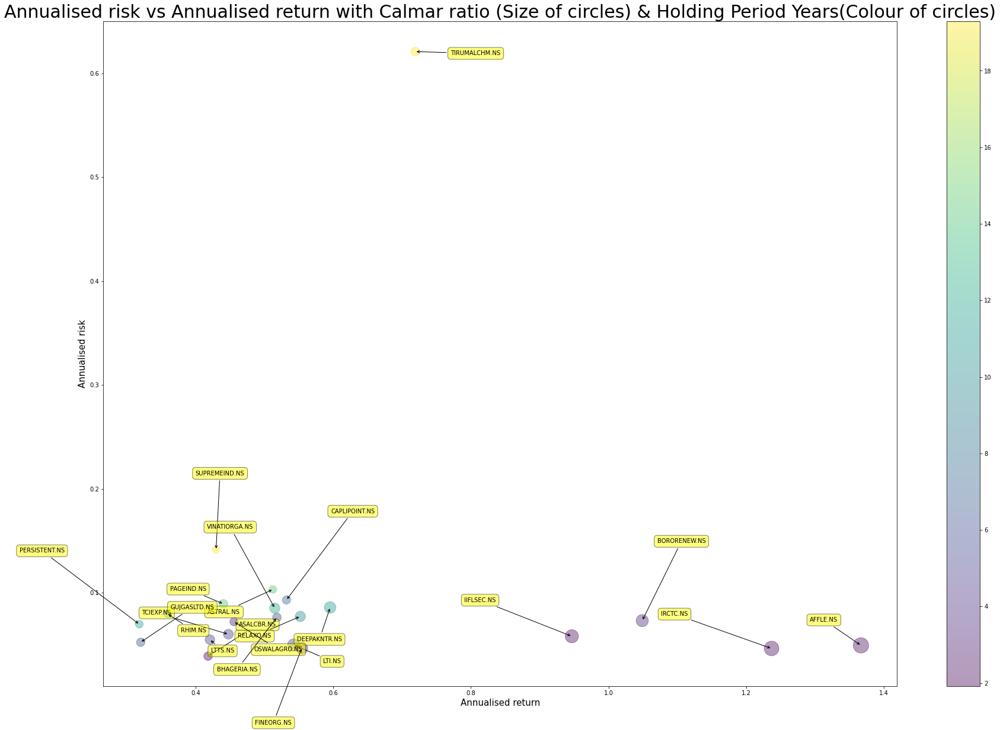

<Figure size 432x288 with 0 Axes>

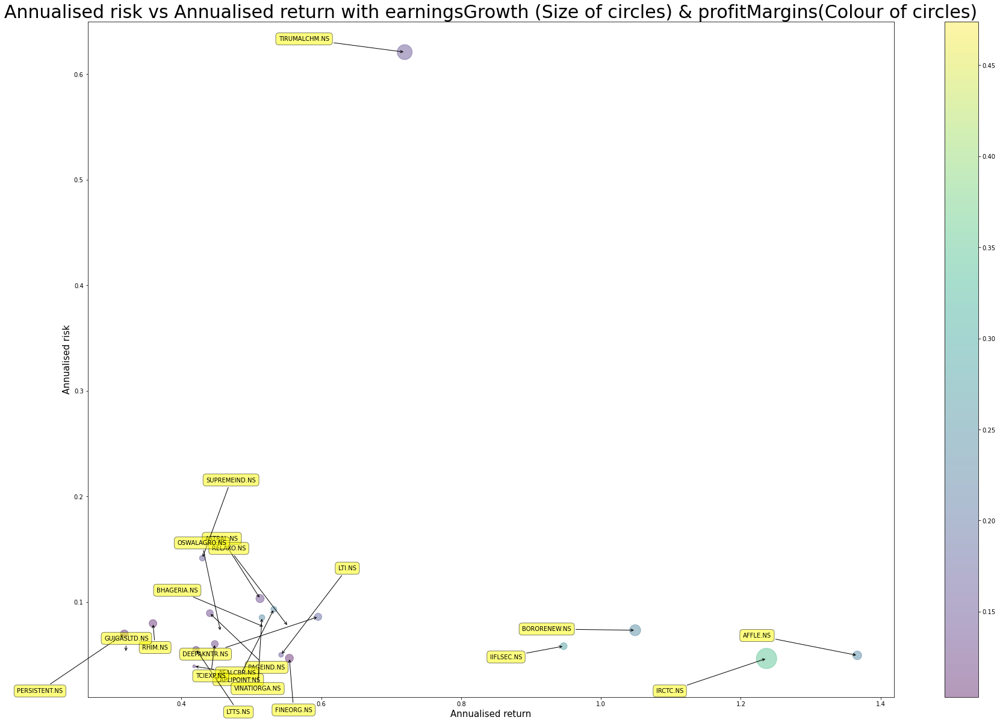

<Figure size 432x288 with 0 Axes>

In [16]:
def display_scatter_graph(data, x_param, y_param, colour_param, circle_size_param):
    #####################################################################
    ############ plt.scatter NOT EFFICIENT FOR large dataset ############ 
    #####################################################################
    rets = data #.dropna()#.sort_values(by=["Average drawdown", 'Max drawdown'])

    labels = rets.index

    rng = np.random.RandomState(0)
    colors = rng.rand(100)
    title = y_param + " vs " + x_param + " with " + circle_size_param + " (Size of circles) & " + colour_param +  "(Colour of circles)"
    fig=plt.figure(figsize=(30,20))
    plt.xlabel(x_param, fontsize=15)
    plt.ylabel(y_param, fontsize=15)
    plt.title(title, fontsize=30)
    plt.subplots_adjust(bottom = 0.1)
    colors[:len(rets.index)]
    plt.scatter(
    #    data[:, 0], data[:, 1], marker='o', c=data[:, 2], s=data[:, 3] * 1500,
        #rets["Annualised return"], rets["Annualised risk"], marker='o', c=colors[:len(rets.index)], alpha=0.8, s=rets["Calmar ratio"]*50, cmap='viridis')
        rets[x_param], rets[y_param], marker='o', c=rets[colour_param], alpha=0.4, s=rets[circle_size_param]*300, cmap='viridis')
    #    cmap=plt.get_cmap('Spectral'))
    plt.colorbar();  # show color scale

    for label, x, y in zip(labels, rets[x_param], rets[y_param]):
        # plt.annotate(
        #     label,
        #     xy=(x, y), xytext=(-20, 20),
        #     textcoords='offset points', ha='right', va='bottom',
        #     bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
        #     arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
        plt.annotate(
            label,
            xy=(x, y), xytext=(random.randint(-150, 150), random.randint(-150, 150)),
            textcoords='offset points', ha='right', va='bottom',
            bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
            arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
    plt.show()

    #fig.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


data_directory
file = 'gsm_asm_groupby_sector_sorted_all_ratios.csv'
gsm_asm_groupby_sector_sorted_all_ratios = pd.DataFrame()

if (os.path.exists(data_directory + file)):
    gsm_asm_groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + file, sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

pd.set_option('display.max_columns', 500)
#gsm_asm_groupby_sector_sorted_all_ratios.head()

result = gsm_asm_groupby_sector_sorted_all_ratios

good = result.loc[(result["1 YEAR"] >= 50) & (result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 0.5) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 20) & (result['HeldPercentInsiders'] >= 0.20) & (result['profitMargins'] > 0.08) &
(np.logical_or(result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'] == 0, 
result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'].isna())) & 
(np.logical_or(result['(%) PLEDGE / DEMAT'] <= 10, result['(%) PLEDGE / DEMAT'].isna())) &
(result['50DMA>200DMA'] == True) & (result["Quarterly Average net_profit_margin"] >= 10 ) & ( result["Years Average net_profit_margin"] >= 8)]
good
# DMA 50 > DMA 200 AND DMA 50 previous day < DMA 200 previous day
#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]
#good
len(good.index)


display_scatter_graph(good, "Annualised return", "Annualised risk", "Holding Period Years", "Calmar ratio")

display_scatter_graph(good, "Annualised return", "Annualised risk", "profitMargins", "earningsGrowth")


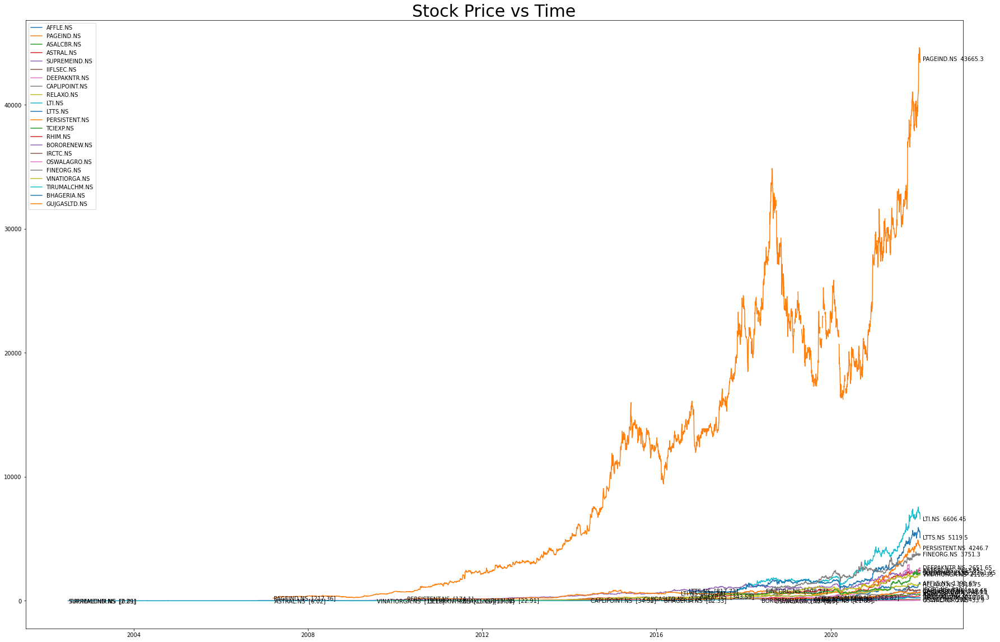

In [17]:
def display_annotated_stock_price(df_all_stock_price, title):
    fig, ax = plt.subplots(1, 1, figsize=(30, 20))
    ax.plot(df_all_stock_price.index ,df_all_stock_price)

    no_of_rows, no_of_columns = df_all_stock_price.shape
    plt.legend(labels=df_all_stock_price.columns)
    plt.title(title, fontsize=30)

    for i in df_all_stock_price.dropna().head(1).columns:
        df_cln = clean_dataset(pd.DataFrame(df_all_stock_price[i]))
        txt = i + "  " + str((df_cln.head(1).values[0]).round(2))
        ax.annotate(xy=(df_cln.head(1).index, df_cln.head(1)[i]), xytext=(1,0), textcoords='offset points', text=txt, va='center')

    for i in df_all_stock_price.dropna().tail(1).columns:
        txt = i + "  " + str((df_all_stock_price[i].dropna().tail(1).values[0]).round(2))
        ax.annotate(xy=(df_all_stock_price.dropna().tail(1).index, df_all_stock_price.dropna().tail(1)[i]), xytext=(5,0), textcoords='offset points', text=txt, va='center')

    return

display_annotated_stock_price(df_all_stock_price[good.index], 'Stock Price vs Time')

,AFFLE.NS,PAGEIND.NS,ASALCBR.NS,ASTRAL.NS,SUPREMEIND.NS,IIFLSEC.NS,DEEPAKNTR.NS,CAPLIPOINT.NS,RELAXO.NS,LTI.NS,LTTS.NS,PERSISTENT.NS,TCIEXP.NS,RHIM.NS,BORORENEW.NS,IRCTC.NS,OSWALAGRO.NS,FINEORG.NS,VINATIORGA.NS,TIRUMALCHM.NS,BHAGERIA.NS,GUJGASLTD.NS
482,0.928773,0.978781,0.775739,0.983191,0.86799,0.791548,0.905881,0.843833,0.917558,0.863713,0.847912,0.862417,0.852766,1.0,0.908508,0.715277,0.761364,0.942522,0.983808,0.795133,0.769926,0.89897


Date,2022-01-20
RHIM.NS,1.000000
VINATIORGA.NS,0.983808
ASTRAL.NS,0.983191
PAGEIND.NS,0.978781
FINEORG.NS,0.942522
AFFLE.NS,0.928773
RELAXO.NS,0.917558
BORORENEW.NS,0.908508
DEEPAKNTR.NS,0.905881
GUJGASLTD.NS,0.898970


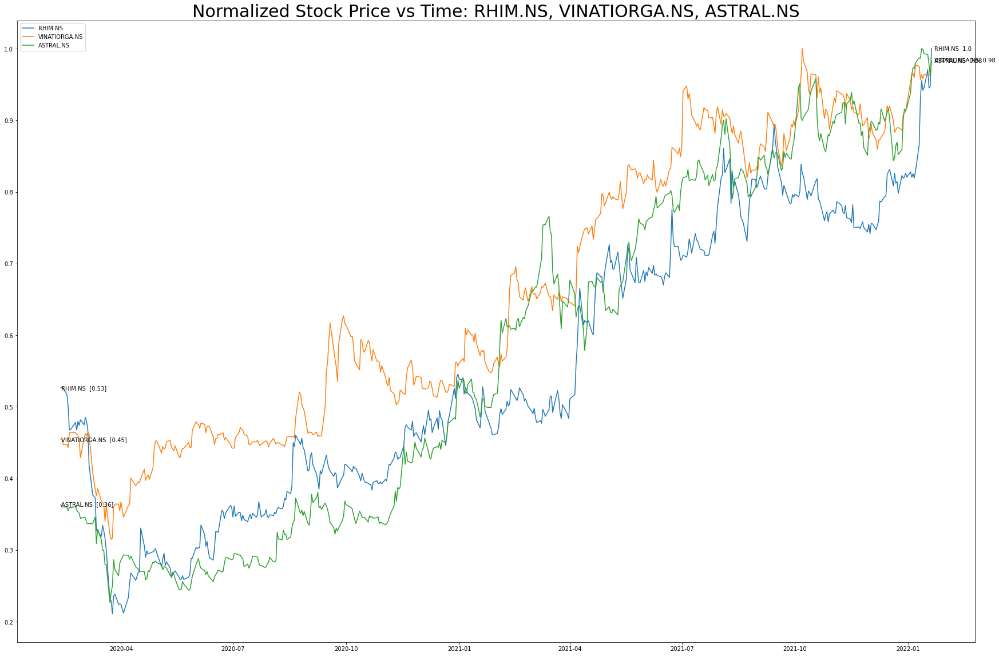

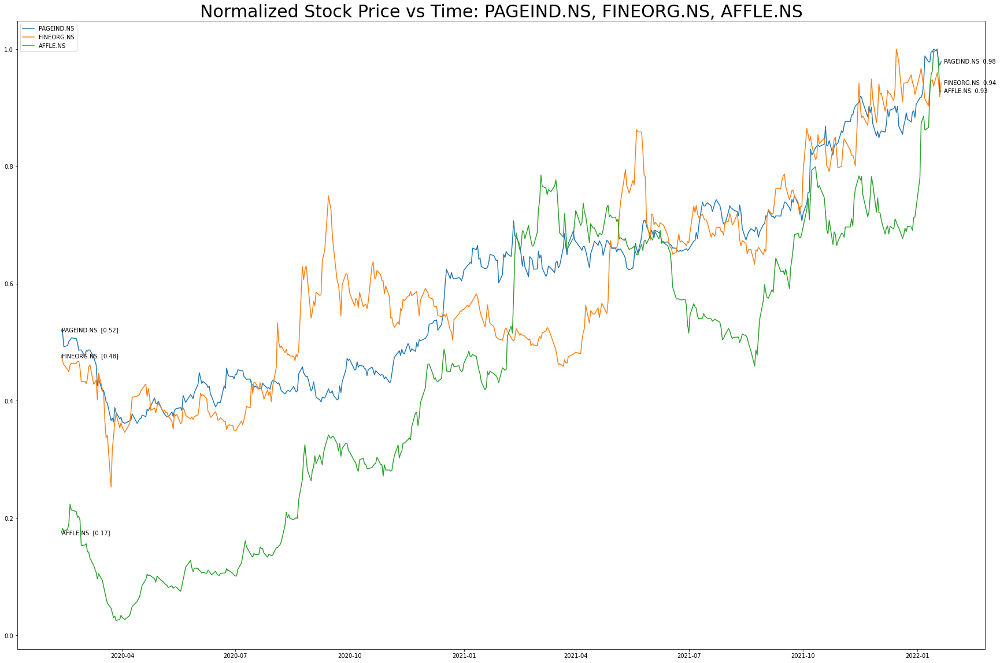

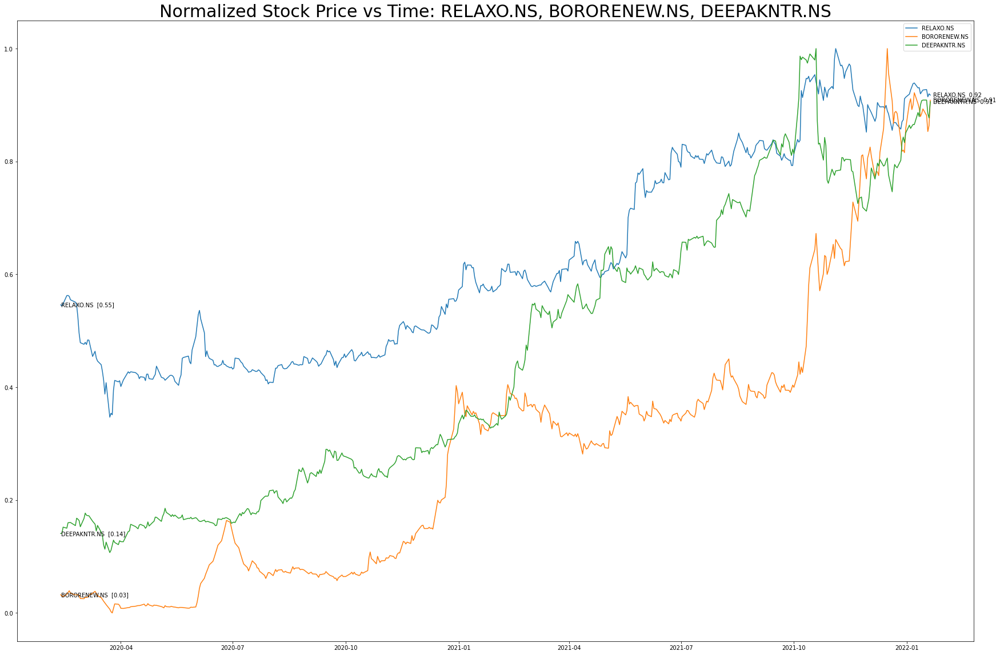

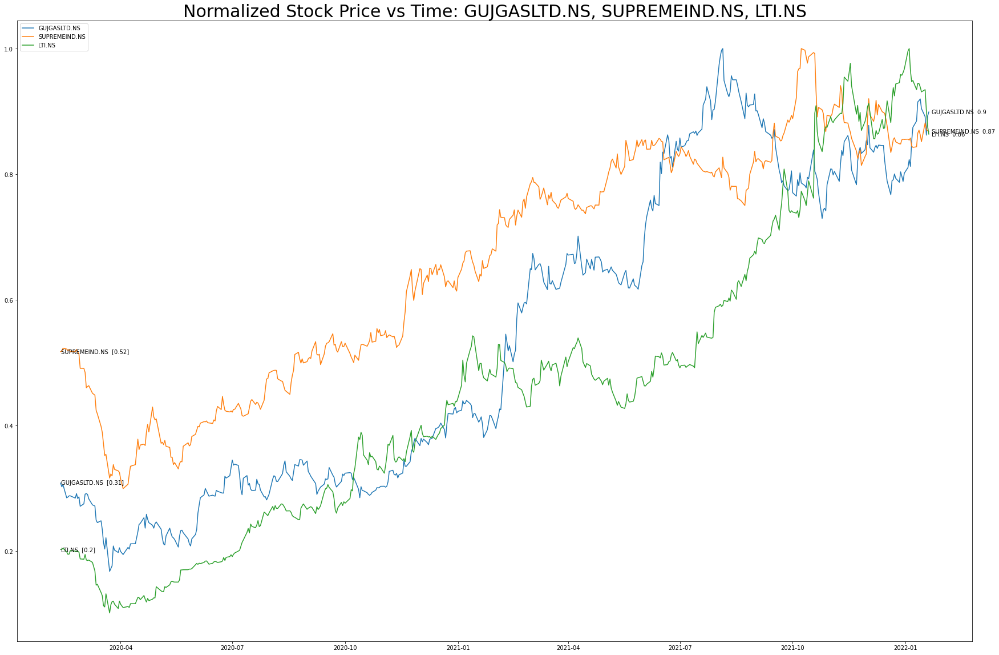

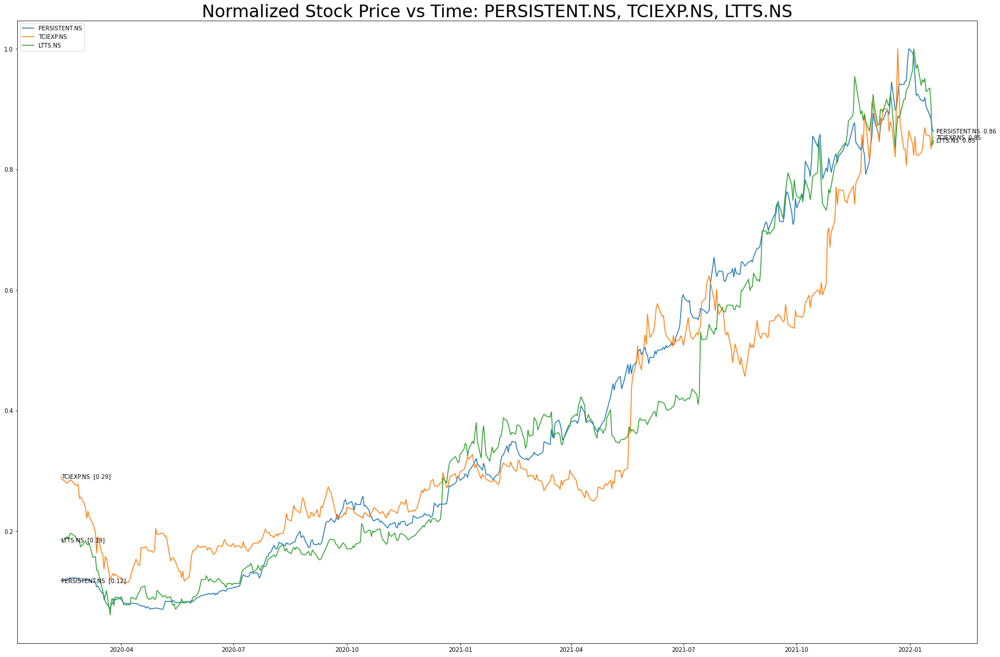

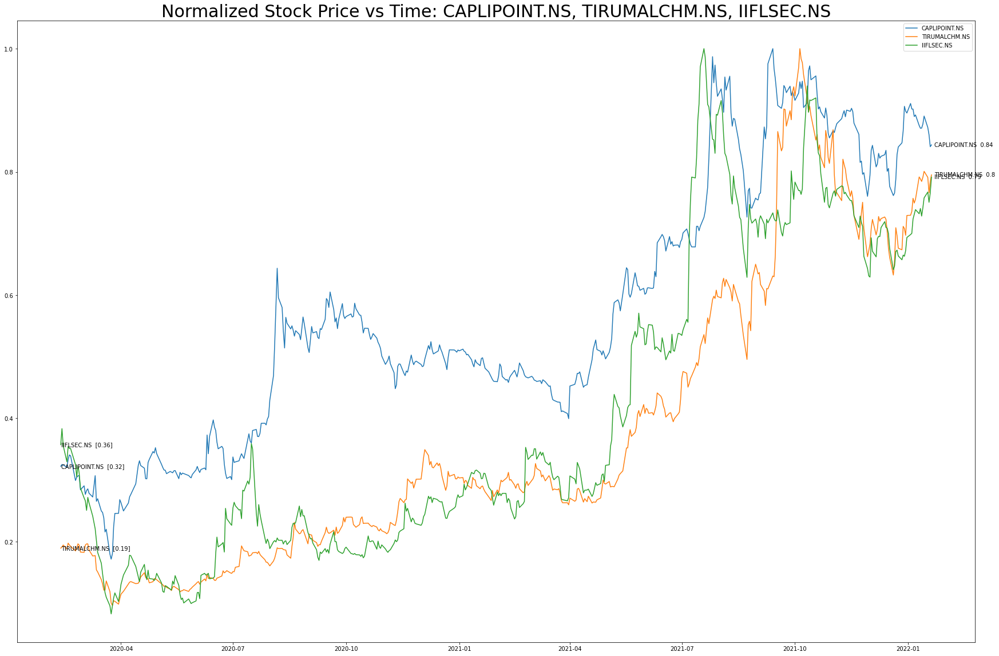

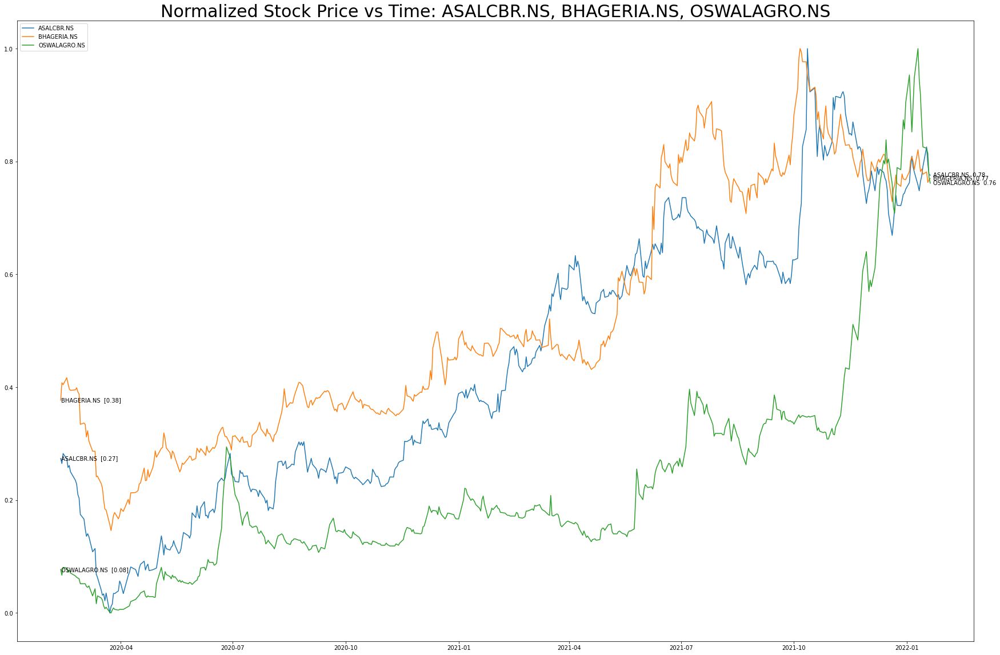

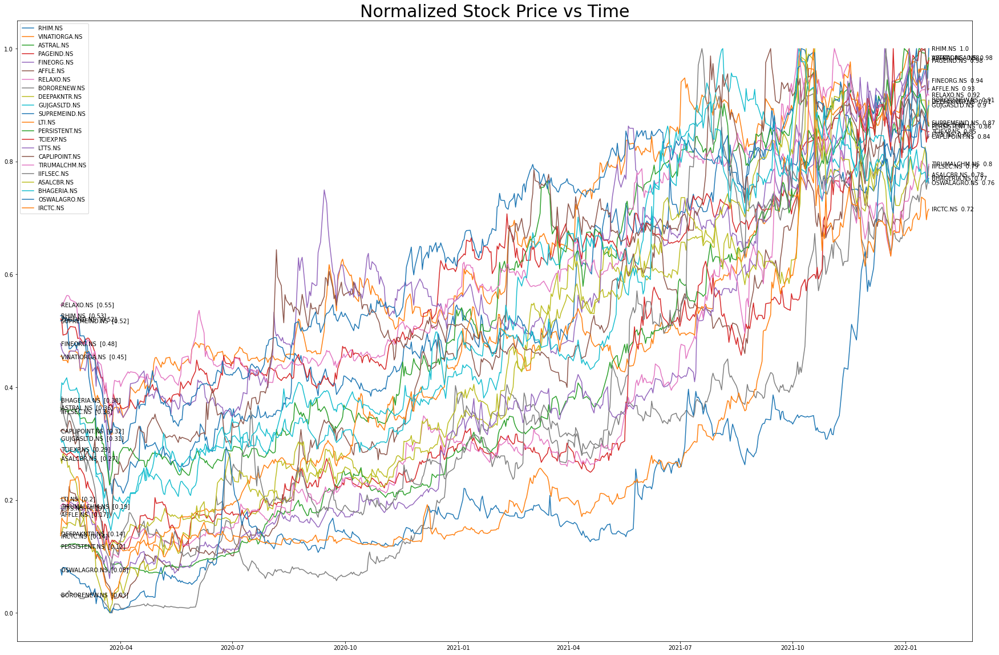

In [18]:
def normalize_data(df):
    # df on input should contain only one column with the price data (plus dataframe index)
    min = df.min()
    max = df.max()
    x = df 
    
    # time series normalization part
    # y will be a column in a dataframe
    y = (x - min) / (max - min)
    return y

df_all_stock_price_normalized = normalize_data(df_all_stock_price[good.index]).dropna()
no_of_rows, no_of_columns =  df_all_stock_price_normalized.shape
df_all_stock_price_normalized_wo_index = df_all_stock_price_normalized.reset_index(inplace = False, drop = True)

last_day = df_all_stock_price_normalized_wo_index.tail(1)
last_day
x = last_day.to_dict('r')

dct = {k: v for k, v in sorted(x[0].items(), key=lambda item: item[1], reverse=True)}
sorted_stock = list(dct.keys())

#df_all_stock_price_normalized.head()
df_all_stock_price_normalized_sorted = df_all_stock_price_normalized[sorted_stock]
df_all_stock_price_normalized_sorted.tail(1).T

no_of_stocks_per_graph = 3
start = 0
for j in np.arange(no_of_stocks_per_graph,len(sorted_stock),no_of_stocks_per_graph):
    t = df_all_stock_price_normalized_sorted.T[start:j].T
    display_annotated_stock_price(t, 'Normalized Stock Price vs Time: ' + ', '.join(pd.Series(t[start:j].columns.values).to_list()))
    start = j

display_annotated_stock_price(df_all_stock_price_normalized_sorted, 'Normalized Stock Price vs Time')

In [19]:
#sorted_all_ratios = sorted_all_ratios[["Annualised return", "Expected return[Equity Risk Premium based]", "Annualised risk", "Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Max drawdown", "Average drawdown", "Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", "Semideviation"]]
#sorted_all_ratios = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)

# too_good  = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 1.0) & 
# (result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
# (result['debtToEquity(Ideally 0.3 or less)'] <= 40) & (result['HeldPercentInsiders'] >= 0.45) & (result['profitMargins'] > 0.1) &
# (np.logical_or(result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'] == 0, 
# result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'].isna())) & 
# (np.logical_or(result['(%) PLEDGE / DEMAT'] <= 10, result['(%) PLEDGE / DEMAT'].isna())) &
# (result['50DMA>200DMA'] == True)]


# too_good  = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 0.8) & 
# (result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
# (result['debtToEquity(Ideally 0.3 or less)'] <= 20) & (result['HeldPercentInsiders'] >= 0.30) & (result['profitMargins'] > 0.08) &
# (np.logical_or(result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'] == 0, 
# result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'].isna())) & 
# (np.logical_or(result['(%) PLEDGE / DEMAT'] <= 10, result['(%) PLEDGE / DEMAT'].isna())) &
# (result['50DMA>200DMA'] == True)]

too_good = result.loc[(result["1 YEAR"] >= 50) & (result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 0.5) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 20) & (result['HeldPercentInsiders'] >= 0.20) & (result['profitMargins'] > 0.08) &
(np.logical_or(result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'] == 0, 
result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'].isna())) & 
(np.logical_or(result['(%) PLEDGE / DEMAT'] <= 10, result['(%) PLEDGE / DEMAT'].isna())) &
(result['50DMA>200DMA'] == True) & (result["Quarterly Average net_profit_margin"] >= 10 ) & ( result["Years Average net_profit_margin"] >= 8)]

#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]

#too_good = result.loc[(result["Annualised return"] >= 0.5) & (result['Calmar ratio'] >= 3.0) & (result['Sharpe ratio'] >= 3.0) & (result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000)]
too_good


,Industry,Sector,Industry.1,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,50DMA>200DMA,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary,"('quarterly', '2005-06-30')","('quarterly', '2006-06-30')","('quarterly', '2007-03-31')","('quarterly', '2008-06-30')","('quarterly', '2008-09-30')","('quarterly', '2008-12-31')","('quarterly', '2009-03-31')","('quarterly', '2010-06-30')","('quarterly', '2010-09-30')","('quarterly', '2010-12-31')","('quarterly', '2011-03-31')","('quarterly', '2013-06-30')","('quarterly', '2013-09-30')","('quarterly', '2013-12-31')","('quarterly', '2014-03-31')","('quarterly', '2015-06-30')","('quarterly', '2015-09-30')","('quarterly', '2015-12-31')","('quarterly', '2016-03-31')","('quarterly', '2016-06-30')","('quarterly', '2016-09-30')","('quarterly', '2016-12-31')","('quarterly', '2017-03-31')","('quarterly', '2017-06-30')","('quarterly', '2017-09-30')","('quarterly', '2017-12-31')","('quarterly', '2018-03-31')","('quarterly', '2018-06-30')","('quarterly', '2018-09-30')","('quarterly', '2018-12-31')","('quarterly', '2019-03-31')","('quarterly', '2019-06-30')","('quarterly', '2019-09-30')","('quarterly', '2019-12-31')","('quarterly', '2020-03-31')","('quarterly', '2020-06-30')","('quarterly', '2020-09-30')","('quarterly', '2020-12-30')","('quarterly', '2020-12-31')","('quarterly', '2021-03-31')","('quarterly', '2021-06-30')","('quarterly', '2021-09-30')","('quarterly', '2021-09-30.1')","('quarterly', '2021-12-31')","('quarterly', 'Adj Close')","('quarterly', 'Close')","('quarterly', 'High')","('quarterly', 'Low')","('quarterly', 'Open')","('quarterly', 'Volume')","('yearly', '2009-03-31')","('yearly', '2014-03-31')","('yearly', '2015-03-31')","('yearly', '2015-06-30')","('yearly', '2016-03-31')","('yearly', '2017-03-31')","('yearly', '2017-12-31')","('yearly', '2018-03-31')","('yearly', '2018-04-01')","('yearly', '2018-06-30')","('yearly', '2018-09-30')","('yearly', '2018-12-31')","('yearly', '2019-03-31')","('yearly', '2019-06-30')","('yearly', '2019-09-30')","('yearly', '2019-12-31')","('yearly', '2020-03-31')","('yearly', '2020-04-01')","('yearly', '2020-06-30')","('yearly', '2020-09-30')","('yearly', '2020-12-31')","('yearly', '2021-03-31')","('yearly', '2021-06-30')","('yearly', '2021-09-30')",Quarterly Average net_profit_margin,Years Average net_profit_margin
stock,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AFFLE.NS,Advertising Agencies,Communication Services,Advertising Agencies,0.237695,0.234082,30.438653,31.893702,229.275503,NaN,NaN,NaN,6.964574e+02,1.36671,2.408730,NaN,NaN,NaN,1.849990e+11,1.870633e+11,0.709,NaN,1388.35,2.257845,-75.690420,13.357591,26.587302,2.192850,1.284114,11.637456,11.631952,0.108533,0.582728,-0.017383,0.099,0.049486,57.178,0.6,0.110395,0.59911,0.18586,NaN,NaN,78.688,15.778,0.26442,0.23270,NaN,17.95,104.347984,0.921573,1175.483,1036.63760,True,NaN,0.0000,950604.0,938303.0,NaN,NaN,1.762186,"Affle (India) Limited, together with its subsi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

stock,LTI.NS,IRCTC.NS,LTTS.NS,PAGEIND.NS,ASTRAL.NS,GUJGASLTD.NS,DEEPAKNTR.NS,RELAXO.NS,PERSISTENT.NS,SUPREMEIND.NS,VINATIORGA.NS,AFFLE.NS,FINEORG.NS,TCIEXP.NS,BORORENEW.NS,RHIM.NS,CAPLIPOINT.NS,IIFLSEC.NS,TIRUMALCHM.NS,BHAGERIA.NS,ASALCBR.NS,OSWALAGRO.NS
MarketCap,117347.726131,70075.999846,53560.534630,48749.546701,48047.007334,47963.573453,35022.310605,32935.382221,32612.456858,29047.262413,21439.296307,18499.901850,11266.630451,8525.029376,8180.328038,6770.598707,6121.369190,2996.166861,2610.382029,1079.975731,968.354714,460.426086
enterpriseValue,129250.623488,65884.907110,57892.457677,47974.452429,47795.952026,44888.100045,35441.632870,33064.825651,35601.232691,28478.911283,21271.873126,18706.332058,11629.806387,8345.863782,8394.993664,5930.549248,6002.476646,-157.756557,2220.039373,1058.218291,871.006618,305.051674


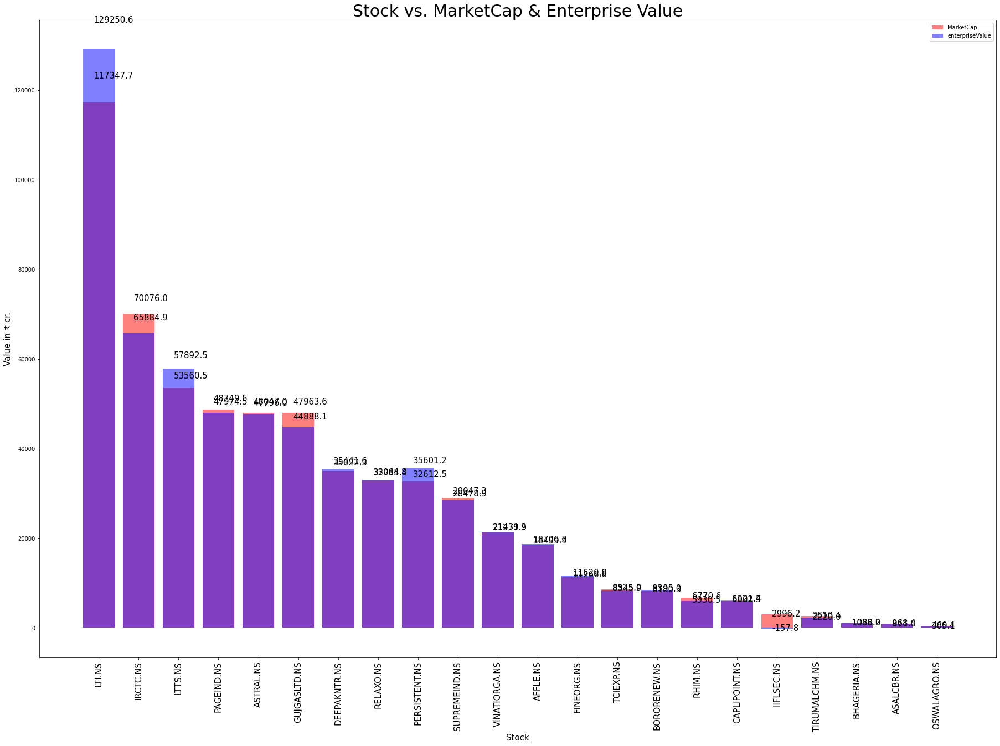

In [20]:
# xtick_parm1, xtick_parm2 are columns names within dataframe data
def display_bar_graph_two_parameters(data, xtick_parm1, xtick_parm2, xlabel, ylabel, title):
    xticks = data.columns

    fig=plt.figure(figsize=(24,16))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel(ylabel, fontsize=15)
    plt.title(title, fontsize=30)
    plt.xticks(range(len(xticks)), xticks, rotation='vertical', fontsize=15)
    #plt.scatter(range(len(rets.columns)), rets.loc["Calmar Ratio", : ], s=area)

    ax.bar(range(len(xticks)), data.loc[xtick_parm1], color='r', alpha=0.5)
    ax.bar(range(len(xticks)), data.loc[xtick_parm2], color='b', alpha=0.5)
    #ax.bar(range(len(rets.columns)), np.clip(rets.loc["Sterling Ratio", : ], -0.5, 1.5), color='b')

    # Annotate Text
    for i, ar in enumerate(data.loc[xtick_parm1]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)


    for i, ar in enumerate(data.loc[xtick_parm2]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)

    #p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1,  angle=0.0, facecolor='red', label="red", transform=fig.transFigure)
    #p2 = patches.Rectangle((.124,-0.005), width=.446, height=.13, alpha=.1,  angle=0.0, facecolor='green', label="green", transform=fig.transFigure)
    #fig.add_artist(p1)
    #fig.add_artist(p2)

    ax.legend(labels=[xtick_parm1, xtick_parm2])
    plt.savefig(data_directory + title + ".svg")

    return

title = "Stock vs. MarketCap & Enterprise Value"

#rets = sorted_all_ratios.dropna().sort_values(by=['Annualised return'], ascending=False)
rets = too_good[['MarketCap', 'enterpriseValue']].sort_values(by=['MarketCap'], ascending=False)
rets = np.divide(rets, 10000000)
rets = rets.T
rets

display_bar_graph_two_parameters(rets, 'MarketCap', 'enterpriseValue', "Stock", "Value in ₹ cr.", title)

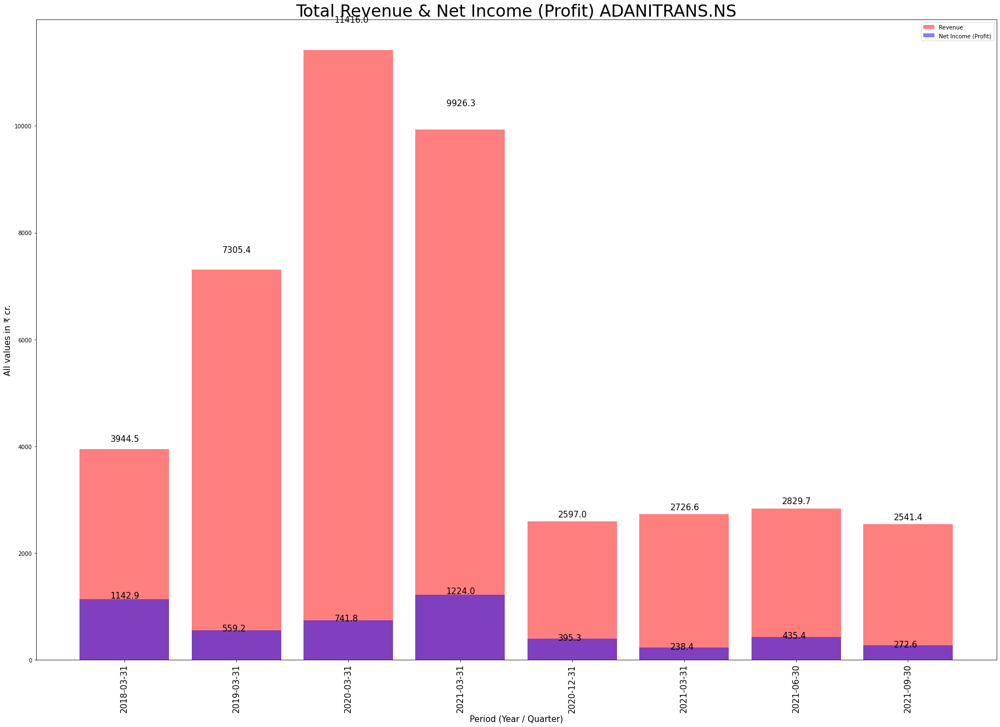

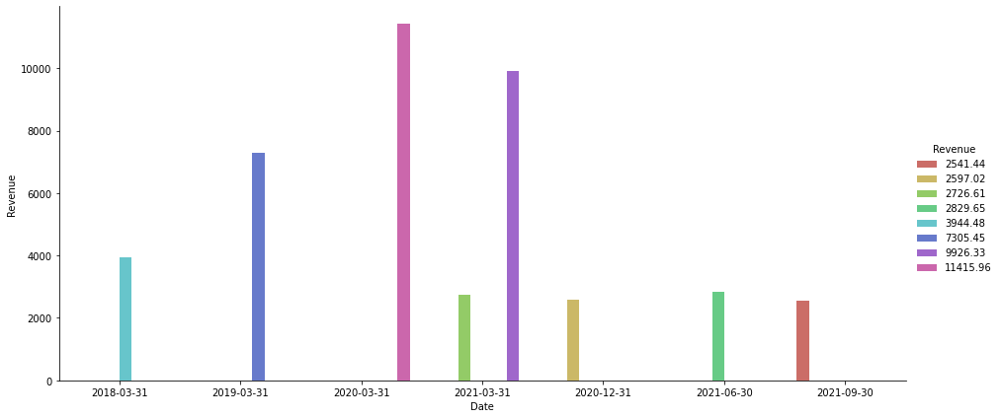

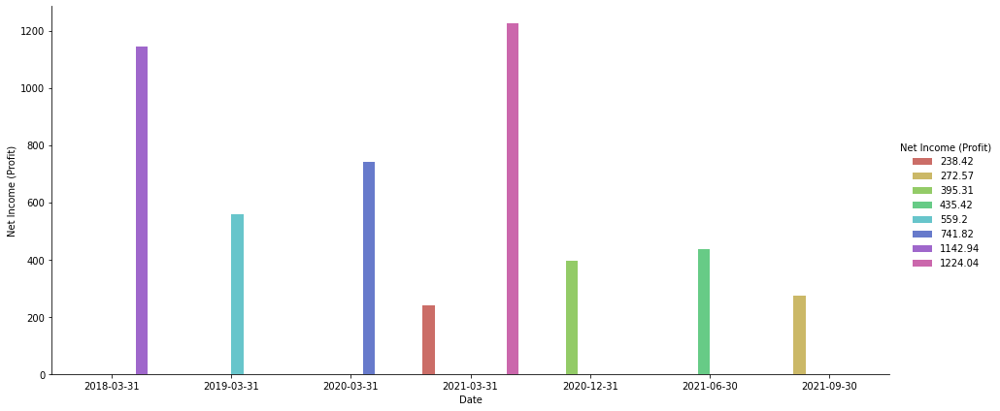

In [21]:
import seaborn as sns

def get_financial(stock):
    financial = pd.DataFrame()
    if (os.path.exists(data_directory + stock + '_financials.csv')):
        financial_yearly = pd.read_csv(data_directory + stock + '_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial_quarterly = pd.read_csv(data_directory + stock + '_quarterly_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial = pd.concat([financial_yearly, financial_quarterly], axis=1)
        financial = financial.T

        financial.rename(columns = {'Total Revenue':'Revenue'}, inplace = True)
        financial.rename(columns = {'Net Income':'Net Income (Profit)'}, inplace = True)
        try:
            financial = financial[['Revenue', 'Net Income (Profit)']].T
        except KeyError:
            print("Oops!", sys.exc_info(), "occurred.")
    else:
        print("File does not exist!!")
    
    return financial


title = "Total Revenue & Net Income (Profit)"

for i in ['ADANITRANS.NS']: #too_good.index[:1]:
    financial  = get_financial(i).divide(10000000) #Convert into crore

    display_bar_graph_two_parameters(financial, 'Revenue', 'Net Income (Profit)', 'Period (Year / Quarter)', 'All values in ₹ cr.', title + " " + i)

    financial = financial.T.reset_index()
    financial.columns = ["Date", "Revenue", "Net Income (Profit)"]
    sns.catplot(x='Date', y='Revenue', hue='Revenue', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')
    sns.catplot(x='Date', y='Net Income (Profit)', hue='Net Income (Profit)', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')

0 AFFLE.NS
1 PAGEIND.NS
2 ASALCBR.NS
3 ASTRAL.NS
4 SUPREMEIND.NS
5 IIFLSEC.NS
6 DEEPAKNTR.NS
7 CAPLIPOINT.NS
8 RELAXO.NS
9 LTI.NS
10 LTTS.NS
11 PERSISTENT.NS
12 TCIEXP.NS
13 RHIM.NS
14 BORORENEW.NS
15 IRCTC.NS
16 OSWALAGRO.NS
17 FINEORG.NS
18 VINATIORGA.NS
19 TIRUMALCHM.NS
20 BHAGERIA.NS
21 GUJGASLTD.NS


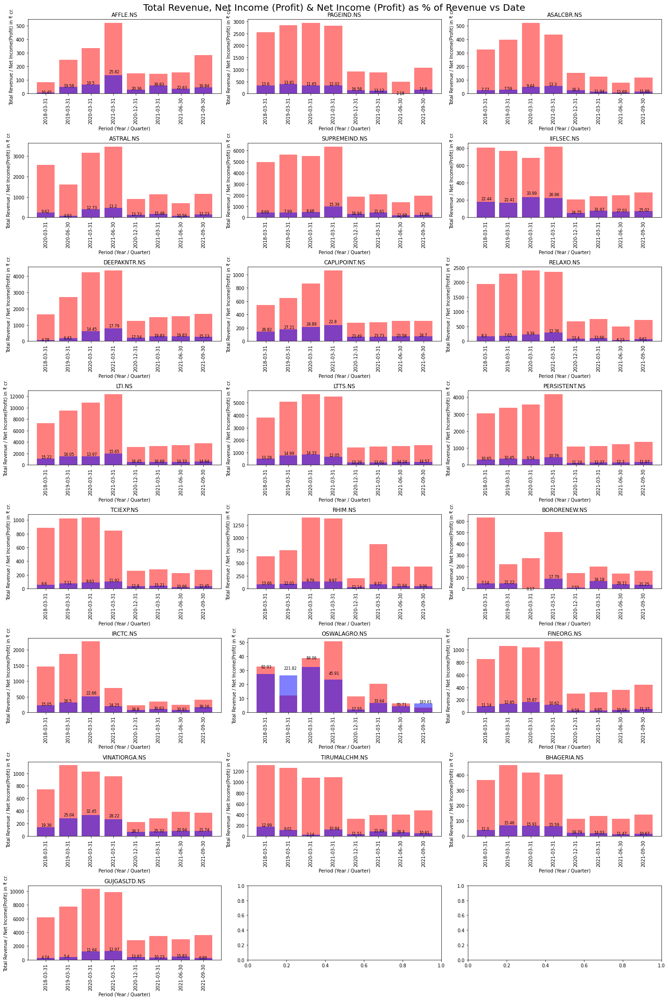

In [22]:

def display_multigrid_bar_graph(list_of_stocks, num_of_columns_in_subplot):
    length = len(list_of_stocks)
    length

    num_of_columns_in_subplot
    num_of_rows_in_subplot = math.ceil(length / num_of_columns_in_subplot)
    num_of_rows_in_subplot

    fig, ax_lst = plt.subplots(num_of_rows_in_subplot, num_of_columns_in_subplot)  # a figure with a 2x2 grid of Axes
    fig.set_figheight(6 * 5)
    fig.set_figwidth(4 * 5)

    fig.suptitle('Total Revenue, Net Income (Profit) & Net Income (Profit) as % of Revenue vs Date', fontsize=20,  y=0.99 )  # add a overall title

    for i, v in enumerate(list_of_stocks):
        print(i, v)
        r= int(i/num_of_columns_in_subplot)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_title(list_of_stocks[i])
        try:
            financial  = get_financial(v).divide(10000000).T.reset_index() #Convert into crore
            percent_profit_of_revenue = ((financial['Net Income (Profit)'] / financial['Revenue']) * 100).round(2)
            #percent_profit_of_revenue
            financial = pd.concat([financial, percent_profit_of_revenue], axis=1)
            financial.columns = ["Date", "Revenue", "Net Income (Profit)", "Profit as % of revenue"]
            ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Revenue'])), financial['Revenue'], color='r', alpha=0.5)
            ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Net Income (Profit)'])), financial['Net Income (Profit)'], color='b', alpha=0.5)
            #g = sns.catplot(x='Date', y='Revenue', hue='Revenue', data=f, kind='bar', legend=True, palette='hls', ax=ax_lst[r,i-(num_of_columns_in_subplot*r)]) # pass ax

            ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticks(range(len(financial['Date'])))
            ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticklabels(financial['Date'], rotation='vertical', fontsize=10)
            ax_lst[r,i-(num_of_columns_in_subplot*r)].set(xlabel='Period (Year / Quarter)', ylabel='Total Revenue / Net Income(Profit) in ₹ cr.')

            # Annotate Text
            for y, profit_percentage in enumerate(financial['Net Income (Profit)']):
                ax_lst[r,i-(num_of_columns_in_subplot*r)].text(y-0.2, financial['Net Income (Profit)'][y] * 1.20, financial["Profit as % of revenue"][y], verticalalignment='center', fontsize=8)
        except KeyError:
            print("Oops!", sys.exc_info(), "occurred.")
        except Exception as e:
            exc_type, exc_value, exc_tb = sys.exc_info()
            fname = os.path.split(exc_tb.tb_frame.f_code.co_filename)[1]
            print("Oops!", exc_type, exc_value, fname, exc_tb.tb_lineno, "occurred", traceback.format_exc())
    plt.tight_layout()




display_multigrid_bar_graph(too_good.index, 3)

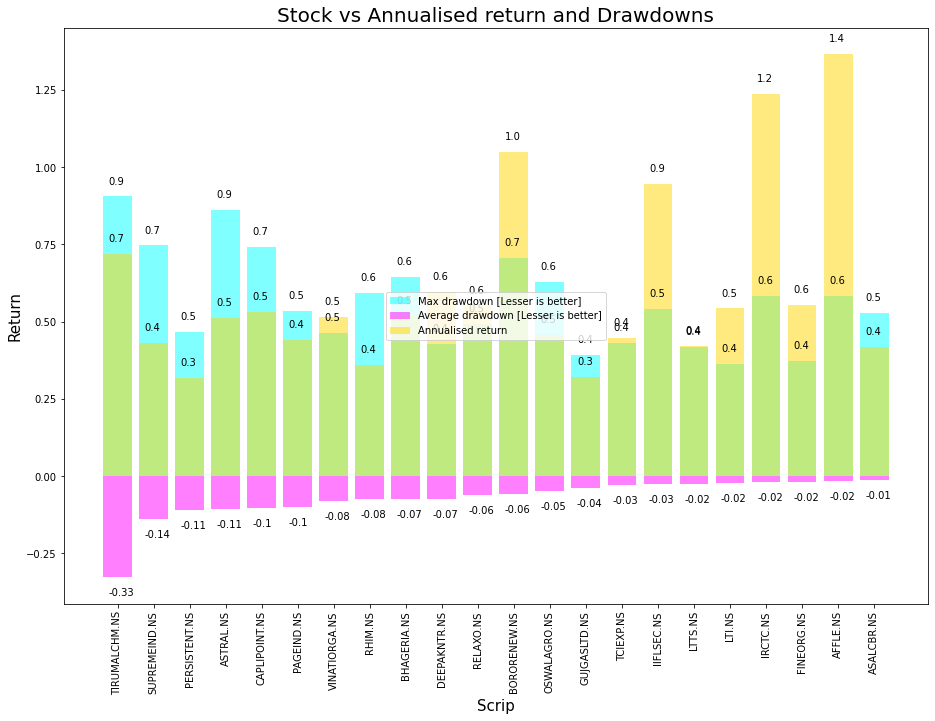

In [23]:


def add_annotate_text(y_axis_values, ax, lower_clip_limit=0, upper_clip_limit=100000):
    # # Annotate Text
    for i, ar in enumerate(y_axis_values):
        if (ar > 0.0):
            if (ar > upper_clip_limit):
                ax.text(i-0.25, upper_clip_limit, round(ar, 1), verticalalignment='center')
            else:
                ax.text(i-0.25, ar+0.05, round(ar, 1), verticalalignment='center')
        elif (ar < 0.0):
            if (ar > lower_clip_limit):
                ax.text(i-0.25, lower_clip_limit, round(ar, 2), verticalalignment='center')
            else:
                ax.text(i-0.25, ar-0.05, round(ar, 2), verticalalignment='center')
        else:
            ax.text(i-0.25, ar, round(ar, 2), verticalalignment='center')


def display_overlapping_multi_bar_graph(rets):
    title = "Stock vs Annualised return and Drawdowns"

    fig=plt.figure(figsize=(12,8))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel("Scrip", fontsize=15)
    plt.ylabel("Return", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(range(len(rets.columns)), rets.columns, rotation='vertical')

    ax.bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    add_annotate_text(rets.loc["Max drawdown", : ], ax)
    ax.bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)
    add_annotate_text(rets.loc["Average drawdown", : ], ax)
    lower_clip_limit = -0.5
    upper_clip_limit = 1.5
    ax.bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ], lower_clip_limit, upper_clip_limit), color='gold', alpha=0.5)
    add_annotate_text(rets.loc['Annualised return', : ], ax, lower_clip_limit, upper_clip_limit)


    ax.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


rets = too_good[['Annualised return', 'Average drawdown', 'Max drawdown']].dropna().sort_values(by=["Average drawdown", 'Max drawdown'])
rets = rets.T
display_overlapping_multi_bar_graph(rets)


,Industry,Sector,Industry.1,1 DAY,1 WEEK,1 MONTH,6 MONTHS,1 YEAR,2 YEAR,3 YEAR,5 YEAR,MAX,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,50DMA>200DMA,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary,"('quarterly', '2005-06-30')","('quarterly', '2006-06-30')","('quarterly', '2007-03-31')","('quarterly', '2008-06-30')","('quarterly', '2008-09-30')","('quarterly', '2008-12-31')","('quarterly', '2009-03-31')","('quarterly', '2010-06-30')","('quarterly', '2010-09-30')","('quarterly', '2010-12-31')","('quarterly', '2011-03-31')","('quarterly', '2013-06-30')","('quarterly', '2013-09-30')","('quarterly', '2013-12-31')","('quarterly', '2014-03-31')","('quarterly', '2015-06-30')","('quarterly', '2015-09-30')","('quarterly', '2015-12-31')","('quarterly', '2016-03-31')","('quarterly', '2016-06-30')","('quarterly', '2016-09-30')","('quarterly', '2016-12-31')","('quarterly', '2017-03-31')","('quarterly', '2017-06-30')","('quarterly', '2017-09-30')","('quarterly', '2017-12-31')","('quarterly', '2018-03-31')","('quarterly', '2018-06-30')","('quarterly', '2018-09-30')","('quarterly', '2018-12-31')","('quarterly', '2019-03-31')","('quarterly', '2019-06-30')","('quarterly', '2019-09-30')","('quarterly', '2019-12-31')","('quarterly', '2020-03-31')","('quarterly', '2020-06-30')","('quarterly', '2020-09-30')","('quarterly', '2020-12-30')","('quarterly', '2020-12-31')","('quarterly', '2021-03-31')","('quarterly', '2021-06-30')","('quarterly', '2021-09-30')","('quarterly', '2021-09-30.1')","('quarterly', '2021-12-31')","('quarterly', 'Adj Close')","('quarterly', 'Close')","('quarterly', 'High')","('quarterly', 'Low')","('quarterly', 'Open')","('quarterly', 'Volume')","('yearly', '2009-03-31')","('yearly', '2014-03-31')","('yearly', '2015-03-31')","('yearly', '2015-06-30')","('yearly', '2016-03-31')","('yearly', '2017-03-31')","('yearly', '2017-12-31')","('yearly', '2018-03-31')","('yearly', '2018-04-01')","('yearly', '2018-06-30')","('yearly', '2018-09-30')","('yearly', '2018-12-31')","('yearly', '2019-03-31')","('yearly', '2019-06-30')","('yearly', '2019-09-30')","('yearly', '2019-12-31')","('yearly', '2020-03-31')","('yearly', '2020-04-01')","('yearly', '2020-06-30')","('yearly', '2020-09-30')","('yearly', '2020-12-31')","('yearly', '2021-03-31')","('yearly', '2021-06-30')","('yearly', '2021-09-30')",Quarterly Average net_profit_margin,Years Average net_profit_margin
stock,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
TIRUMALCHM.NS,Specialty Chemicals,Basic Materials,Specialty Chemicals,1.353730,0.839352,10.431809,174.693915,284.611819,198.837092,50.878665,2681.972109,3.467014e+06,0.71930,19.289683,NaN,NaN,NaN,2.610382e+10,2.220039e+10,2.068,NaN,254.95,0.738498,-2.033456,1.799184,1.076603,0.742556,0.620906,4.343259,4.209033,0.141746,0.904945,-0.328652,0.123,0.620749,153.892,0.9,0.147517,0.42450,0.00345,0.0,6.54,93.545,17.954,0.29159,0.15010,0.0088,NaN,11.037273,1.715504,236.238,198.56250,True,0.008633,0.0951,681244.0,46783.0,2.2,1.626134e+09,1.176991,Thirumalai Chemicals Limited manufactures and ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

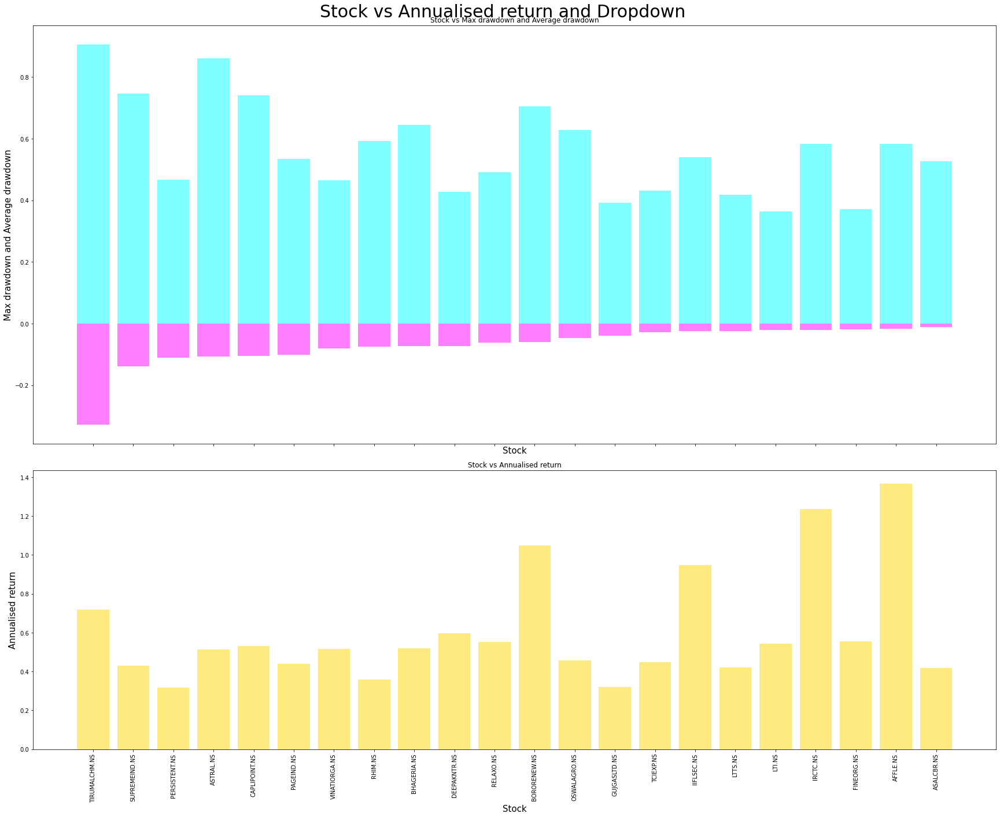

In [24]:
#color='rgbycmk'
#ax.set_color_cycle(colors)

def display_hortzontal_subplots(rets):
    # using subplot function and creating plot one
    # row 2, column 1, count 1
    fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, sharey=False, gridspec_kw={'height_ratios':[3,2]}, figsize=(24,20))
    fig.suptitle("Stock vs Annualised return and Dropdown", fontsize=30)
    #ax[0].plot(x, y, color='red')
    #ax[1].plot(x, y, color='blue')
    plt.gca().set_xlabel('Stock', fontsize=15)
    ax[0].set_xticks(range(len(rets.columns)))
    ax[0].set_xticklabels(rets.columns, rotation='vertical')
    ax[0].title.set_text('Stock vs Max drawdown and Average drawdown')
    ax[0].set_xlabel('Stock', fontsize=15)
    ax[0].set_ylabel('Max drawdown and Average drawdown', fontsize=15)
    ax[0].bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    ax[0].bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)

    ax[1].set_xticks(range(len(rets.columns)))
    ax[1].set_xticklabels(rets.columns, rotation='vertical')
    ax[1].title.set_text('Stock vs Annualised return')
    ax[1].set_xlabel('Stock', fontsize=15)
    ax[1].set_ylabel('Annualised return', fontsize=15)
    ax[1].bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ],-100, 150 ), color='gold', alpha=0.5)

    plt.subplots_adjust(left=1,
                        bottom=0.8, 
                        right=2, 
                        top=1, 
                        wspace=1,
                        hspace=1)
    fig.tight_layout()
    
    # show plot
    plt.show()

rets = too_good.sort_values(by=["Average drawdown", 'Max drawdown'])
rets.head()
rets = rets.T
display_hortzontal_subplots(rets)

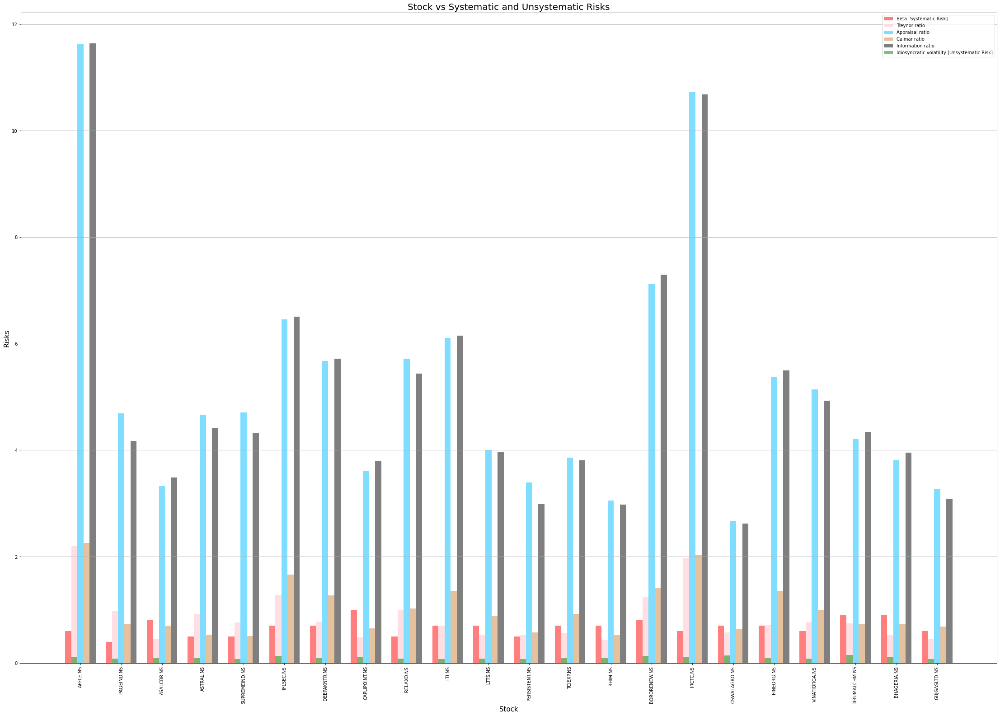

<Figure size 432x288 with 0 Axes>

In [25]:
#index = ["Annualised return", "Expected return", "Annualised risk", "Sharpe ratio", "Beta [Systematic Risk]", 
#        "Treynor ratio", "Jensen's alpha", "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]", "Appraisal ratio", 
#        "Semideviation", "Max drawdown", "Average drawdown", "Sortino ratio", "Calmar ratio", "Sterling ratio"]


def display_multibar_graph(rets, title):
    bar_width=0.3

    X = np.arange(len(rets.index.values))
    fig=plt.figure(figsize=(30,20))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel("Stock", fontsize=15)
    plt.ylabel("Risks", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(X+range(len(rets.index.values))+(bar_width*2), rets.index.values, rotation='vertical')

    # ax.bar(X + range(len(rets.columns))+0.0, rets.loc["Beta [Systematic Risk]", : ], color='r', alpha=0.5, width=bar_width)
    # ax.bar(X + range(len(rets.columns))+(bar_width*1), rets.loc["Treynor ratio", : ], color='pink', alpha=0.5, width=bar_width)
    # ax.bar(X + range(len(rets.columns))+(bar_width*2), rets.loc["Appraisal ratio", : ], color='deepskyblue', alpha=0.5, width=bar_width)
    # ax.bar(X + range(len(rets.columns))+(bar_width*3), rets.loc["Semideviation", : ], color='lawngreen', alpha=0.5, width=bar_width)

    ax.bar(X + range(len(rets.index.values))+0.0, rets["Beta [Systematic Risk]"], color='r', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Treynor ratio"], color='pink', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Appraisal ratio"], color='deepskyblue', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*3), rets["Calmar ratio"], color='peru', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets["Information ratio"], color='black', alpha=0.5, width=bar_width)

    ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Idiosyncratic volatility [Unsystematic Risk]"], color='g', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Annualised return"], color='b', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets.loc["Jensen's alpha", : ], color='aqua', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*5), rets.loc["Tracking error", : ], color='grey', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*7), rets["Annualised return"], color='orange', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*8), rets.loc["Expected return", : ], color='lawngreen', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*9), rets["Annualised risk"], color='peru', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*10), rets.loc["Information ratio", : ], color='black', alpha=0.5, width=bar_width)

    plt.legend(labels=["Beta [Systematic Risk]", "Treynor ratio", "Appraisal ratio", "Calmar ratio", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]"])
    plt.grid(axis = 'y')
    plt.show()
    plt.savefig(data_directory + title + ".svg")



title = "Stock vs Systematic and Unsystematic Risks"
rets = too_good

display_multibar_graph(rets, title)

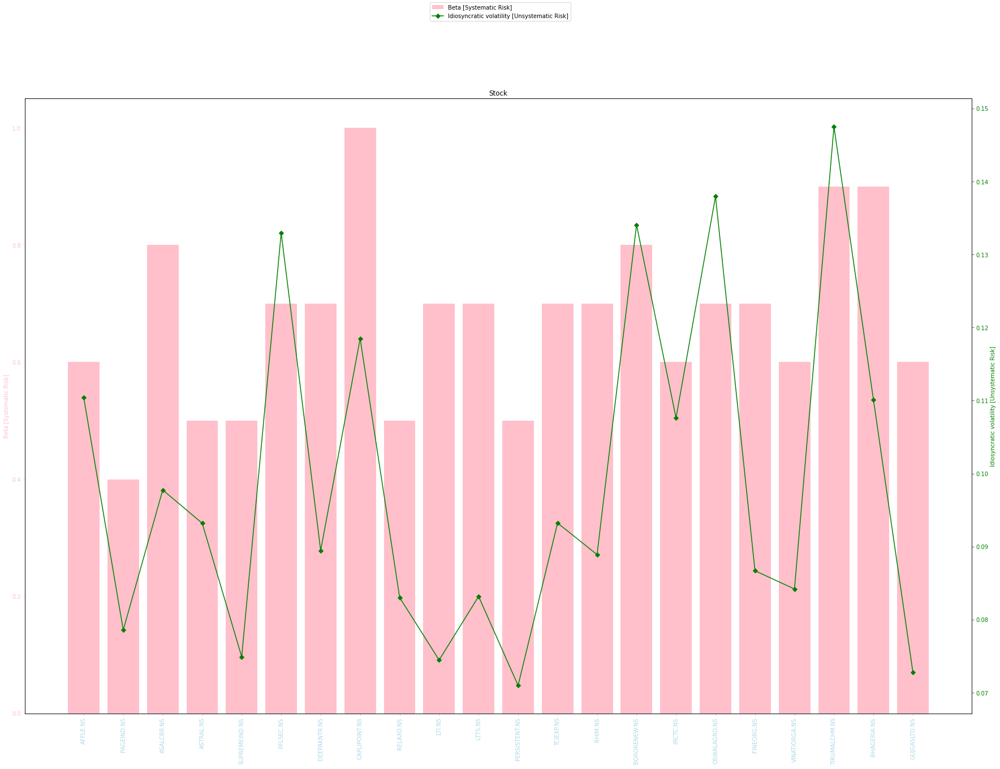

<Figure size 432x288 with 0 Axes>

In [26]:
def graph_with_two_y_axes(rets, x_param, y_param1, y_param2, title, color1, color2):
    #create basic bar plot
    fig, ax = plt.subplots()
    ax.bar(range(len(rets.columns)), rets.loc[y_param1, : ], color=color1)
    fig.set_figheight(20)
    fig.set_figwidth(30)

    # Set the ticks and ticklabels for all axes
    plt.setp(ax, xticks=range(len(x_param)), xticklabels= x_param, )
    ax.set_title('Stock')
    ax.set_xticks(range(len(x_param)), )
    ax.set_xticklabels(x_param)
    for tick in ax.get_xticklabels():
        tick.set_rotation(90)
    ax.tick_params(axis='x', colors='lightblue')
    ax.set_ylabel(y_param1)
    #specify axis colors
    ax.tick_params(axis='y', colors=color1)
    ax.yaxis.label.set_color(color1)

    ax2 = ax.twinx()
    ax2.plot(range(len(x_param)), rets.loc[y_param2, :], color=color2, marker="D", ms=line_size)
    ax2.set_ylabel(y_param2)
    ax2.yaxis.label.set_color(color2)
    ax2.tick_params(axis='y', colors=color2)

    #display Pareto chart
    fig.legend(labels=[y_param1, y_param2, "Annualised return"], loc='upper center')
    plt.show()
    plt.savefig(data_directory + title + ".svg")


rets = too_good.T

color1 = 'pink'
color2 = 'green'
line_size = 6
title = "Stock vs Beta [Systematic Risk] and Idiosyncratic volatility [Unsystematic Risk]"

graph_with_two_y_axes(rets, rets.columns, "Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", title, color1, color2 )



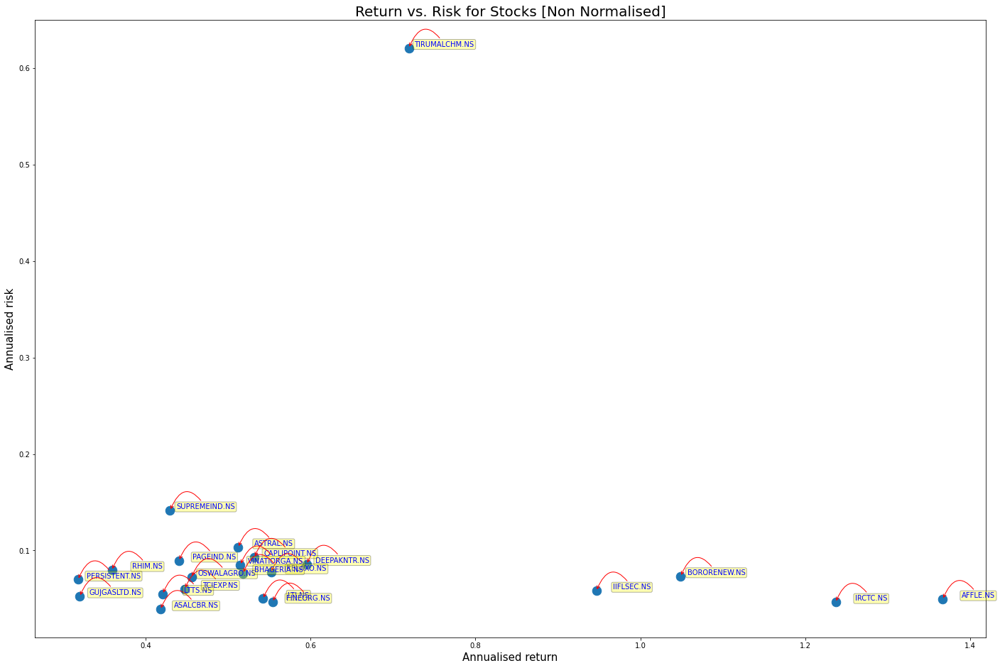

In [27]:
def scatter_graph_with_annotation(rets, x_param, y_param, title):
    area = np.pi*50.0
    # sns.set(style='darkgrid')
    plt.figure(figsize=(24,16))
    plt.scatter(rets[x_param], rets[y_param], s=area)
    plt.xlabel(x_param, fontsize=15)
    plt.ylabel(y_param, fontsize=15)
    plt.title(title, fontsize=20)

    for label, x, y in zip(rets.index, rets[x_param], rets[y_param]) : 
        plt.annotate(label, xy=(x,y), xytext=(50, 0), 
            textcoords='offset points', ha='center', va='bottom',color='blue',
            bbox=dict(boxstyle='round,pad=0.2', fc='yellow', alpha=0.3),
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.95', 
                                color='r'))

    plt.savefig(data_directory + title + ".svg")



rets = too_good#.dropna()
title = "Return vs. Risk for Stocks [Non Normalised]"

scatter_graph_with_annotation(rets, "Annualised return", "Annualised risk", title)


stock
AFFLE.NS         13.357591
PAGEIND.NS        2.018420
ASALCBR.NS        4.053116
ASTRAL.NS         2.018411
SUPREMEIND.NS     1.474988
IIFLSEC.NS        7.459175
DEEPAKNTR.NS      2.949925
CAPLIPOINT.NS     2.530107
RELAXO.NS         3.150028
LTI.NS            4.566304
LTTS.NS           3.045095
PERSISTENT.NS     1.669121
TCIEXP.NS         3.111437
RHIM.NS           1.765383
BORORENEW.NS      7.216766
IRCTC.NS         11.561028
OSWALAGRO.NS      2.710988
FINEORG.NS        5.216765
VINATIORGA.NS     2.652378
TIRUMALCHM.NS     1.799184
BHAGERIA.NS       2.968132
GUJGASLTD.NS      2.320657
Name: Sortino ratio, dtype: float64

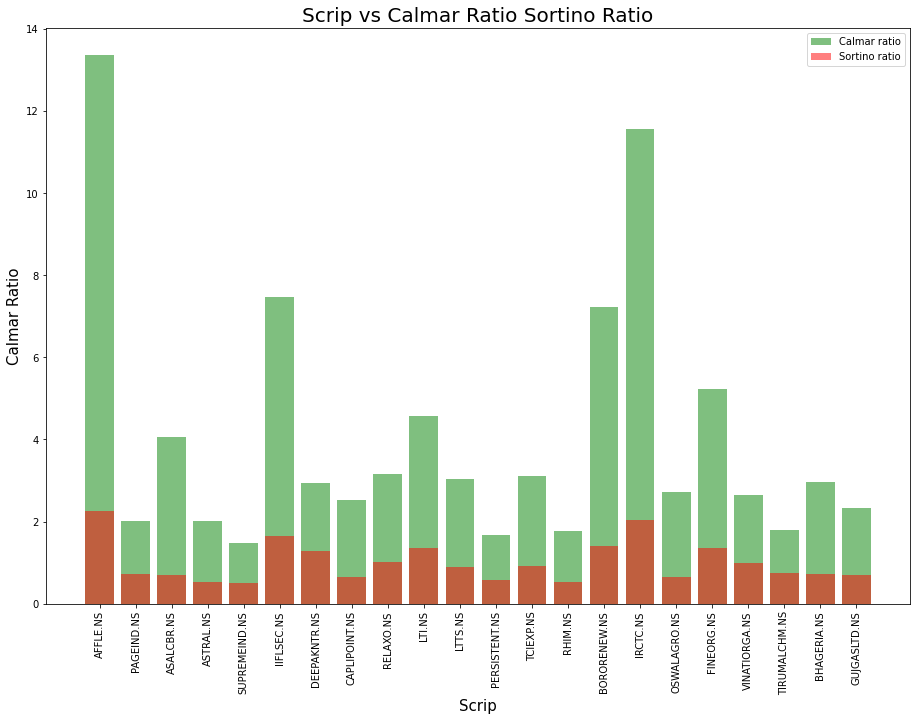

In [28]:


def display_stacked_bar_graph(rets, title):
    fig=plt.figure(figsize=(12,8))
    ax=fig.add_axes([0,0,1,1])

    plt.xlabel("Scrip", fontsize=15)
    plt.ylabel("Calmar Ratio", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(range(len(rets.index)), rets.index, rotation='vertical')

    #############################################################
    #          Data has been clipped for Outlier Stocks         #
    #############################################################
    #ax.bar(range(len(rets.columns)), np.clip(rets["Calmar Ratio"], -0.5, 1.5), color='r', alpha=0.5)
    #ax.bar(range(len(rets.index)), rets.loc["Calmar Ratio"], color='r', alpha=0.5)
    #ax.bar(range(len(rets.columns)), np.clip(rets["Sortino Ratio"], -0.5, 1.5), color='g', alpha=0.5)
    ax.bar(range(len(rets["Sortino ratio"])), rets["Sortino ratio"], color='g', alpha=0.5)
    ax.bar(range(len(rets["Calmar ratio"])), rets["Calmar ratio"], color='r', alpha=0.5)

    plt.legend(labels=["Calmar ratio", "Sortino ratio"])
    plt.savefig(data_directory + title + ".svg")


title = "Scrip vs Calmar Ratio Sortino Ratio"
rets = too_good[["Sortino ratio", "Calmar ratio"]] 
rets["Sortino ratio"]
display_stacked_bar_graph(rets, title)

In [29]:
def cumulative_returns(returns):
    
    return returns

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, np.NINF, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = (returns + 1).prod().squeeze()
    return cum_ret_final ** (1 / num_years) - 1

def calmar(returns):
    max_dd = max_drawdown(cumulative_returns(returns))
    if max_dd < 0:
        return annual_returns(returns) / abs(max_dd)
    return np.nan